## Morphodynamic and signaling state analysis

##### Load h5 files with image, segmentation, and cell features, apply data-driven modeling and analysis tools

In [1]:
#%%capture
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.append('/home/wsltools/programs/celltraj/celltraj')
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
#import bootstrap
import umap
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas
import itertools

Solver suite is petsc
{'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.0', 'matplotlib': '3.8.4', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': 'not installed', 'solver': 'petsc'}


##### Specify segmentation model files

In [2]:
date = '7July24'
os.system(f'mkdir -p {date}')
modelNames = [f'20240506_OS17lung_RM',f'20240418_OS17lung_RM',f'20240514_OS17lung_Control_R2M1_N1_RM',f'20240523_OS17lungInh_RM'] #results will be saved/named using this string
datapaths=['/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2','/home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1','/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1/','/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1/']

In [3]:
#some convenience visualization functions here, eventually these will be incorporated into the packages....
def show_image_3channel(bf_img,nuc_img,rep_img,ax=None):
        if ax is None:
            ax=plt.gca()
        ax.imshow(imprep.znorm(bf_img),cmap=plt.cm.binary,clim=(-5,5))
        cs=ax.contour(imprep.znorm(nuc_img),cmap=plt.cm.BuPu,levels=np.linspace(0,np.percentile(imprep.znorm(nuc_img),99),7),alpha=.5,linewidths=.5)
        cs.cmap.set_over('purple')
        cs=ax.contour(imprep.znorm(rep_img),cmap=plt.cm.YlOrBr_r,levels=np.linspace(0,np.percentile(imprep.znorm(rep_img),99),7),alpha=.25,linewidths=.5)
        cs.cmap.set_over('yellow')
        return ax

def rescale_to_int(img,maxint=255,dtype=np.uint16):
    img=maxint*((img-np.min(img))/np.max(img-np.min(img)))
    return img.astype(dtype)

def show_3dseg_zproj(fig,im3d,labels,fmap=None,fmapscale=None,labels2=None,fmsk=None):
    zproj=np.sum(im3d,axis=0)
    labels_zproj=np.max(labels,axis=0)
    plt.imshow(zproj,cmap=plt.cm.gray_r)
    plt.contour(labels_zproj,levels=np.arange(np.max(labels_zproj)),colors='blue',linewidths=1)
    if fmap is not None:
        #plt.contour(np.max(fmap,axis=0),levels=np.linspace(np.min(fmap),np.max(fmap),21),cmap=plt.cm.PiYG_r)
        plt.imshow(np.max(fmap,axis=0),cmap=plt.cm.YlOrRd,alpha=.33,clim=fmapscale)
    if labels2 is not None:
        labels2_zproj=np.max(labels2,axis=0)
        plt.contour(labels2_zproj,levels=np.arange(np.max(labels2_zproj)),colors='green',linewidths=1)
    if fmsk is not None:
        fmsk_zproj=np.max(fmsk,axis=0)
        plt.contour(fmsk_zproj,levels=np.arange(np.max(fmsk_zproj)),colors='red',linewidths=1)    
    plt.axis('equal');plt.axis('off')

def log_ztransform(img):
    img=np.log(imprep.znorm(img)+1.-np.min(imprep.znorm(img)))
    return img

def nuc_viewtransform(im3d_nuc,zcut_nuc=2.0,rsmooth=1.0,zscale=5.0):
    im3d_nuc=skimage.filters.gaussian(im3d_nuc,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_nuc=imprep.znorm(im3d_nuc)
    im3d_nuc[im3d_nuc<zcut_nuc]=0
    im3d_nuc=rescale_to_int(log_ztransform(im3d_nuc))
    return im3d_nuc

def bf_viewtransform(im3d_bf,rsmooth=10.0,zscale=5.0,zcut=2.0,remove_background=False):
    im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
    if remove_background:
        im3d_bf_smth=skimage.filters.gaussian(np.abs(im3d_bf),sigma=[rsmooth/zscale,rsmooth,rsmooth])
        msk_bf=imprep.znorm(im3d_bf_smth)>zcut
        msk_bf=binary_fill_holes_2dstack(msk_bf)
    im3d_bf=rescale_to_int(log_ztransform(im3d_bf))
    im3d_bf=np.max(im3d_bf)-im3d_bf
    if remove_background:
        im3d_bf[np.logical_not(msk_bf)]=0
    return im3d_bf

def rep_viewtransform(im3d_rep,rsmooth=1.0,zscale=5.0):
    im3d_rep=skimage.filters.gaussian(im3d_rep,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_rep=rescale_to_int(log_ztransform(im3d_rep))
    return im3d_rep

def binary_fill_holes_2dstack(im3d):
    for iz in range(im3d.shape[0]):
        im3d[iz,...]=ndimage.binary_fill_holes(im3d[iz,...])
    return im3d

##### Loop through model files and load cell data

In [4]:
#02-14,04-08 day 0, 04-08 day 2 missing rn, 04-08 day 14
modelLists = [None]*len(modelNames)
inds_imagingSet=[]
for idataset in range(len(modelNames)):
    modelLists[idataset]=imprep.list_images(f'{datapaths[idataset]}/{modelNames[idataset]}_xy*_roi*.h5')
    inds_dataset=[idataset]*len(modelLists[idataset])
    inds_imagingSet.append(inds_dataset)

inds_imagingSet=list(itertools.chain(*inds_imagingSet))
#modelLists=list(itertools.chain(*modelLists))

In [5]:
for ilist in range(len(modelLists)):
    print(f'movies: {modelLists[ilist]}')


movies: ['/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy10_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy12_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy13_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy14_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy15_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy16_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy17_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy18_roi0.h5', '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N

In [6]:
#tmSet=['ctrl','AKTi','MEKi'] #,'ctrl2','IGF1','FGF2','AKTi+MEKi','MEKi','AKTi']
tmSet=['Control','IGF1','FGF2','MEKi','AKTi','MEKi+AKTi','IGFRi','FGFRi','EGFRi','Cabozentinib'] #,'ctrl2','IGF1','FGF2','AKTi+MEKi','MEKi','AKTi']
colorSet =np.array(['black','dimgray','lightgrey','purple','mediumorchid','violet','blue','cornflowerblue','lightsteelblue','red'])
#daySet=[0,4,14]
nxySet=[30,27,27,26]
inds_tmSet=[0]*10+[2]*4+[1]*5+[4]*4+[3]*3+[5]*4+[7]*4+[6]*5+[8]*5+[0]*5+[9]*3+[5]*5+[0]*9+[1]*4+[2]*4+[3]*4+[4]*5+[5]*1+[0]*4+[8]*3+[9]*5+[6]*3+[7]*6+[5]*5
#inds_tmSet=[0]*12+[0]*1+[1]*6+[2]*3+[0]*8+[1]*4+[2]*1+[1]*5+[2]*4+[0]*5+[1]*4+[2]*6+[0]*3+[0]*5+[1]*2+[2]*3+[0]*5+[1]*4+[2]*1
print(f'specified {np.sum(nxySet)} wells and {len(inds_tmSet)} treatments provided')
print(np.array(tmSet)[inds_tmSet])
#[1]*5+[2]*4+[0]*5+[1]*4+[2]*6 48hr

specified 110 wells and 110 treatments provided
['Control' 'Control' 'Control' 'Control' 'Control' 'Control' 'Control'
 'Control' 'Control' 'Control' 'FGF2' 'FGF2' 'FGF2' 'FGF2' 'IGF1' 'IGF1'
 'IGF1' 'IGF1' 'IGF1' 'AKTi' 'AKTi' 'AKTi' 'AKTi' 'MEKi' 'MEKi' 'MEKi'
 'MEKi+AKTi' 'MEKi+AKTi' 'MEKi+AKTi' 'MEKi+AKTi' 'FGFRi' 'FGFRi' 'FGFRi'
 'FGFRi' 'IGFRi' 'IGFRi' 'IGFRi' 'IGFRi' 'IGFRi' 'EGFRi' 'EGFRi' 'EGFRi'
 'EGFRi' 'EGFRi' 'Control' 'Control' 'Control' 'Control' 'Control'
 'Cabozentinib' 'Cabozentinib' 'Cabozentinib' 'MEKi+AKTi' 'MEKi+AKTi'
 'MEKi+AKTi' 'MEKi+AKTi' 'MEKi+AKTi' 'Control' 'Control' 'Control'
 'Control' 'Control' 'Control' 'Control' 'Control' 'Control' 'IGF1' 'IGF1'
 'IGF1' 'IGF1' 'FGF2' 'FGF2' 'FGF2' 'FGF2' 'MEKi' 'MEKi' 'MEKi' 'MEKi'
 'AKTi' 'AKTi' 'AKTi' 'AKTi' 'AKTi' 'MEKi+AKTi' 'Control' 'Control'
 'Control' 'Control' 'EGFRi' 'EGFRi' 'EGFRi' 'Cabozentinib' 'Cabozentinib'
 'Cabozentinib' 'Cabozentinib' 'Cabozentinib' 'IGFRi' 'IGFRi' 'IGFRi'
 'FGFRi' 'FGFRi' 'FGFRi' 'FG

In [7]:
nf=len(tmSet)
inds_imagingSet_models=[]
inds_tmSet_models=[]
modelList=[]
i_tm=0
for idataset in range(len(modelNames)):
    nxy=nxySet[idataset]
    ind_xy=np.arange(nxy).astype(int)
    for ii in range(nxy):
        ixy=ind_xy[ii]
        modelName=modelNames[idataset]
        datapath=datapaths[idataset]
        mlist = imprep.list_images(f'{datapath}/{modelName}_xy{ixy}_roi*.h5')
        for mstring in mlist:
            modelList.append(mstring)
            inds_imagingSet_models.append(inds_imagingSet[ii])
            inds_tmSet_models.append(inds_tmSet[i_tm])
            print(f'found model {mstring} cond: {tmSet[inds_tmSet[i_tm]]}')
        i_tm=i_tm+1
        print(i_tm)

inds_imagingSet_models=np.array(inds_imagingSet_models)
inds_tmSet_models=np.array(inds_tmSet_models)
nmodels=len(modelList)
print(f'{nmodels} models found')

found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5 cond: Control
1
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5 cond: Control
2
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5 cond: Control
3
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5 cond: Control
4
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5 cond: Control
5
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5 cond: Control
6
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5 cond: Control
7
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy7_roi0.h5 

ls: cannot access '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy11_roi*.h5': No such file or directory


found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy13_roi0.h5 cond: FGF2
14
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy14_roi0.h5 cond: IGF1
15
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy15_roi0.h5 cond: IGF1
16
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy16_roi0.h5 cond: IGF1
17
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy17_roi0.h5 cond: IGF1
18
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy18_roi0.h5 cond: IGF1
19
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy19_roi0.h5 cond: AKTi
20
found model /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy20_roi0.h5 cond: 

ls: cannot access '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy28_roi*.h5': No such file or directory


found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy12_roi0.h5 cond: EGFRi
43
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy13_roi0.h5 cond: EGFRi
44
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy14_roi0.h5 cond: Control
45
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy15_roi0.h5 cond: Control
46
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy16_roi0.h5 cond: Control
47
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy17_roi0.h5 cond: Control
48
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy18_roi0.h5 cond: Control
49
found model /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/2024041

ls: cannot access '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy22_roi*.h5': No such file or directory


found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy2_roi0.h5 cond: Control
87
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy3_roi0.h5 cond: Control
88
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5 cond: EGFRi
89
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy5_roi0.h5 cond: EGFRi
90
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy6_roi0.h5 cond: EGFRi
91
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy7_roi0.h5 cond: Cabozentinib
92
found model /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy8_roi0.h5 cond: Cabozentinib
93
found model /home/wsltools/projects/Rawan/20

ls: cannot access '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy15_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy25_roi*.h5': No such file or directory


In [8]:
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): #now go back through and try to load data
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]
        status=modelSet[i].load_from_h5('/cell_data_m0/')
        modelSet[i].get_image_shape()#some missing info, add in to metadata in future
        nuc_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        mskchannel=sctm.mskchannel
        fmskchannel=sctm.fmskchannel
        print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        if status and modelSet[i].Xf.shape[1]>94:
            attr_str=f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'
            if hasattr(modelSet[i],attr_str):
                indgood_models=np.append(indgood_models,i)
    except Exception as e:
        print(e)
        pass

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0
loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0

In [10]:
#do a quick filtering on models on segmentation stability
nframes=modelSet[0].nt
cellnumber_stdSet=np.ones(nmodels)*np.inf
cellnumber_frames=np.arange(int(nframes/2),nframes).astype(int)
cellnumber_std_cut=100.
meancellSet=np.zeros(nmodels)
for i in indgood_models:
    ncells=np.zeros(nframes)
    ncells_smooth=np.zeros_like(ncells)
    for iS in range(nframes):
        ncells[iS]=np.sum(modelSet[i].cells_frameSet==iS)
    print(f'model {i} mean cellnumber {np.nanmean(ncells)}')
    meancellSet[i]=np.nanmean(ncells)
    splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
    ncells_smooth=splfov(np.arange(nframes))*ncells[0]
    cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
    cellnumber_stdSet[i]=cellnumber_std

indhigh_std=np.where(cellnumber_stdSet>cellnumber_std_cut)[0]
ind_enoughcells=np.where(meancellSet>0.)[0]
indgood_models=np.intersect1d(indgood_models,ind_enoughcells)

model 0 mean cellnumber 13.136986301369863
model 1 mean cellnumber 8.89041095890411
model 2 mean cellnumber 6.178082191780822
model 3 mean cellnumber 15.657534246575343
model 4 mean cellnumber 15.657534246575343
model 5 mean cellnumber 7.945205479452055
model 6 mean cellnumber 4.8493150684931505
model 7 mean cellnumber 6.068493150684931
model 8 mean cellnumber 5.575342465753424
model 9 mean cellnumber 16.958904109589042
model 10 mean cellnumber 18.84931506849315
model 11 mean cellnumber 12.41095890410959
model 12 mean cellnumber 20.47945205479452
model 13 mean cellnumber 18.232876712328768
model 14 mean cellnumber 9.356164383561644
model 15 mean cellnumber 21.301369863013697
model 16 mean cellnumber 17.726027397260275
model 17 mean cellnumber 25.356164383561644
model 18 mean cellnumber 14.616438356164384
model 19 mean cellnumber 22.63013698630137
model 20 mean cellnumber 10.794520547945206
model 21 mean cellnumber 5.219178082191781
model 22 mean cellnumber 2.452054794520548
model 23 me

/tmp/ipykernel_233504/115967283.py:16: RuntimeWarning: divide by zero encountered in scalar divide
  cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
/tmp/ipykernel_233504/115967283.py:14: RuntimeWarning: divide by zero encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_233504/115967283.py:14: RuntimeWarning: invalid value encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/lib/function_base.py:1452: RuntimeWarning: invalid value encountered in subtract
  a = op(a[slice1], a[slice2])


In [11]:
print(indgood_models);print(np.array(modelList)[np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)])
indbad_models=np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100]
['/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy20_roi0.h5'
 '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy20_roi1.h5'
 '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy21_roi0.h5'
 '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy22_roi0.h5'
 '/home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy23_roi0.h5'
 '/home/wsltools/projects/Rawan/20

In [12]:
np.array(modelList)[indgood_models]

array(['/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy7_roi0.h5',
       '/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy8_roi0.h5',
       '/home/wslto

Examples of replacing missing features, or calculating new ones

In [317]:
ray.shutdown()

(get_cellfeatures_ccneighbors_distributed pid=618105) featurizing cells from frame 4
(get_cellfeatures_ccneighbors_distributed pid=618105) using masks for intensity image
(get_cellfeatures_ccneighbors_distributed pid=618105)   applying contact transform [repeated 2x across cluster]


In [84]:
import ray; ray.init()

2024-06-14 15:20:38,707	INFO util.py:154 -- Outdated packages:
  ipywidgets==7.8.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-14 15:20:41,307	INFO worker.py:1740 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8267 


Python version:,3.9.19
Ray version:,2.21.0
Dashboard:,http://127.0.0.1:8267


In [ ]:
@ray.remote  #only run if an issue arises with akt
def get_cellfeatures_akt_distributed(h5filename): #this is recalculating akt cross-corr which had failed on many models
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m1/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        sctm.load_from_h5('/cell_data_m1/')
        output_message=f'{output_message} loaded cell data...'
        corrc_akt=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=akt_img_channel,save_h5=True,overwrite=True)
        corrc_akt=1.-corrc_akt
        clear_output(wait=True)
        #cratio_akt=sctm.get_cell_compartment_ratio(imgchannel=akt_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        output_message=f'{output_message} signaling features...'
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [232]:
@ray.remote #only run if an issue arises with?
def get_cellfeatures_ccneighbors_distributed(h5filename): #this is replacing a feature which was calculated wrong
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m0/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        fmskchannel=sctm.fmskchannel
        sctm.load_from_h5('/cell_data_m0/')
        output_message=f'{output_message} loaded cell data...'
        bordersize=sctm.cellpose_diam/5.
        Xf_cb,cb_feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        ind_cbc_start=np.where(sctm.Xf_feature_list==b'featBoundaryCB-0_msk0cmsk0')[0][0]
        nfeat_cbc=Xf_cb.shape[1]
        sctm.Xf[:,ind_cbc_start:ind_cbc_start+nfeat_cbc]=Xf_cb
        sctm.save_to_h5('/cell_data_m0/',['Xf'],overwrite=True)
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [88]:
@ray.remote #only run if an issue arises with missing features 
def get_cellfeatures_redo_distributed(h5filename): #this is replacing a feature which was calculated wrong
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m0/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        fmskchannel=sctm.fmskchannel
        sctm.load_from_h5('/cell_data_m0/')
        output_message=f'{output_message} loaded cell data...'
        bordersize=sctm.cellpose_diam/5.
        Xf,feature_list=sctm.get_cell_features((features.featZernike,features.featHaralick,features.featBoundary),indcells=None,imgchannel=bf_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True)
        #foreground mask boundary features
        bordersize=int(sctm.cellpose_diam/5.)
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,imgchannel=0,mskchannel=cyto_msk_channel,use_fmask_for_intensity_image=True,bordersize=bordersize,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        Xf,feature_list=sctm.get_cell_features((features.totalIntensity),indcells=None,imgchannel=fra1_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        #clear_output(wait=True)
        Xf,feature_list=sctm.get_cell_features((features.meanIntensity),indcells=None,imgchannel=fra1_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [315]:
results = ray.get([get_cellfeatures_ccneighbors_distributed.remote(h5filename) for h5filename in np.array(modelList)[indgood_models]])

(get_cellfeatures_ccneighbors_distributed pid=506361) loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5


(raylet) [2024-06-13 17:19:09,403 E 506243 506243] (raylet) node_manager.cc:3002: 1 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: a1545785d698dbcd969963f0be5482ceaa6d266988a202246e18749f, IP: 172.26.252.220) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.26.252.220`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.


(get_cellfeatures_ccneighbors_distributed pid=506361) interpreting image as zxyc
(get_cellfeatures_ccneighbors_distributed pid=506361) interpreting mask as zxyc
(get_cellfeatures_ccneighbors_distributed pid=506361) loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5:/cell_data_m0/ [repeated 3x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=506361) 3
(get_cellfeatures_ccneighbors_distributed pid=506361) featurizing cells from frame 0
(get_cellfeatures_ccneighbors_distributed pid=506361) using masks for intensity image
(get_cellfeatures_ccneighbors_distributed pid=506361)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=506365) interpreting image as zxyc [repeated 5x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=506365) interpreting mask as zxyc [repeated 5x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=506365) loading /home/wsltools/projects/Rawan/20240324_PCLS

(raylet) [2024-06-13 17:20:09,404 E 506243 506243] (raylet) node_manager.cc:3002: 7 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: a1545785d698dbcd969963f0be5482ceaa6d266988a202246e18749f, IP: 172.26.252.220) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.26.252.220`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.


(get_cellfeatures_ccneighbors_distributed pid=506361)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=506365) featurizing cells from frame 2
(get_cellfeatures_ccneighbors_distributed pid=506365) using masks for intensity image
(get_cellfeatures_ccneighbors_distributed pid=506365)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=506361) featurizing cells from frame 3 [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=506361) using masks for intensity image [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=506364)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=506361)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=506361) featurizing cells from frame 4
(get_cellfeatures_ccneighbors_distributed pid=506361) using masks for intensity image
(get_cellfeatures_ccneighbors_distributed pid=506361)   applying contact transform
(get_cellfeatu

(raylet) [2024-06-13 17:22:09,406 E 506243 506243] (raylet) node_manager.cc:3002: 2 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: a1545785d698dbcd969963f0be5482ceaa6d266988a202246e18749f, IP: 172.26.252.220) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.26.252.220`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.


(get_cellfeatures_ccneighbors_distributed pid=617482) featurizing cells from frame 2 [repeated 12x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617482) using masks for intensity image [repeated 12x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617480)   applying contact transform [repeated 11x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617968) featurizing cells from frame 3 [repeated 8x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617968) using masks for intensity image [repeated 8x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617483)   applying contact transform [repeated 8x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617486) featurizing cells from frame 3 [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617486) using masks for intensity image [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617997)   applying contact transform [re

KeyboardInterrupt: 

(get_cellfeatures_ccneighbors_distributed pid=617997) featurizing cells from frame 11
(get_cellfeatures_ccneighbors_distributed pid=617997) using masks for intensity image
(get_cellfeatures_ccneighbors_distributed pid=617997)   applying contact transform
(get_cellfeatures_ccneighbors_distributed pid=617997) featurizing cells from frame 12 [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617997) using masks for intensity image [repeated 2x across cluster]
(get_cellfeatures_ccneighbors_distributed pid=617997)   applying contact transform [repeated 2x across cluster]


In [ ]:
results = ray.get([get_cellfeatures_akt_distributed.remote(h5filename) for h5filename in np.array(modelList)[indbad_models]])

In [ ]:
results = ray.get([get_cellfeatures_redo_distributed.remote(h5filename) for h5filename in np.array(modelList)[indgood_models]])

In [90]:
results = ray.get([get_cellfeatures_redo_distributed.remote(h5filename) for h5filename in np.array(modelList)[model_rerun_list]])

(pid=630464) Solver suite is petsc
(pid=630464) {'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.0', 'matplotlib': '3.8.4', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': 'not installed', 'solver': 'petsc'}
(get_cellfeatures_redo_distributed pid=630464) loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0.h5
(get_cellfeatures_redo_distributed pid=630448) interpreting image as zxyc
(get_cellfeatures_redo_distributed pid=630448) interpreting mask as zxyc
(pid=630451) Solver suite is petsc [repeated 8x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more

(raylet) [2024-06-14 15:28:57,023 E 630354 630354] (raylet) node_manager.cc:3002: 3 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: 2b53cfdfdd82f11c39deee3ffc0bb6a5fd48a6d2f1dcba20296818c1, IP: 172.26.252.220) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.26.252.220`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.


(get_cellfeatures_redo_distributed pid=630449) featurizing cells from frame 1 [repeated 2x across cluster]
(get_cellfeatures_redo_distributed pid=630449) using image for intensity image [repeated 2x across cluster]
(get_cellfeatures_redo_distributed pid=630466) featurizing cells from frame 2 [repeated 13x across cluster]
(get_cellfeatures_redo_distributed pid=630466) using image for intensity image [repeated 13x across cluster]
(get_cellfeatures_redo_distributed pid=630459) featurizing cells from frame 2 [repeated 15x across cluster]
(get_cellfeatures_redo_distributed pid=630459) using image for intensity image [repeated 15x across cluster]
(get_cellfeatures_redo_distributed pid=630447) featurizing cells from frame 3 [repeated 18x across cluster]
(get_cellfeatures_redo_distributed pid=630447) using image for intensity image [repeated 18x across cluster]
(get_cellfeatures_redo_distributed pid=630458) featurizing cells from frame 3 [repeated 21x across cluster]
(get_cellfeatures_redo_dis

(raylet) [2024-06-14 15:30:04,794 E 630354 630354] (raylet) node_manager.cc:3002: 1 Workers (tasks / actors) killed due to memory pressure (OOM), 0 Workers crashed due to other reasons at node (ID: 2b53cfdfdd82f11c39deee3ffc0bb6a5fd48a6d2f1dcba20296818c1, IP: 172.26.252.220) over the last time period. To see more information about the Workers killed on this node, use `ray logs raylet.out -ip 172.26.252.220`
(raylet) 
(raylet) Refer to the documentation on how to address the out of memory issue: https://docs.ray.io/en/latest/ray-core/scheduling/ray-oom-prevention.html. Consider provisioning more memory on this node or reducing task parallelism by requesting more CPUs per task. To adjust the kill threshold, set the environment variable `RAY_memory_usage_threshold` when starting Ray. To disable worker killing, set the environment variable `RAY_memory_monitor_refresh_ms` to zero.


(get_cellfeatures_redo_distributed pid=630469) featurizing cells from frame 15 [repeated 15x across cluster]
(get_cellfeatures_redo_distributed pid=630469) using image for intensity image [repeated 15x across cluster]
(get_cellfeatures_redo_distributed pid=630452) featurizing cells from frame 5 [repeated 14x across cluster]
(get_cellfeatures_redo_distributed pid=630452) using image for intensity image [repeated 14x across cluster]
(get_cellfeatures_redo_distributed pid=630449) featurizing cells from frame 8 [repeated 14x across cluster]
(get_cellfeatures_redo_distributed pid=630449) using image for intensity image [repeated 14x across cluster]
(get_cellfeatures_redo_distributed pid=630465) featurizing cells from frame 9 [repeated 16x across cluster]
(get_cellfeatures_redo_distributed pid=630465) using image for intensity image [repeated 16x across cluster]
(get_cellfeatures_redo_distributed pid=630461) 
(get_cellfeatures_redo_distributed pid=630466) featurizing cells from frame 19 [rep

KeyboardInterrupt: 

In [95]:
np.array(modelList)[model_rerun_list]

array(['/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0.h5',
       '/home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy7_ro

In [91]:
ray.shutdown()

(get_cellfeatures_redo_distributed pid=630466) saving attributes ['Xf', 'Xf_feature_list'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5
(get_cellfeatures_redo_distributed pid=630466) overwrote existing and saved Xf to /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5//cell_data_m0/
(get_cellfeatures_redo_distributed pid=630466) overwrote existing and saved Xf_feature_list to /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5//cell_data_m0/
(get_cellfeatures_redo_distributed pid=630466) featurizing cells from frame 70 [repeated 4x across cluster]
(get_cellfeatures_redo_distributed pid=630466) using image for intensity image [repeated 4x across cluster]


In [16]:
modelSet[indgood_models[100]].Xf_feature_list

array([b'featZernike-0_msk0img4', b'featZernike-1_msk0img4',
       b'featZernike-2_msk0img4', b'featZernike-3_msk0img4',
       b'featZernike-4_msk0img4', b'featZernike-5_msk0img4',
       b'featZernike-6_msk0img4', b'featZernike-7_msk0img4',
       b'featZernike-8_msk0img4', b'featZernike-9_msk0img4',
       b'featZernike-10_msk0img4', b'featZernike-11_msk0img4',
       b'featZernike-12_msk0img4', b'featZernike-13_msk0img4',
       b'featZernike-14_msk0img4', b'featZernike-15_msk0img4',
       b'featZernike-16_msk0img4', b'featZernike-17_msk0img4',
       b'featZernike-18_msk0img4', b'featZernike-19_msk0img4',
       b'featZernike-20_msk0img4', b'featZernike-21_msk0img4',
       b'featZernike-22_msk0img4', b'featZernike-23_msk0img4',
       b'featZernike-24_msk0img4', b'featZernike-25_msk0img4',
       b'featZernike-26_msk0img4', b'featZernike-27_msk0img4',
       b'featZernike-28_msk0img4', b'featZernike-29_msk0img4',
       b'featZernike-30_msk0img4', b'featZernike-31_msk0img4',
  

## Redo segmentation

### create new training datasets for cellpose

In [67]:
nz_random=1
nlateral_random=1
nz_contiguous=2
nt_train=3
itrain=0
trainpath='/home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata'
os.system(f'mkdir -p {trainpath}')

0

In [68]:
#just a few functions for parsing strings we need
def extract_modelstring_from_h5filename(input_string):
    # Split the string by '/'
    parts = input_string.split('/')    
    # Get the last part of the split
    last_part = parts[-1]    
    # Remove the '.h5' extension
    extracted_string = last_part.replace('.h5', '')    
    return extracted_string

import re

def extract_xy_from_modelname(input_string):
    # Use regular expression to find the integer between 'xy' and '_'
    match = re.search(r'xy(\d+)_', input_string)
    if match:
        extracted_integer = int(match.group(1))
        return extracted_integer
    else:
        return None

In [69]:
for i in indgood_models: #go back through models and create cellpose training data
    sctm=modelSet[i]
    modelName=extract_modelstring_from_h5filename(sctm.h5filename)
    ixy=extract_xy_from_modelname(modelName)
    status=modelSet[i].load_from_h5('/cell_data_m0/')
    modelSet[i].get_image_shape()#some missing info, add in to metadata in future
    nuc_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    mskchannel=sctm.mskchannel
    fmskchannel=sctm.fmskchannel
    print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
    nuc_channel=nuc_img_channel
    rep_channel=rep_img_channel
    bf_channel=bf_img_channel
    nt_roi=sctm.nt;nx_roi=sctm.nx;ny_roi=sctm.ny;nz_roi=sctm.nz
    zscale=sctm.zscale
    try:
        train_frames=np.linspace(0,nt_roi-1,nt_train).astype(int)
        for itt in range(0,nt_train):
            iS=train_frames[itt]
            #img=imgs_roi[iS,...].astype(float)
            img=sctm.get_image_data(iS)
            im3d_nuc=rescale_to_int(imprep.znorm(img[...,nuc_channel]))
            im3d_rep=rescale_to_int(imprep.znorm(img[...,rep_channel]))
            im3d_bf=imprep.znorm(img[...,bf_channel])
            im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
            im3d_bf=rescale_to_int(im3d_bf)
            cellpose_img=np.zeros((nz_roi,3,nx_roi,ny_roi)).astype(np.uint16)
            cellpose_img[:,0,:,:]=im3d_bf #.5*(im3d_rep+im3d_nuc) #add in nuc so not hollow
            cellpose_img[:,1,:,:]=im3d_rep
            cellpose_img[:,2,:,:]=im3d_nuc
            try:
                indsz=np.argsort(np.mean(im3d_nuc,axis=(1,2)))[-2*nz_random:] #np.where(np.mean(im3d_nuc,axis=(1,2))>np.mean(im3d_nuc)+.1*np.std(im3d_nuc))[0]
                z_inds=np.random.choice(indsz,size=nz_random,replace=False).astype(int)
                indsx=np.argsort(np.mean(im3d_nuc,axis=(0,2)))[-2*nlateral_random:] #np.where(np.mean(im3d_nuc,axis=(0,2))>np.mean(im3d_nuc)+.1*np.std(im3d_nuc))[0]
                x_inds=np.random.choice(indsx,size=nlateral_random,replace=False).astype(int)
                indsy=np.argsort(np.mean(im3d_nuc,axis=(0,1)))[-2*nz_random:] #np.where(np.mean(im3d_nuc,axis=(0,1))>np.mean(im3d_nuc)+.1.*np.std(im3d_nuc))[0]
                y_inds=np.random.choice(indsy,size=nlateral_random,replace=False).astype(int)
                ix=np.argsort(np.sum(np.sum(im3d_nuc,axis=2),axis=0))[-1]
                iy=np.argsort(np.sum(np.sum(im3d_nuc,axis=1),axis=0))[-1]
                imgsz=[None]*nz_random
                for iz in range(nz_random):
                    zrange=np.arange(z_inds[iz]-nz_contiguous,z_inds[iz]+nz_contiguous+1)
                    zrange=zrange[zrange>=0];zrange=zrange[zrange<nz_roi]
                    imgsz[iz]=cellpose_img[z_inds[iz],:,:,:]
                    for izc in zrange:
                        imgz=cellpose_img[izc,:,:,:]
                        fname=f'{trainpath}/train{itrain}_{modelName}_t{iS+1}_z{z_inds[iz]+1}_xy{ixy+1}.tif'
                        skimage.io.imsave(fname,imgz.T)
                        itrain=itrain+1
                for ilat in range(nlateral_random):
                    ix=x_inds[ilat]
                    iy=y_inds[ilat]
                    imgy=cellpose_img[:,:,:,iy]
                    imgy=skimage.transform.rescale(imgy,(zscale,1,1),anti_aliasing=False)
                    imgy=np.swapaxes(imgy,1,0)
                    fname=f'{trainpath}/train{itrain}_{modelName}_t{iS+1}_y{iy+1}_xy{ixy+1}.tif'
                    skimage.io.imsave(fname,imgy.T)
                    itrain=itrain+1
                    imgx=cellpose_img[:,:,ix,:]
                    imgx=skimage.transform.rescale(imgx,(zscale,1,1),anti_aliasing=False)
                    imgx=np.swapaxes(imgx,1,0)
                    fname=f'{trainpath}/train{itrain}_{modelName}_t{iS+1}_x{ix+1}_xy{ixy+1}.tif'
                    skimage.io.imsave(fname,imgx.T)
                    itrain=itrain+1
            except Exception as eframe:
                print(eframe)
    except Exception as e:
        print(e)

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train0_20240506_OS17lung_RM_xy0_roi0_t1_z8_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1_20240506_OS17lung_RM_xy0_roi0_t1_z8_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train2_20240506_OS17lung_RM_xy0_roi0_t1_z8_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train3_20240506_OS17lung_RM_xy0_roi0_t1_z8_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /ho

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train21_20240506_OS17lung_RM_xy1_roi0_t1_z3_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train22_20240506_OS17lung_RM_xy1_roi0_t1_z3_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train23_20240506_OS17lung_RM_xy1_roi0_t1_z3_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train24_20240506_OS17lung_RM_xy1_roi0_t1_z3_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning:

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train39_20240506_OS17lung_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train40_20240506_OS17lung_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train41_20240506_OS17lung_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train42_20240506_OS17lung_RM_xy2_roi0_t1_y218_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70: UserWarnin

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train54_20240506_OS17lung_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train55_20240506_OS17lung_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train56_20240506_OS17lung_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train57_20240506_OS17lung_RM_xy3_roi0_t1_y334_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70: UserWarnin

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train70_20240506_OS17lung_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train71_20240506_OS17lung_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train72_20240506_OS17lung_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train73_20240506_OS17lung_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning:

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train91_20240506_OS17lung_RM_xy5_roi0_t1_z1_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train92_20240506_OS17lung_RM_xy5_roi0_t1_z1_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train93_20240506_OS17lung_RM_xy5_roi0_t1_z1_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train94_20240506_OS17lung_RM_xy5_roi0_t1_y325_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70: UserWarnin

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train107_20240506_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train108_20240506_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train109_20240506_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train110_20240506_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy7_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy7_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train128_20240506_OS17lung_RM_xy7_roi0_t1_z7_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train129_20240506_OS17lung_RM_xy7_roi0_t1_z7_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train130_20240506_OS17lung_RM_xy7_roi0_t1_z7_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train131_20240506_OS17lung_RM_xy7_roi0_t1_z7_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy8_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy8_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train149_20240506_OS17lung_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train150_20240506_OS17lung_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train151_20240506_OS17lung_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train152_20240506_OS17lung_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarn

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy9_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy9_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train169_20240506_OS17lung_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train170_20240506_OS17lung_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train171_20240506_OS17lung_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train172_20240506_OS17lung_RM_xy9_roi0_t1_y238_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70: Us

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy10_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy10_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train185_20240506_OS17lung_RM_xy10_roi0_t1_z8_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train186_20240506_OS17lung_RM_xy10_roi0_t1_z8_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train187_20240506_OS17lung_RM_xy10_roi0_t1_z8_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train188_20240506_OS17lung_RM_xy10_roi0_t1_z8_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy12_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy12_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train206_20240506_OS17lung_RM_xy12_roi0_t1_z3_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train207_20240506_OS17lung_RM_xy12_roi0_t1_z3_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train208_20240506_OS17lung_RM_xy12_roi0_t1_z3_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train209_20240506_OS17lung_RM_xy12_roi0_t1_z3_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy13_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy13_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train227_20240506_OS17lung_RM_xy13_roi0_t1_z4_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train228_20240506_OS17lung_RM_xy13_roi0_t1_z4_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train229_20240506_OS17lung_RM_xy13_roi0_t1_z4_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train230_20240506_OS17lung_RM_xy13_roi0_t1_z4_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy14_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy14_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train248_20240506_OS17lung_RM_xy14_roi0_t1_z1_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train249_20240506_OS17lung_RM_xy14_roi0_t1_z1_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train250_20240506_OS17lung_RM_xy14_roi0_t1_z1_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train251_20240506_OS17lung_RM_xy14_roi0_t1_y389_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy15_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy15_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train263_20240506_OS17lung_RM_xy15_roi0_t1_z1_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train264_20240506_OS17lung_RM_xy15_roi0_t1_z1_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train265_20240506_OS17lung_RM_xy15_roi0_t1_z1_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train266_20240506_OS17lung_RM_xy15_roi0_t1_y353_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy16_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy16_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train281_20240506_OS17lung_RM_xy16_roi0_t1_z11_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train282_20240506_OS17lung_RM_xy16_roi0_t1_z11_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train283_20240506_OS17lung_RM_xy16_roi0_t1_z11_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train284_20240506_OS17lung_RM_xy16_roi0_t1_z11_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy17_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy17_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train302_20240506_OS17lung_RM_xy17_roi0_t1_z2_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train303_20240506_OS17lung_RM_xy17_roi0_t1_z2_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train304_20240506_OS17lung_RM_xy17_roi0_t1_z2_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train305_20240506_OS17lung_RM_xy17_roi0_t1_z2_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy18_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy18_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train320_20240506_OS17lung_RM_xy18_roi0_t1_z9_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train321_20240506_OS17lung_RM_xy18_roi0_t1_z9_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train322_20240506_OS17lung_RM_xy18_roi0_t1_z9_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train323_20240506_OS17lung_RM_xy18_roi0_t1_z9_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy19_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy19_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train341_20240506_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train342_20240506_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train343_20240506_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train344_20240506_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy20_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy20_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train359_20240506_OS17lung_RM_xy20_roi0_t1_z5_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train360_20240506_OS17lung_RM_xy20_roi0_t1_z5_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train361_20240506_OS17lung_RM_xy20_roi0_t1_z5_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train362_20240506_OS17lung_RM_xy20_roi0_t1_z5_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy21_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy21_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train380_20240506_OS17lung_RM_xy21_roi0_t1_z1_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train381_20240506_OS17lung_RM_xy21_roi0_t1_z1_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train382_20240506_OS17lung_RM_xy21_roi0_t1_z1_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train383_20240506_OS17lung_RM_xy21_roi0_t1_y258_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy22_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy22_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train396_20240506_OS17lung_RM_xy22_roi0_t1_z2_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train397_20240506_OS17lung_RM_xy22_roi0_t1_z2_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train398_20240506_OS17lung_RM_xy22_roi0_t1_z2_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train399_20240506_OS17lung_RM_xy22_roi0_t1_z2_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy23_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy23_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train413_20240506_OS17lung_RM_xy23_roi0_t1_z14_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train414_20240506_OS17lung_RM_xy23_roi0_t1_z14_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train415_20240506_OS17lung_RM_xy23_roi0_t1_z14_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train416_20240506_OS17lung_RM_xy23_roi0_t1_y308_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy24_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy24_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train432_20240506_OS17lung_RM_xy24_roi0_t1_z3_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train433_20240506_OS17lung_RM_xy24_roi0_t1_z3_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train434_20240506_OS17lung_RM_xy24_roi0_t1_z3_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train435_20240506_OS17lung_RM_xy24_roi0_t1_z3_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy25_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy25_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train450_20240506_OS17lung_RM_xy25_roi0_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train451_20240506_OS17lung_RM_xy25_roi0_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train452_20240506_OS17lung_RM_xy25_roi0_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train453_20240506_OS17lung_RM_xy25_roi0_t1_y317_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy26_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy26_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train469_20240506_OS17lung_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train470_20240506_OS17lung_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train471_20240506_OS17lung_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train472_20240506_OS17lung_RM_xy26_roi0_t1_y350_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy27_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy27_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train485_20240506_OS17lung_RM_xy27_roi0_t1_z2_xy28.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train486_20240506_OS17lung_RM_xy27_roi0_t1_z2_xy28.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train487_20240506_OS17lung_RM_xy27_roi0_t1_z2_xy28.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train488_20240506_OS17lung_RM_xy27_roi0_t1_z2_xy28.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy29_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy29_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train501_20240506_OS17lung_RM_xy29_roi0_t1_z1_xy30.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train502_20240506_OS17lung_RM_xy29_roi0_t1_z1_xy30.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train503_20240506_OS17lung_RM_xy29_roi0_t1_z1_xy30.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train504_20240506_OS17lung_RM_xy29_roi0_t1_y283_xy30.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy0_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train518_20240418_OS17lung_RM_xy0_roi0_t1_z3_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train519_20240418_OS17lung_RM_xy0_roi0_t1_z3_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train520_20240418_OS17lung_RM_xy0_roi0_t1_z3_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train521_20240418_OS17lung_RM_xy0_roi0_t1_z3_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy1_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy1_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train539_20240418_OS17lung_RM_xy1_roi0_t1_z7_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train540_20240418_OS17lung_RM_xy1_roi0_t1_z7_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train541_20240418_OS17lung_RM_xy1_roi0_t1_z7_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train542_20240418_OS17lung_RM_xy1_roi0_t1_z7_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy1_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy1_roi1.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train560_20240418_OS17lung_RM_xy1_roi1_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train561_20240418_OS17lung_RM_xy1_roi1_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train562_20240418_OS17lung_RM_xy1_roi1_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train563_20240418_OS17lung_RM_xy1_roi1_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy2_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy2_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train581_20240418_OS17lung_RM_xy2_roi0_t1_z2_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train582_20240418_OS17lung_RM_xy2_roi0_t1_z2_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train583_20240418_OS17lung_RM_xy2_roi0_t1_z2_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train584_20240418_OS17lung_RM_xy2_roi0_t1_z2_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy3_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy3_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train597_20240418_OS17lung_RM_xy3_roi0_t1_z5_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train598_20240418_OS17lung_RM_xy3_roi0_t1_z5_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train599_20240418_OS17lung_RM_xy3_roi0_t1_z5_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train600_20240418_OS17lung_RM_xy3_roi0_t1_z5_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy4_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy4_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train618_20240418_OS17lung_RM_xy4_roi0_t1_z5_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train619_20240418_OS17lung_RM_xy4_roi0_t1_z5_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train620_20240418_OS17lung_RM_xy4_roi0_t1_z5_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train621_20240418_OS17lung_RM_xy4_roi0_t1_z5_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy5_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy5_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train639_20240418_OS17lung_RM_xy5_roi0_t1_z7_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train640_20240418_OS17lung_RM_xy5_roi0_t1_z7_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train641_20240418_OS17lung_RM_xy5_roi0_t1_z7_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train642_20240418_OS17lung_RM_xy5_roi0_t1_z7_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy6_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy6_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train660_20240418_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train661_20240418_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train662_20240418_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train663_20240418_OS17lung_RM_xy6_roi0_t1_z5_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy7_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy7_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train681_20240418_OS17lung_RM_xy7_roi0_t1_z6_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train682_20240418_OS17lung_RM_xy7_roi0_t1_z6_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train683_20240418_OS17lung_RM_xy7_roi0_t1_z6_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train684_20240418_OS17lung_RM_xy7_roi0_t1_z6_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy8_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy8_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train700_20240418_OS17lung_RM_xy8_roi0_t1_z4_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train701_20240418_OS17lung_RM_xy8_roi0_t1_z4_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train702_20240418_OS17lung_RM_xy8_roi0_t1_z4_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train703_20240418_OS17lung_RM_xy8_roi0_t1_z4_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarn

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy9_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy9_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train721_20240418_OS17lung_RM_xy9_roi0_t1_z4_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train722_20240418_OS17lung_RM_xy9_roi0_t1_z4_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train723_20240418_OS17lung_RM_xy9_roi0_t1_z4_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train724_20240418_OS17lung_RM_xy9_roi0_t1_z4_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: User

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy10_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy10_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train741_20240418_OS17lung_RM_xy10_roi0_t1_z6_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train742_20240418_OS17lung_RM_xy10_roi0_t1_z6_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train743_20240418_OS17lung_RM_xy10_roi0_t1_z6_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train744_20240418_OS17lung_RM_xy10_roi0_t1_z6_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy11_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy11_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train762_20240418_OS17lung_RM_xy11_roi0_t1_z8_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train763_20240418_OS17lung_RM_xy11_roi0_t1_z8_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train764_20240418_OS17lung_RM_xy11_roi0_t1_z8_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train765_20240418_OS17lung_RM_xy11_roi0_t1_z8_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy12_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy12_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train783_20240418_OS17lung_RM_xy12_roi0_t1_z14_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train784_20240418_OS17lung_RM_xy12_roi0_t1_z14_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train785_20240418_OS17lung_RM_xy12_roi0_t1_z14_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train786_20240418_OS17lung_RM_xy12_roi0_t1_z14_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy13_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy13_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train804_20240418_OS17lung_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train805_20240418_OS17lung_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train806_20240418_OS17lung_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train807_20240418_OS17lung_RM_xy13_roi0_t1_y563_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618.py:70

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy14_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy14_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train822_20240418_OS17lung_RM_xy14_roi0_t1_z7_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train823_20240418_OS17lung_RM_xy14_roi0_t1_z7_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train824_20240418_OS17lung_RM_xy14_roi0_t1_z7_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train825_20240418_OS17lung_RM_xy14_roi0_t1_z7_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy15_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy15_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train843_20240418_OS17lung_RM_xy15_roi0_t1_z10_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train844_20240418_OS17lung_RM_xy15_roi0_t1_z10_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train845_20240418_OS17lung_RM_xy15_roi0_t1_z10_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train846_20240418_OS17lung_RM_xy15_roi0_t1_z10_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy16_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy16_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train863_20240418_OS17lung_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train864_20240418_OS17lung_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train865_20240418_OS17lung_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train866_20240418_OS17lung_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy17_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy17_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train880_20240418_OS17lung_RM_xy17_roi0_t1_z7_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train881_20240418_OS17lung_RM_xy17_roi0_t1_z7_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train882_20240418_OS17lung_RM_xy17_roi0_t1_z7_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train883_20240418_OS17lung_RM_xy17_roi0_t1_z7_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy18_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy18_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train899_20240418_OS17lung_RM_xy18_roi0_t1_z11_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train900_20240418_OS17lung_RM_xy18_roi0_t1_z11_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train901_20240418_OS17lung_RM_xy18_roi0_t1_z11_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train902_20240418_OS17lung_RM_xy18_roi0_t1_z11_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy19_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy19_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train920_20240418_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train921_20240418_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train922_20240418_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train923_20240418_OS17lung_RM_xy19_roi0_t1_z2_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy20_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy20_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train940_20240418_OS17lung_RM_xy20_roi0_t1_z3_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train941_20240418_OS17lung_RM_xy20_roi0_t1_z3_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train942_20240418_OS17lung_RM_xy20_roi0_t1_z3_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train943_20240418_OS17lung_RM_xy20_roi0_t1_z3_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy21_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy21_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train959_20240418_OS17lung_RM_xy21_roi0_t1_z12_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train960_20240418_OS17lung_RM_xy21_roi0_t1_z12_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train961_20240418_OS17lung_RM_xy21_roi0_t1_z12_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train962_20240418_OS17lung_RM_xy21_roi0_t1_z12_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy22_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy22_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train980_20240418_OS17lung_RM_xy22_roi0_t1_z5_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train981_20240418_OS17lung_RM_xy22_roi0_t1_z5_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train982_20240418_OS17lung_RM_xy22_roi0_t1_z5_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train983_20240418_OS17lung_RM_xy22_roi0_t1_z5_xy23.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: 

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy23_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy23_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train999_20240418_OS17lung_RM_xy23_roi0_t1_z9_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1000_20240418_OS17lung_RM_xy23_roi0_t1_z9_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1001_20240418_OS17lung_RM_xy23_roi0_t1_z9_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1002_20240418_OS17lung_RM_xy23_roi0_t1_z9_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:5

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy24_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy24_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1020_20240418_OS17lung_RM_xy24_roi0_t1_z11_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1021_20240418_OS17lung_RM_xy24_roi0_t1_z11_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1022_20240418_OS17lung_RM_xy24_roi0_t1_z11_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1023_20240418_OS17lung_RM_xy24_roi0_t1_z11_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy25_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy25_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1041_20240418_OS17lung_RM_xy25_roi0_t1_z4_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1042_20240418_OS17lung_RM_xy25_roi0_t1_z4_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1043_20240418_OS17lung_RM_xy25_roi0_t1_z4_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1044_20240418_OS17lung_RM_xy25_roi0_t1_z4_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy26_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240326_PCLS_OS17_Inhibitors_R2M1_N1/20240418_OS17lung_RM_xy26_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1062_20240418_OS17lung_RM_xy26_roi0_t1_z2_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1063_20240418_OS17lung_RM_xy26_roi0_t1_z2_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1064_20240418_OS17lung_RM_xy26_roi0_t1_z2_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1065_20240418_OS17lung_RM_xy26_roi0_t1_z2_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1078_20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0_t1_z11_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1079_20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0_t1_z11_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1080_20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0_t1_z11_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1081_20240514_OS17lung_Control_R2M1_N1_RM_xy0_roi0_t1_z11_xy1.tif is a low contrast image
  skimage.

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1099_20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0_t1_z1_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1100_20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0_t1_z1_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1101_20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0_t1_z1_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1102_20240514_OS17lung_Control_R2M1_N1_RM_xy1_roi0_t1_y465_xy2.tif is a low contrast image
  skimage.io

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1116_20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1117_20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1118_20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0_t1_z1_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1119_20240514_OS17lung_Control_R2M1_N1_RM_xy2_roi0_t1_y562_xy3.tif is a low contrast image
  skimage.io

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1131_20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0_t1_z8_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1132_20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0_t1_z8_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1133_20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0_t1_z8_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1134_20240514_OS17lung_Control_R2M1_N1_RM_xy3_roi0_t1_z8_xy4.tif is a low contrast image
  skimage.io.i

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1152_20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0_t1_z1_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1153_20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0_t1_z1_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1154_20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0_t1_z1_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1155_20240514_OS17lung_Control_R2M1_N1_RM_xy4_roi0_t1_y322_xy5.tif is a low contrast image
  skimage.io

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1168_20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1_t1_z2_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1169_20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1_t1_z2_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1170_20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1_t1_z2_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1171_20240514_OS17lung_Control_R2M1_N1_RM_xy5_roi1_t1_z2_xy6.tif is a low contrast image
  skimage.io.i

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1186_20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1187_20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1188_20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1189_20240514_OS17lung_Control_R2M1_N1_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.i

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1203_20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0_t1_z5_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1204_20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0_t1_z5_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1205_20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0_t1_z5_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1206_20240514_OS17lung_Control_R2M1_N1_RM_xy7_roi0_t1_z5_xy8.tif is a low contrast image
  skimage.io.i

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1224_20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1225_20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1226_20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1227_20240514_OS17lung_Control_R2M1_N1_RM_xy8_roi0_t1_z2_xy9.tif is a low contrast image
  skimage.io.i

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1240_20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1241_20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1242_20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0_t1_z1_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1243_20240514_OS17lung_Control_R2M1_N1_RM_xy9_roi0_t1_y602_xy10.tif is a low contrast image
  skimag

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1256_20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0_t1_z2_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1257_20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0_t1_z2_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1258_20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0_t1_z2_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1259_20240514_OS17lung_Control_R2M1_N1_RM_xy10_roi0_t1_z2_xy11.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1273_20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0_t1_z2_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1274_20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0_t1_z2_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1275_20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0_t1_z2_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1276_20240514_OS17lung_Control_R2M1_N1_RM_xy11_roi0_t1_z2_xy12.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1291_20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0_t1_z6_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1292_20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0_t1_z6_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1293_20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0_t1_z6_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1294_20240514_OS17lung_Control_R2M1_N1_RM_xy12_roi0_t1_z6_xy13.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1310_20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1311_20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1312_20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0_t1_z1_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1313_20240514_OS17lung_Control_R2M1_N1_RM_xy13_roi0_t1_y470_xy14.tif is a low contrast image
  sk

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1327_20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0_t1_z8_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1328_20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0_t1_z8_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1329_20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0_t1_z8_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1330_20240514_OS17lung_Control_R2M1_N1_RM_xy14_roi0_t1_z8_xy15.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1348_20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0_t1_z3_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1349_20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0_t1_z3_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1350_20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0_t1_z3_xy16.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1351_20240514_OS17lung_Control_R2M1_N1_RM_xy15_roi0_t1_z3_xy16.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1366_20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0_t1_z1_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1367_20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0_t1_z1_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1368_20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0_t1_z1_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1369_20240514_OS17lung_Control_R2M1_N1_RM_xy16_roi0_t1_y110_xy17.tif is a low contrast image
  sk

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1381_20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0_t1_z5_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1382_20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0_t1_z5_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1383_20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0_t1_z5_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1384_20240514_OS17lung_Control_R2M1_N1_RM_xy17_roi0_t1_z5_xy18.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1400_20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1401_20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1402_20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1403_20240514_OS17lung_Control_R2M1_N1_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1418_20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1_t1_z7_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1419_20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1_t1_z7_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1420_20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1_t1_z7_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1421_20240514_OS17lung_Control_R2M1_N1_RM_xy19_roi1_t1_z7_xy20.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1439_20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0_t1_z2_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1440_20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0_t1_z2_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1441_20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0_t1_z2_xy21.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1442_20240514_OS17lung_Control_R2M1_N1_RM_xy20_roi0_t1_z2_xy21.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1457_20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0_t1_z2_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1458_20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0_t1_z2_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1459_20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0_t1_z2_xy22.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1460_20240514_OS17lung_Control_R2M1_N1_RM_xy21_roi0_t1_z2_xy22.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1473_20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0_t1_z7_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1474_20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0_t1_z7_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1475_20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0_t1_z7_xy24.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1476_20240514_OS17lung_Control_R2M1_N1_RM_xy23_roi0_t1_z7_xy24.tif is a low contrast image
  skim

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1494_20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1_t1_z14_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1495_20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1_t1_z14_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1496_20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1_t1_z14_xy25.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1497_20240514_OS17lung_Control_R2M1_N1_RM_xy24_roi1_t1_z14_xy25.tif is a low contrast image
  

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1512_20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1513_20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1514_20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1_t1_z1_xy26.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1515_20240514_OS17lung_Control_R2M1_N1_RM_xy25_roi1_t1_y586_xy26.tif is a low contrast image
  sk

loading /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/20240323_PCLS_OS17_Controls_R2M1_N1//20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'DAPI' b'CFP' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1527_20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1528_20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1529_20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0_t1_z1_xy27.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1530_20240514_OS17lung_Control_R2M1_N1_RM_xy26_roi0_t1_y429_xy27.tif is a low contrast image
  sk

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy0_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1543_20240523_OS17lungInh_RM_xy0_roi0_t1_z1_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1544_20240523_OS17lungInh_RM_xy0_roi0_t1_z1_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1545_20240523_OS17lungInh_RM_xy0_roi0_t1_z1_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1546_20240523_OS17lungInh_RM_xy0_roi0_t1_y4_xy1.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy1_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy1_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1559_20240523_OS17lungInh_RM_xy1_roi0_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1560_20240523_OS17lungInh_RM_xy1_roi0_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1561_20240523_OS17lungInh_RM_xy1_roi0_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1562_20240523_OS17lungInh_RM_xy1_roi0_t1_z6_xy2.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy2_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy2_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1580_20240523_OS17lungInh_RM_xy2_roi0_t1_z8_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1581_20240523_OS17lungInh_RM_xy2_roi0_t1_z8_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1582_20240523_OS17lungInh_RM_xy2_roi0_t1_z8_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1583_20240523_OS17lungInh_RM_xy2_roi0_t1_z8_xy3.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy3_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy3_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1601_20240523_OS17lungInh_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1602_20240523_OS17lungInh_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1603_20240523_OS17lungInh_RM_xy3_roi0_t1_z1_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1604_20240523_OS17lungInh_RM_xy3_roi0_t1_y366_xy4.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/10229926

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy4_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1620_20240523_OS17lungInh_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1621_20240523_OS17lungInh_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1622_20240523_OS17lungInh_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1623_20240523_OS17lungInh_RM_xy4_roi0_t1_z6_xy5.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy5_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy5_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1641_20240523_OS17lungInh_RM_xy5_roi0_t1_z12_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1642_20240523_OS17lungInh_RM_xy5_roi0_t1_z12_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1643_20240523_OS17lungInh_RM_xy5_roi0_t1_z12_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1644_20240523_OS17lungInh_RM_xy5_roi0_t1_z12_xy6.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/102299

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy6_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy6_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1659_20240523_OS17lungInh_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1660_20240523_OS17lungInh_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1661_20240523_OS17lungInh_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1662_20240523_OS17lungInh_RM_xy6_roi0_t1_z3_xy7.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy7_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy7_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1678_20240523_OS17lungInh_RM_xy7_roi0_t1_z1_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1679_20240523_OS17lungInh_RM_xy7_roi0_t1_z1_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1680_20240523_OS17lungInh_RM_xy7_roi0_t1_z1_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1681_20240523_OS17lungInh_RM_xy7_roi0_t1_y238_xy8.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/10229926

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy8_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy8_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1696_20240523_OS17lungInh_RM_xy8_roi0_t1_z8_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1697_20240523_OS17lungInh_RM_xy8_roi0_t1_z8_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1698_20240523_OS17lungInh_RM_xy8_roi0_t1_z8_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1699_20240523_OS17lungInh_RM_xy8_roi0_t1_z8_xy9.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy9_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy9_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1717_20240523_OS17lungInh_RM_xy9_roi0_t1_z2_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1718_20240523_OS17lungInh_RM_xy9_roi0_t1_z2_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1719_20240523_OS17lungInh_RM_xy9_roi0_t1_z2_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1720_20240523_OS17lungInh_RM_xy9_roi0_t1_z2_xy10.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/102299

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy10_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy10_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1734_20240523_OS17lungInh_RM_xy10_roi0_t1_z7_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1735_20240523_OS17lungInh_RM_xy10_roi0_t1_z7_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1736_20240523_OS17lungInh_RM_xy10_roi0_t1_z7_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1737_20240523_OS17lungInh_RM_xy10_roi0_t1_z7_xy11.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy11_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy11_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1754_20240523_OS17lungInh_RM_xy11_roi0_t1_z6_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1755_20240523_OS17lungInh_RM_xy11_roi0_t1_z6_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1756_20240523_OS17lungInh_RM_xy11_roi0_t1_z6_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1757_20240523_OS17lungInh_RM_xy11_roi0_t1_z6_xy12.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy12_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy12_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1773_20240523_OS17lungInh_RM_xy12_roi0_t1_z5_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1774_20240523_OS17lungInh_RM_xy12_roi0_t1_z5_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1775_20240523_OS17lungInh_RM_xy12_roi0_t1_z5_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1776_20240523_OS17lungInh_RM_xy12_roi0_t1_z5_xy13.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy13_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy13_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1794_20240523_OS17lungInh_RM_xy13_roi0_t1_z11_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1795_20240523_OS17lungInh_RM_xy13_roi0_t1_z11_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1796_20240523_OS17lungInh_RM_xy13_roi0_t1_z11_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1797_20240523_OS17lungInh_RM_xy13_roi0_t1_z11_xy14.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_23350

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy14_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy14_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1813_20240523_OS17lungInh_RM_xy14_roi0_t1_z11_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1814_20240523_OS17lungInh_RM_xy14_roi0_t1_z11_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1815_20240523_OS17lungInh_RM_xy14_roi0_t1_z11_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1816_20240523_OS17lungInh_RM_xy14_roi0_t1_z11_xy15.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_23350

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy16_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy16_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1833_20240523_OS17lungInh_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1834_20240523_OS17lungInh_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1835_20240523_OS17lungInh_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1836_20240523_OS17lungInh_RM_xy16_roi0_t1_z2_xy17.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy17_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy17_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1853_20240523_OS17lungInh_RM_xy17_roi0_t1_z1_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1854_20240523_OS17lungInh_RM_xy17_roi0_t1_z1_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1855_20240523_OS17lungInh_RM_xy17_roi0_t1_z1_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:64: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1856_20240523_OS17lungInh_RM_xy17_roi0_t1_y325_xy18.tif is a low contrast image
  skimage.io.imsave(fname,imgy.T)
/tmp/ipykernel_233504/

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy18_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy18_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1872_20240523_OS17lungInh_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1873_20240523_OS17lungInh_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1874_20240523_OS17lungInh_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1875_20240523_OS17lungInh_RM_xy18_roi0_t1_z2_xy19.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

loading /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy19_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /home/wsltools/projects/Rawan/2024.02.29_PCLS_OS17_Inhibitors_R1M1_N1//20240523_OS17lungInh_RM_xy19_roi0.h5 with [b'cyto' b'nuc' b'foreground'] mask channels, [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF'] image channels, cell index on 0


/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1890_20240523_OS17lungInh_RM_xy19_roi0_t1_z9_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1891_20240523_OS17lungInh_RM_xy19_roi0_t1_z9_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1892_20240523_OS17lungInh_RM_xy19_roi0_t1_z9_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/1022992618.py:55: UserWarning: /home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/train1893_20240523_OS17lungInh_RM_xy19_roi0_t1_z9_xy20.tif is a low contrast image
  skimage.io.imsave(fname,imgz.T)
/tmp/ipykernel_233504/10

#### Select features and perform PCA

In [17]:
ilast=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'featBoundaryCB-14_msk0cmsk0')[0][0];print(modelSet[indgood_models[0]].Xf_feature_list[0:ilast]);

[b'featZernike-0_msk0img4' b'featZernike-1_msk0img4'
 b'featZernike-2_msk0img4' b'featZernike-3_msk0img4'
 b'featZernike-4_msk0img4' b'featZernike-5_msk0img4'
 b'featZernike-6_msk0img4' b'featZernike-7_msk0img4'
 b'featZernike-8_msk0img4' b'featZernike-9_msk0img4'
 b'featZernike-10_msk0img4' b'featZernike-11_msk0img4'
 b'featZernike-12_msk0img4' b'featZernike-13_msk0img4'
 b'featZernike-14_msk0img4' b'featZernike-15_msk0img4'
 b'featZernike-16_msk0img4' b'featZernike-17_msk0img4'
 b'featZernike-18_msk0img4' b'featZernike-19_msk0img4'
 b'featZernike-20_msk0img4' b'featZernike-21_msk0img4'
 b'featZernike-22_msk0img4' b'featZernike-23_msk0img4'
 b'featZernike-24_msk0img4' b'featZernike-25_msk0img4'
 b'featZernike-26_msk0img4' b'featZernike-27_msk0img4'
 b'featZernike-28_msk0img4' b'featZernike-29_msk0img4'
 b'featZernike-30_msk0img4' b'featZernike-31_msk0img4'
 b'featZernike-32_msk0img4' b'featZernike-33_msk0img4'
 b'featZernike-34_msk0img4' b'featZernike-35_msk0img4'
 b'featZernike-36_ms

In [18]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
indkeep_features=np.arange(ilast) #modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))

In [19]:
np.sum(indtreatment==0)

23813

In [20]:
model_rerun_list=[] #troubleshooting steps
for i in range(len(modelSet)):
    print(modelSet[i].h5filename)
    print(modelSet[i].Xf.shape)
    if modelSet[i].Xf.shape[1]!=109:
        model_rerun_list.append(i)

/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5
(959, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5
(649, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5
(451, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5
(1143, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5
(1143, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5
(580, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5
(354, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy7_roi0.h5
(443, 109)
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy8_roi0.h5
(407, 109)
/home/ws

AttributeError: 'Trajectory' object has no attribute 'Xf'

In [21]:
model_rerun_list

[]

In [22]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
indkeep_features=np.arange(modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)

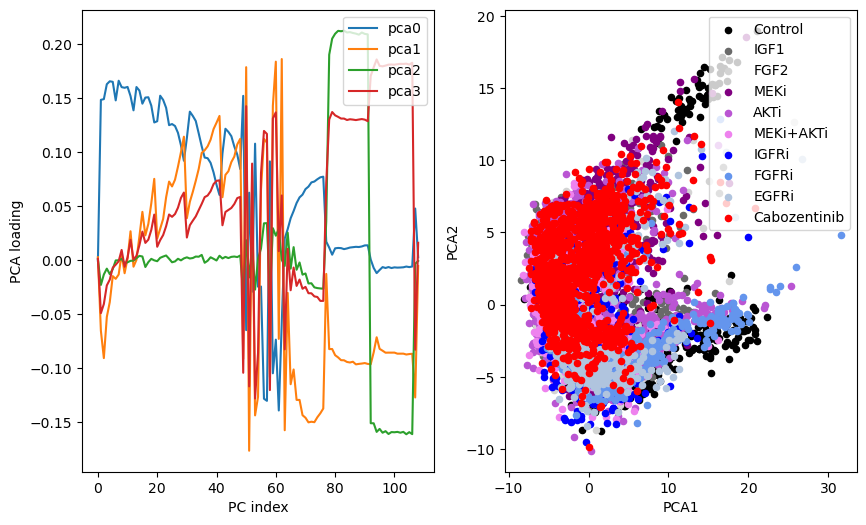

In [23]:
#PCA of image features
#z-norm features
for ifeat in range(Xf.shape[1]): #z-norm all of motility features
    Xf[:,ifeat]=imprep.znorm(Xf[:,ifeat])

Xpca,pca=features.get_pca_fromdata(Xf,var_cutoff=.5); pca.ndim=Xpca.shape[1]

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
for ipca in range(pca.n_components_):
    plt.plot(pca.components_[ipca,:],label=f'pca{ipca}')

plt.ylabel('PCA loading')
plt.xlabel('PC index')
plt.legend(loc='upper right')

plt.subplot(1,2,2)
for i_tm in range(len(tmSet)):
    inds=np.where(indtreatment==i_tm)[0]
    plt.scatter(Xpca[inds,0],Xpca[inds,1],s=20,label=tmSet[i_tm],color=colorSet[i_tm])

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(loc='upper right')
plt.savefig(f'{date}/pca_plot.png')

In [24]:
#motility features
nfeat_com=3
com_feature_list=np.array(['speed','beta','alpha']).astype('S32')
Xf_com=np.zeros((0,nfeat_com))
for i in indgood_models:
    Xf_com=np.append(modelSet[i].m0_comdx_feat,Xf_com,axis=0)

for icom in range(Xf_com.shape[1]): #z-norm all of motility features
    Xf_com[:,icom]=imprep.znorm(Xf_com[:,icom])

In [25]:
sctm=modelSet[82]
print(f'mask channels: {sctm.mask_channels}')
print(f'image channels: {sctm.channels}')

mask channels: [b'cyto' b'nuc' b'foreground']
image channels: [b'CFP' b'DAPI' b'TRITC' b'YFP' b'BF']


In [26]:
sctm.channels

array([b'CFP', b'DAPI', b'TRITC', b'YFP', b'BF'], dtype='|S32')

In [27]:
#signaling features 
corrc_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{nuc_img_channel}img{erk_img_channel}_crosscorr'
    sctm.nuc_channel=nuc_img_channel
    cc=getattr(sctm,attr_str)
    corrc_erk=np.append(corrc_erk,1.-cc)
    print(f'{sctm.h5filename}, added {cc.size} features, total {corrc_erk.size} features')

corrc_erk_std=np.std(corrc_erk);corrc_erk_mean=np.mean(corrc_erk);corrc_erk=imprep.znorm(corrc_erk)

for i in indgood_models:
    sctm=modelSet[i]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{nuc_img_channel}img{erk_img_channel}_crosscorr'
    cc=getattr(sctm,attr_str)
    corrc_z_model=(np.array([1.-cc]).T-corrc_erk_mean)/corrc_erk_std
    modelSet[i].x_signal=corrc_z_model[:,0].copy()

/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5, added 959 features, total 959 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy1_roi0.h5, added 649 features, total 1608 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy2_roi0.h5, added 451 features, total 2059 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy3_roi0.h5, added 1143 features, total 3202 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy4_roi0.h5, added 1143 features, total 4345 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy5_roi0.h5, added 580 features, total 4925 features
/home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy6_roi0.h5, added 354 features, total 5279 features
/home/wsltools/proj

In [28]:
#signaling features
cratio_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'img{erk_img_channel}_m{cyto_msk_channel}m{nuc_msk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)

cratio_erk_std=np.std(cratio_erk);cratio_akt_mean=np.mean(cratio_erk);#cratio_akt=imprep.znorm(cratio_akt)

In [29]:
#signaling features 
corrc_akt=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_akt=np.append(corrc_akt,1.-cc)

corrc_akt_std=np.std(corrc_akt);corrc_akt_mean=np.mean(corrc_akt);corrc_akt=imprep.znorm(corrc_akt)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_z_model=(np.array([1.-cc]).T-corrc_akt_mean)/corrc_akt_std
    modelSet[i].x_signal_akt=corrc_z_model[:,0].copy()

In [30]:
#signaling features
cratio_akt=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'img{akt_img_channel}_m{cyto_msk_channel}m{nuc_msk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_akt=np.append(cratio_akt,cc)

cratio_akt_std=np.std(cratio_akt);cratio_akt_mean=np.mean(cratio_akt);#cratio_akt=imprep.znorm(cratio_akt)

In [31]:
 nuc_img_channel



1

In [142]:
cratio_erk.size

126

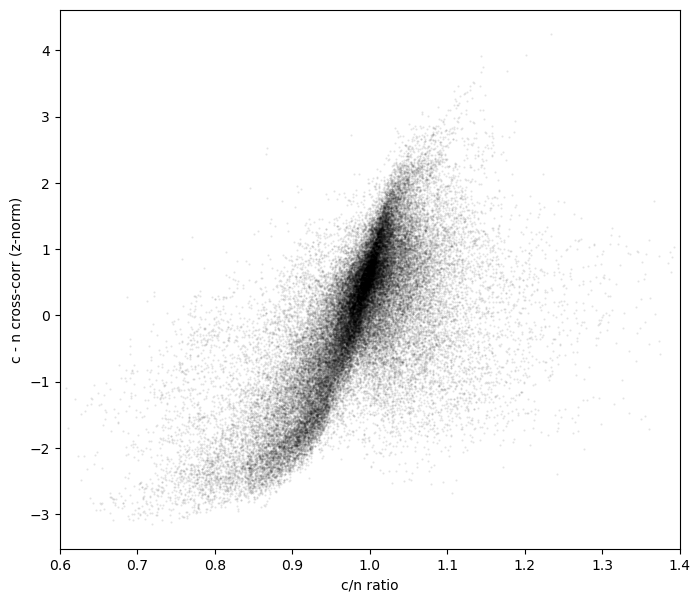

In [32]:
plt.figure(figsize=(8,7))
plt.scatter(cratio_erk,corrc_erk,s=1,c='black',marker='.',alpha=.1)
plt.xlabel('c/n ratio')
plt.ylabel('c - n cross-corr (z-norm)')
plt.xlim(.6,1.4)
plt.savefig(f'{date}/erk_ratio_crosscorr_comp.png')

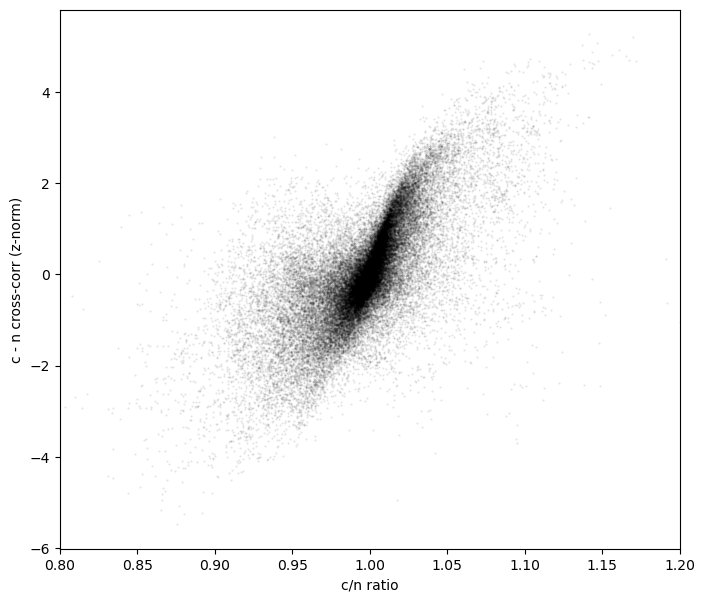

In [33]:
plt.figure(figsize=(8,7))
plt.scatter(cratio_akt,corrc_akt,s=1,c='black',marker='.',alpha=.1)
plt.xlabel('c/n ratio')
plt.ylabel('c - n cross-corr (z-norm)')
plt.xlim(.8,1.2)
plt.savefig(f'{date}/akt_ratio_crosscorr_comp.png')

Control, 23813 measurements
IGF1, 10204 measurements
FGF2, 6985 measurements
MEKi, 5071 measurements
AKTi, 5576 measurements
MEKi+AKTi, 5155 measurements
IGFRi, 7107 measurements
FGFRi, 3688 measurements
EGFRi, 5610 measurements
Cabozentinib, 2782 measurements


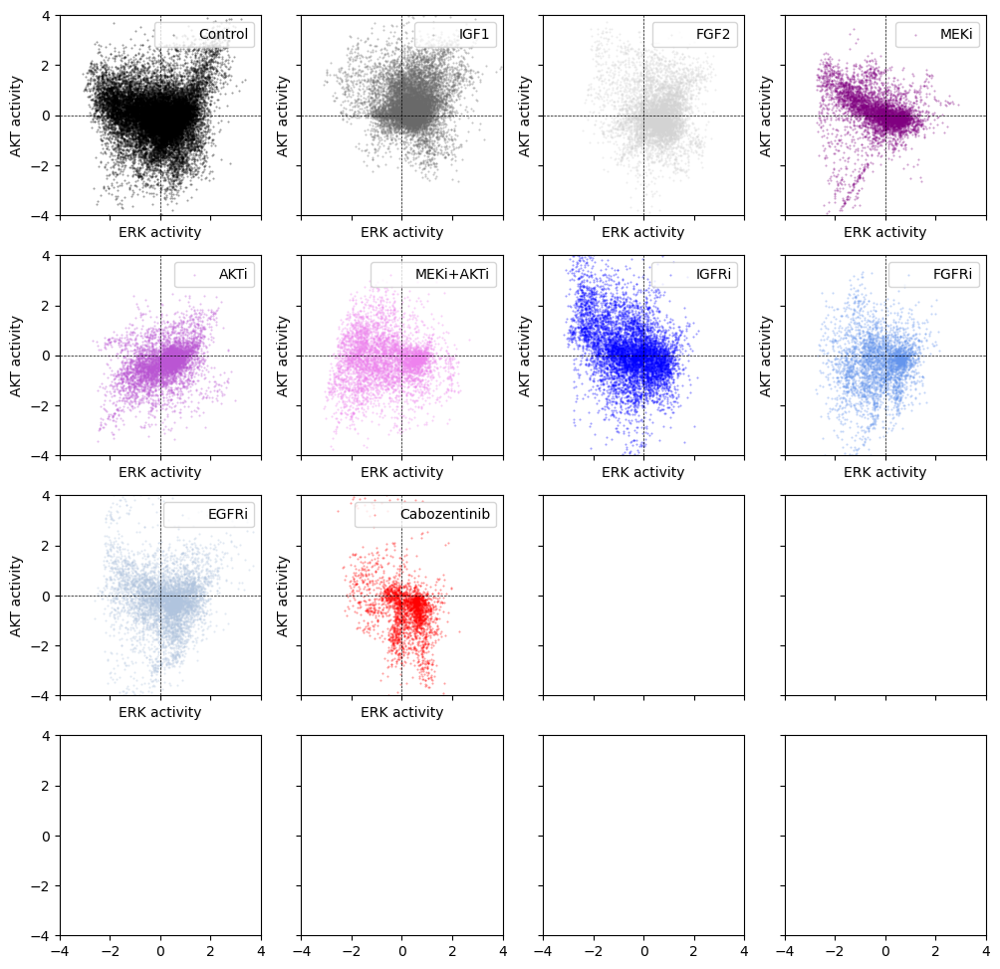

In [199]:
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,sharex=True,sharey=True,figsize=(12,12))
ax=ax.flatten()
xlow=-4;xhigh=4;ylow=-4;yhigh=4
for i_tm in range(len(tmSet)):
    inds=np.where(indtreatment==i_tm)[0]
    print(f'{tmSet[i_tm]}, {inds.size} measurements')
    ax[i_tm].scatter(corrc_erk[inds],corrc_akt[inds],s=1,marker='.',label=tmSet[i_tm],color=colorSet[i_tm],alpha=.4)
    ax[i_tm].plot([xlow,xhigh],[0,0],'k--',linewidth=.5)
    ax[i_tm].plot([0,0],[ylow,yhigh],'k--',linewidth=.5)
    ax[i_tm].set_xlim(xlow,xhigh)
    ax[i_tm].set_ylim(ylow,yhigh)
    ax[i_tm].legend(loc='upper right')
    ax[i_tm].set_xlabel('ERK activity')
    ax[i_tm].set_ylabel('AKT activity')

plt.savefig(f'{date}/signaling_plot2.png')

In [289]:
#put the features for embedding into Xpca feature vector
feature_list=[]
Xpca=np.zeros((Xf.shape[0],0)) #use this if you want to leave out pca morphology features

#for i in range(pca.ndim):
#    feature_list.append(f'pca{i}')
    
#Xpca=np.concatenate((Xpca,Xf_com),axis=1)
#for i in range(len(com_feature_list)):
#    feature_list.append(com_feature_list[i].decode())

Xpca=np.concatenate((Xpca,corrc_erk[:,np.newaxis]),axis=1)
feature_list.append('erk-nuc-corr')

Xpca=np.concatenate((Xpca,corrc_akt[:,np.newaxis]),axis=1)
feature_list.append('akt-nuc-corr')

print(feature_list)

for i in indgood_models:
   indsf=np.where(indcells_models==i)[0]
   modelSet[i].Xpca=Xpca[indsf,:]

['erk-nuc-corr', 'akt-nuc-corr']


#### Trajectory embedding

In [168]:
#Analysis identifiers
data_id=f'OS17PCLS_{date}'

In [267]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracked cell 4, 1 tracks, 0 left
tracked cell 645, 17 tracks, 500 left
tracked cell 601, 17 tracks, 300 left
tracked cell 6, 1 tracks, 0 left
tracked cell 448, 21 tracks, 300 left
tracked cell 9, 2 tracks, 0 left
tracked cell 354, 17 tracks, 100 left
tracked cell 7, 1 tracks, 0 left
tracked cell 427, 17 tracks, 200 left
tracked cell 2, 1 tracks, 0 left
tracked cell 19, 2 tracks, 0 left
tracked cell 172, 19 tracks, 100 left
tracked cell 3, 1 tracks, 0 left
tracked cell 6, 1 tracks, 0 left
tracked cell 9, 2 tracks, 0 left
tracked cell 996, 17 tracks, 600 left
tracked cell 818, 18 tracks, 500 left
tracked cell 383, 17 tracks, 200 left
tracked cell 9, 1 tracks, 0 left
tracked cell 1353, 25 tracks, 800 left
tracked cell 1289, 17 tracks, 700 left
tracked cell 815, 19 tracks, 400 left
tracked cell 228, 15 tracks, 100 left
tracked cell 2, 1 tracks, 0 left
tracked cell 453, 7 tracks, 200 left
tracked cell 9, 1 tracks, 0 left
tracked cell 1425, 1 tracks, 1000 left
tracked cell 902, 1 tracks, 500

In [247]:
##we are going to edit this to save data for analysis elsewhere
for i_tm in range(nf):
    cellindex=np.arange
    df=pandas.DataFrame(data=cellindex)
df['cellid']=cellids
df['frame']=frames
df['field']=fields
df['x']=xset
df['y']=yset
df['fb']=cbset
df.to_csv('CREBi_quantification_JC_31oct22.csv')
    

ValueError: DataFrame constructor not properly called!

In [270]:
indfra1

108

/tmp/ipykernel_620705/3943562196.py:45: RuntimeWarning: Mean of empty slice
  meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
/tmp/ipykernel_620705/3943562196.py:46: RuntimeWarning: Mean of empty slice
  meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)
/tmp/ipykernel_620705/3943562196.py:47: RuntimeWarning: Mean of empty slice
  meanSet_fra1[i_tm]=np.nanmean(trajs_fra1,axis=0)


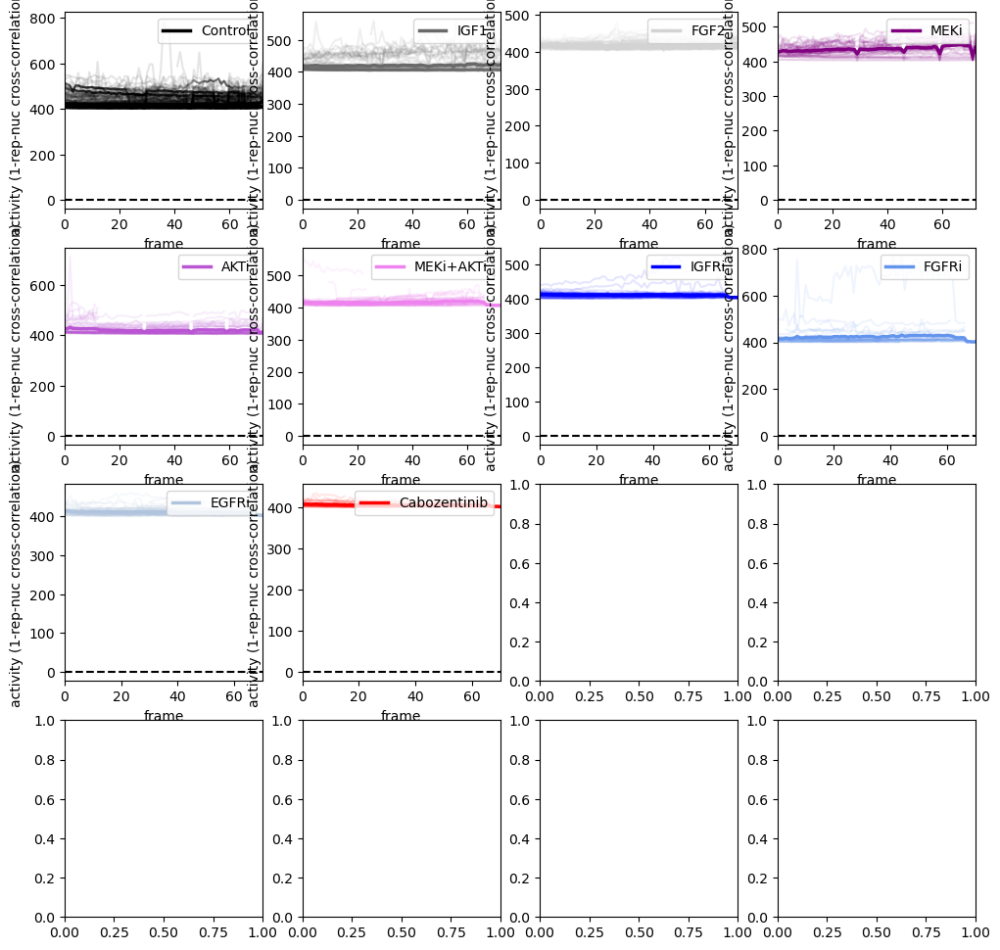

<Figure size 1000x1000 with 0 Axes>

In [290]:
#make a plot of single-cell trajectories, averages, and conditions by frame
indfra1=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'meanIntensity_msk0img1')[0][0]
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,figsize=(12,12))
ax=ax.flatten()
min_traj_len=10
fig=plt.figure(figsize=(10,10))
trajSet_erk=[None]*len(tmSet)
trajSet_akt=[None]*len(tmSet)
trajSet_fra1=[None]*len(tmSet)
meanSet_erk=[None]*len(tmSet)
meanSet_akt=[None]*len(tmSet)
meanSet_fra1=[None]*len(tmSet)
nt=200
for i_tm in range(len(tmSet)):
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    trajs_erk=np.zeros((0,nt))
    trajs_akt=np.zeros((0,nt))
    trajs_fra1=np.zeros((0,nt))
    frames=np.zeros((0,nt))
    for imodel in ind_models:
        for itraj in range(len(modelSet[imodel].trajectories)):
            trajlen=modelSet[imodel].trajectories[itraj].size
            if trajlen>min_traj_len:
                inds=modelSet[imodel].trajectories[itraj]
                frames=modelSet[imodel].cells_frameSet[inds]
                #cr_erk=modelSet[imodel].img3_m0m1_ratio[inds]
                #cr_akt=modelSet[imodel].img2_m0m1_ratio[inds]
                cr_erk=modelSet[imodel].x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                cr_akt=modelSet[imodel].x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                cr_fra1=modelSet[imodel].Xf[inds,indfra1]
                tr_erk=np.ones(nt)*np.nan
                tr_akt=np.ones(nt)*np.nan
                tr_fra1=np.ones(nt)*np.nan
                tr_erk[frames]=cr_erk
                tr_akt[frames]=cr_akt
                tr_fra1[frames]=cr_fra1
                trajs_erk=np.append(trajs_erk,tr_erk[np.newaxis,:],axis=0)
                trajs_akt=np.append(trajs_akt,tr_akt[np.newaxis,:],axis=0)
                trajs_fra1=np.append(trajs_fra1,tr_fra1[np.newaxis,:],axis=0)
                #ax[i_tm].plot(frames,cr_erk,'-',color=colorSet[i_tm],alpha=.3)
                #ax[i_tm].plot(frames,cr_akt,'-',color=colorSet[i_tm],alpha=.1)
                ax[i_tm].plot(frames,cr_fra1,'-',color=colorSet[i_tm],alpha=.1)
    meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
    meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)
    meanSet_fra1[i_tm]=np.nanmean(trajs_fra1,axis=0)
    #ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    #ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot(np.arange(nt),meanSet_fra1[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot([0,nt],[0,0],'k--')
    ax[i_tm].set_xlim(0,np.max(np.where(np.isfinite(meanSet_erk[i_tm]))[0]))
    trajSet_erk[i_tm]=trajs_erk.copy()
    trajSet_akt[i_tm]=trajs_akt.copy()
    trajSet_fra1[i_tm]=trajs_fra1.copy()
    ax[i_tm].set_xlabel('frame')
    ax[i_tm].set_ylabel('activity (1-rep-nuc cross-correlation)')
    ax[i_tm].legend(loc='upper right')

#plt.savefig(f'{date}/mean_erk_signalingvtime_{data_id}.png')
#plt.savefig(f'{date}/mean_akt_signalingvtime_{data_id}.png')
plt.savefig(f'{date}/mean_fra1_signalingvtime_{data_id}.png')
#plt.savefig(f'{date}/mean_akt_signalingvtime.png')        

In [620]:
def show_cellsignal(self,ax,icell,cmap_nuc=plt.cm.Purples,cmap_rep=plt.cm.inferno,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False,show_seg=True):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0,1],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            #img_bf=imprep.znorm(np.max(img_bf,axis=0))
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,90);nuchigh=np.percentile(img_nuc,99)
        img_bf=np.abs(img_bf)
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        ax.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        if show_neighbor_signals:
            ax.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
        else:
            ax.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
        csn=ax.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=cmap_nuc,alpha=0.6,linewidths=1)
        if show_seg:
            csn=ax.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        ax.axis('off')
        return 0
    except Exception as e:
        print(e)
        return 1

In [63]:
tmSet

['Control',
 'IGF1',
 'FGF2',
 'MEKi',
 'AKTi',
 'MEKi+AKTi',
 'IGFRi',
 'FGFRi',
 'EGFRi',
 'Cabozentinib']

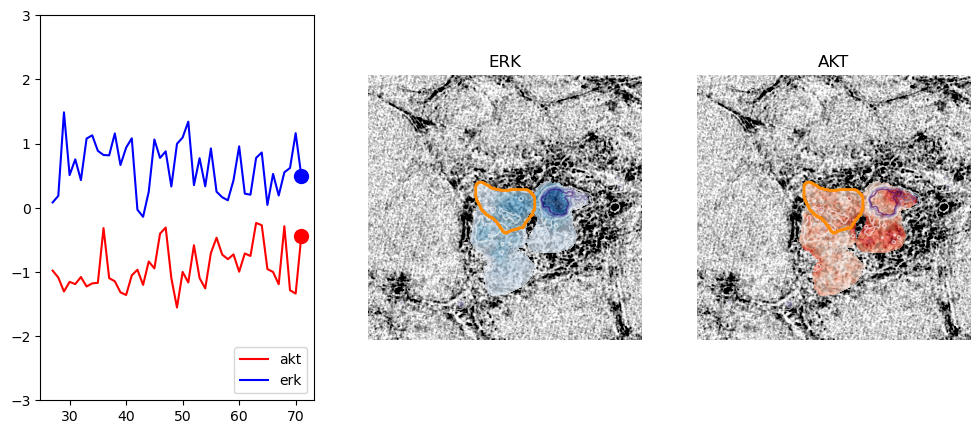

In [629]:
#explore some single-cell signaling trajectories
min_traj_len=40
ntraj_show=1
save_pic=True
pic_directory=f'{date}/signaltraj_{date}'
os.system(f'mkdir -p {pic_directory}')
for i_tm in [2]: #range(len(tmSet)):
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    for imodel in ind_models:
        sctm=modelSet[imodel]
        itraj_show=0
        ntraj=len(modelSet[imodel].trajectories)
        trajlengths=np.zeros(ntraj)
        erk_means=np.zeros(ntraj)
        erk_stds=np.zeros(ntraj)
        for itraj in range(ntraj):
            trajlengths[itraj]=sctm.trajectories[itraj].size
            erk_stds[itraj]=np.std(sctm.x_signal[sctm.trajectories[itraj]])
            erk_means[itraj]=np.max(sctm.x_signal[sctm.trajectories[itraj]])
        indtrajs=np.flip(np.argsort(erk_stds))
        for itr in range(ntraj):
            itraj=indtrajs[itr]
            if trajlengths[itraj]>min_traj_len:
                if itraj_show<ntraj_show:
                    itraj_show=itraj_show+1
                    inds=sctm.trajectories[itraj]
                    frames=sctm.cells_frameSet[inds]
                    #cr_erk=sctm.img3_m0m1_ratio[inds]
                    #cr_akt=sctm.img2_m0m1_ratio[inds]
                    cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                    cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                    for itt in [inds.size-1]: #range(inds.size):
                        ic=inds[itt]
                        fig,ax=plt.subplots(1,3,figsize=(12,5))
                        ax[1].set_title('ERK')
                        show_cellsignal(sctm,ax[1],ic,projection=True,show_seg=True,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[2].set_title('AKT')
                        show_cellsignal(sctm,ax[2],ic,projection=True,show_seg=True,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
                        ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
                        ax[0].set_ylim(-3,3)
                        ax[0].legend(loc='lower right')
                        ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
                        ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
                        if save_pic:
                            plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
                        plt.pause(.01)
                        clear_output(wait=True)
                        

tmSet

In [627]:
modelSet[24]

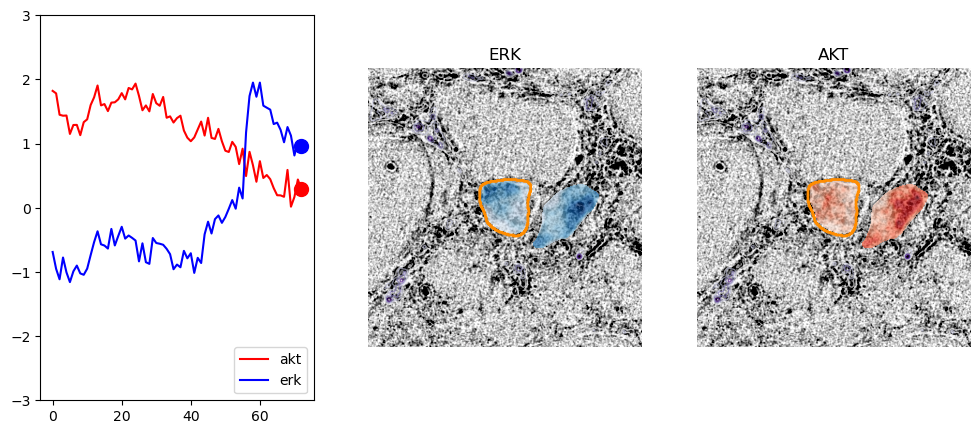

In [625]:
i_tm=3
imodel=24
itraj=1
sctm=modelSet[imodel]
inds=sctm.trajectories[itraj]
frames=sctm.cells_frameSet[inds]
inds=sctm.trajectories[itraj]
frames=sctm.cells_frameSet[inds]
#cr_erk=sctm.img3_m0m1_ratio[inds]
#cr_akt=sctm.img2_m0m1_ratio[inds]
cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
for itt in range(inds.size):
    ic=inds[itt]
    fig,ax=plt.subplots(1,3,figsize=(12,5))
    ax[1].set_title('ERK')
    show_cellsignal(sctm,ax[1],ic,projection=True,show_seg=True,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
    ax[2].set_title('AKT')
    show_cellsignal(sctm,ax[2],ic,projection=True,show_seg=True,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
    ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
    ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
    ax[0].set_ylim(-3,3)
    ax[0].legend(loc='lower right')
    ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
    ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
    if save_pic:
        plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_slice_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
    plt.pause(.01)
    clear_output(wait=True)

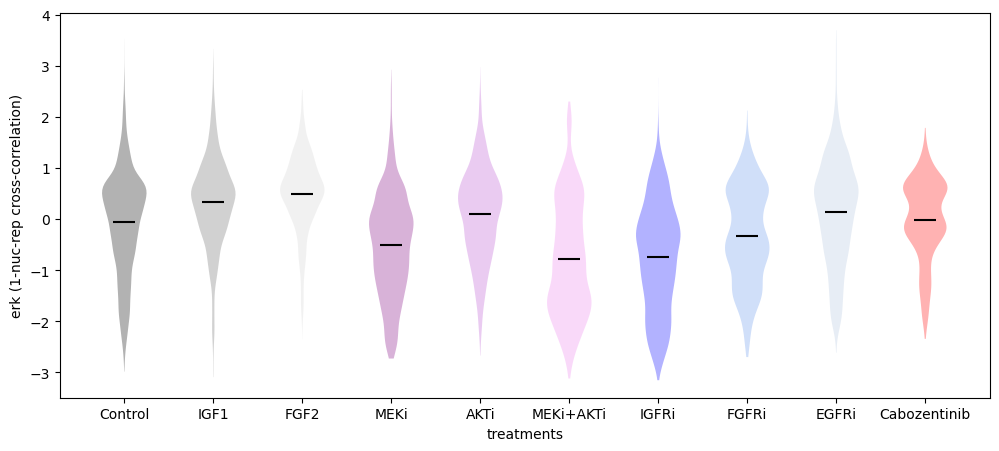

In [175]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_erk[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
#ax.set_ylim(-3,3)
plt.ylabel('erk (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_erk_tearplot_{data_id}.png')

NameError: name 'trajSet_fra1' is not defined

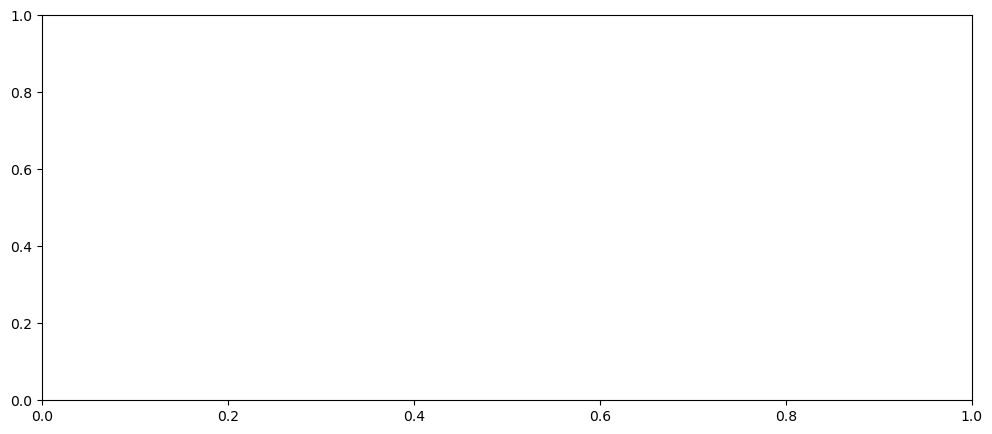

In [185]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_akt[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
ax.set_ylim(-4,3)
plt.ylabel('akt (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_akt_tearplot_{data_id}.png')

In [276]:
setv

array([2028857., 1920398., 1999044., ..., 1629443., 1147882., 1355506.])

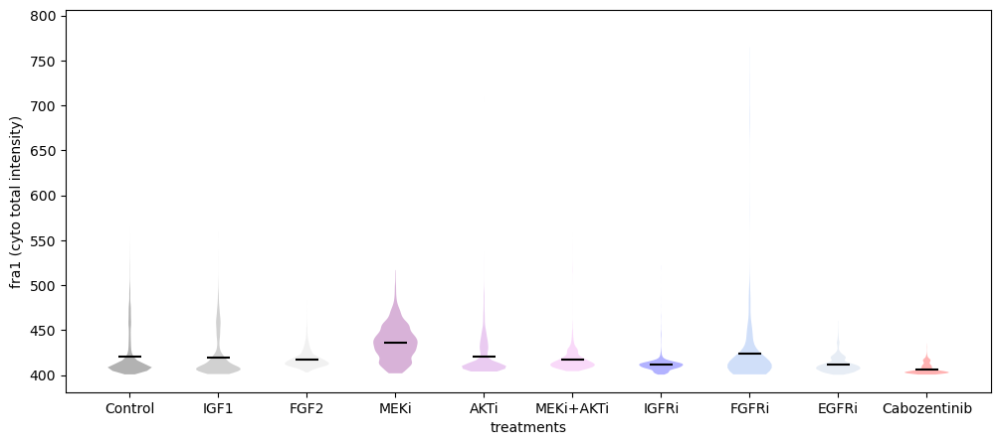

In [279]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_fra1[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
#ax.set_ylim(-4,3)
plt.ylabel('fra1 (cyto total intensity)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_fra1_tearplot_{data_id}.png')

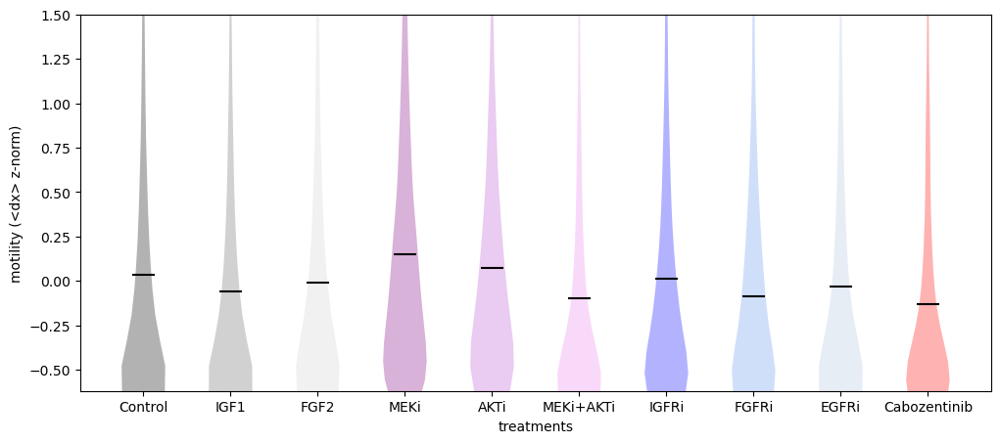

In [177]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
ifeat=0 #np.where(modelSet[0].Xf_feature_list==b'meanIntensity_msk0img1')[0][0]
for i_tm in range(n_tm):
    inds=indtreatment==i_tm
    setv=Xf_com[inds,ifeat]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.ylabel('motility (<dx> z-norm)')
plt.xlabel('treatments')
plt.ylim(-.62,1.5)
plt.savefig(f'{date}/motility_tearplot_{data_id}.png')

Signaling state analysis

In [178]:
#signal environment feature
scut=0.
sigState=np.array([]).astype(int)
for i in indgood_models:
    sigState=np.append(sigState,modelSet[i].x_signal>scut)
    modelSet[i].sigState=modelSet[i].x_signal>scut

In [74]:
sigState

array([1, 1, 1, ..., 1, 1, 1])

In [200]:
ray.shutdown()

In [179]:
import ray; ray.init()

2024-06-17 11:51:15,184	INFO worker.py:1740 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8267 


Python version:,3.9.19
Ray version:,2.21.0
Dashboard:,http://127.0.0.1:8267


In [233]:
@ray.remote
def get_smean_csize_distributed(imodel,db): #for both erk and akt now
    print(f'?, {imodel}')
    sctm=db[imodel]
    print(sctm.h5filename)
    rsmooth=sctm.cellpose_diam/4.
    zcut=2.0
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    Smean_csize_akt=np.array([]).astype(float)
    for iframe in range(sctm.nt):
        print(f'extracting cluster data for model {imodel}, frame {iframe}')
        msk=sctm.get_mask_data(iframe);
        msk_cyto=msk[...,cyto_msk_channel];
        #msk_nuc=msk[...,nuc_msk_channel];
        img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
        img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
        fmsk=imprep.znorm(img_rep_smth)>zcut
        indframe=np.where(sctm.cells_frameSet==iframe)[0]
        sigS=sctm.x_signal[indframe]
        sigS_akt=sctm.x_signal_akt[indframe]
        fmap=imprep.get_feature_map(sigS,msk_cyto)
        msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
        for icluster in np.unique(msk_clusters)[1:]:
            #print(f'{iframe}, {icluster}')
            indc=np.unique(msk_cyto[msk_clusters==icluster])
            indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
            if indc.size>0:
                Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
                Smean_csize_akt=np.append(Smean_csize_akt,np.mean(sigS_akt[indc]))
                csize=np.append(csize,indc.size)
    sctm.Smean_csize=Smean_csize
    sctm.Smean_csize_akt=Smean_csize_akt
    sctm.csize=csize
    sctm.save_to_h5('/cell_data_m0/',['Smean_csize','Smean_csize_akt','csize'],overwrite=True)
    return Smean_csize, Smean_csize_akt, csize

In [201]:
print(tmSet)
inds_tmSet_models

['Control', 'IGF1', 'FGF2', 'MEKi', 'AKTi', 'MEKi+AKTi', 'IGFRi', 'FGFRi', 'EGFRi', 'Cabozentinib']


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 1, 1, 1, 4, 4, 4, 4,
       3, 3, 3, 5, 5, 5, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 8, 8, 8, 8, 8, 0,
       0, 0, 0, 0, 9, 9, 9, 5, 5, 5, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 0, 0, 0, 0, 8, 8,
       8, 9, 9, 9, 9, 9, 6, 6, 6, 7, 7, 7, 7, 7, 7, 5, 5, 5, 5])

In [202]:
#result=get_smean_csize_distributed(indgood_models[0],modelSet)
len(indgood_models)

101

In [203]:
modelSet[indgood_models[0]].load_from_h5('/cell_data_m0/')

loading /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5:/cell_data_m0/


True

In [241]:
plt.scatter(modelSet[indgood_models[2]].csize,modelSet[indgood_models[2]].Smean_csize_akt)

AttributeError: 'Trajectory' object has no attribute 'Smean_csize_akt'

In [234]:
#get cluster size dependence with signaling
#db_object_ref = ray.put(modelSet)
#indmodels_ctrl=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels_ctrl,indgood_models)
results2 = ray.get([get_smean_csize_distributed.remote(imodel, modelSet) for imodel in list(indgood_models)])

(get_smean_csize_distributed pid=647251) ?, 0
(get_smean_csize_distributed pid=647251) /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy0_roi0.h5
(get_smean_csize_distributed pid=647251) extracting cluster data for model 0, frame 0
(get_smean_csize_distributed pid=647262) ?, 22 [repeated 21x across cluster]
(get_smean_csize_distributed pid=647262) /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy23_roi0.h5 [repeated 21x across cluster]
(get_smean_csize_distributed pid=647262) extracting cluster data for model 22, frame 0 [repeated 21x across cluster]
(get_smean_csize_distributed pid=647250) ?, 23 [repeated 2x across cluster]
(get_smean_csize_distributed pid=647250) /home/wsltools/projects/Rawan/20240324_PCLS_OS17_Controls_R2M1_N2/20240506_OS17lung_RM_xy24_roi0.h5 [repeated 2x across cluster]
(get_smean_csize_distributed pid=647250) extracting cluster data for model 23, frame 1 [repeated 3x across cluster]


(raylet) Spilled 9399 MiB, 111 objects, write throughput 650 MiB/s.


(get_smean_csize_distributed pid=647246) extracting cluster data for model 21, frame 1 [repeated 3x across cluster]
(get_smean_csize_distributed pid=647254) extracting cluster data for model 6, frame 2 [repeated 5x across cluster]
(get_smean_csize_distributed pid=647250) extracting cluster data for model 23, frame 5 [repeated 4x across cluster]
(get_smean_csize_distributed pid=647254) extracting cluster data for model 6, frame 3 [repeated 10x across cluster]
(get_smean_csize_distributed pid=647265) extracting cluster data for model 18, frame 1 [repeated 11x across cluster]
(get_smean_csize_distributed pid=647254) extracting cluster data for model 6, frame 4 [repeated 6x across cluster]
(get_smean_csize_distributed pid=647245) extracting cluster data for model 1, frame 2 [repeated 7x across cluster]
(get_smean_csize_distributed pid=647263) extracting cluster data for model 20, frame 2 [repeated 12x across cluster]
(get_smean_csize_distributed pid=647254) extracting cluster data for mode

In [239]:
Smean_csize,Smean_csize,csize = get_smean_csize_distributed(indgood_models[0], modelSet)

TypeError: Remote functions cannot be called directly. Instead of running '__main__.get_smean_csize_distributed()', try '__main__.get_smean_csize_distributed.remote()'.

ValueError: x and y must be the same size

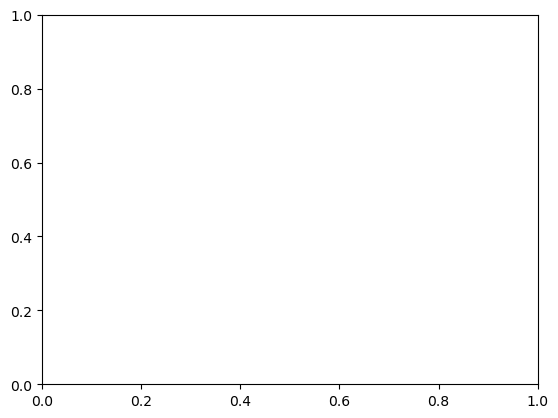

In [240]:
plt.scatter(csize,Smean_csize_akt)

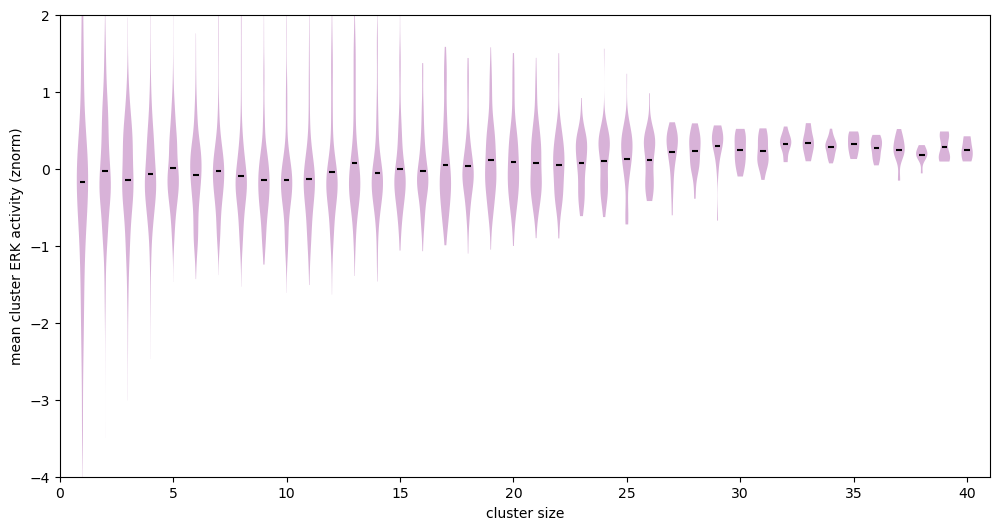

In [246]:
csize=np.array([]).astype(int)
Smean_csize=np.array([]).astype(float)
inds_csize_models=np.array([]).astype(int)
#indmodels=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels,indgood_models)
for imodel in indgood_models: #indmodels:
    iresult=np.where(indgood_models==imodel)[0][0]
    csize=np.append(csize,results2[iresult][2])
    Smean_csize=np.append(Smean_csize,results2[iresult][1])
    inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)

plt.figure(figsize=(12,6))
ax=plt.gca()
for i_size in range(np.max(csize)):
    inds=csize==i_size
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')    
plt.ylabel('mean cluster ERK activity (znorm)')
plt.xlabel('cluster size')
plt.ylim(-4,2)
plt.xlim(0,41)
plt.savefig(f'{date}/smeans_csize_{data_id}.png')
plt.pause(.1)

In [251]:
Smean_csize_set=[None]*nf
csize_set=[None]*nf
for i_tm in range(nf):
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        iresult=np.where(indgood_models==imodel)[0][0]
        csize=np.append(csize,results2[iresult][2])
        Smean_csize=np.append(Smean_csize,results2[iresult][1])
        inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)
    Smean_csize_set[i_tm]=Smean_csize.copy()
    csize_set[i_tm]=csize.copy()


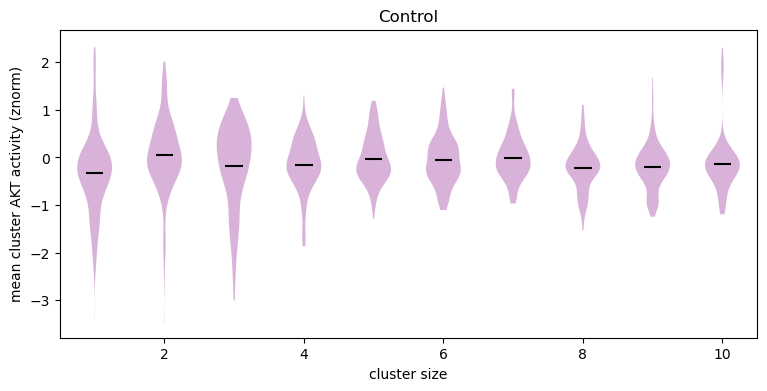

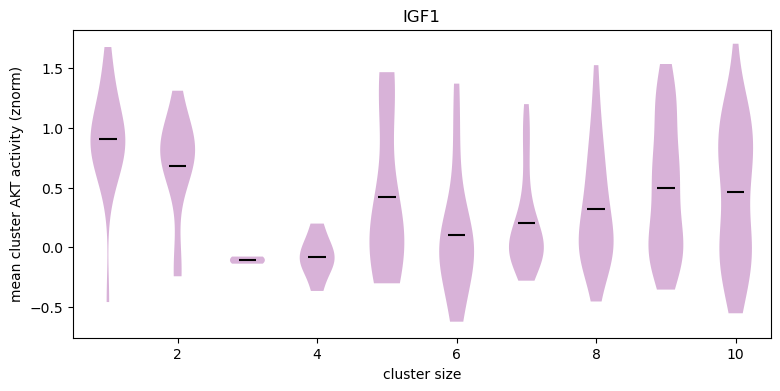

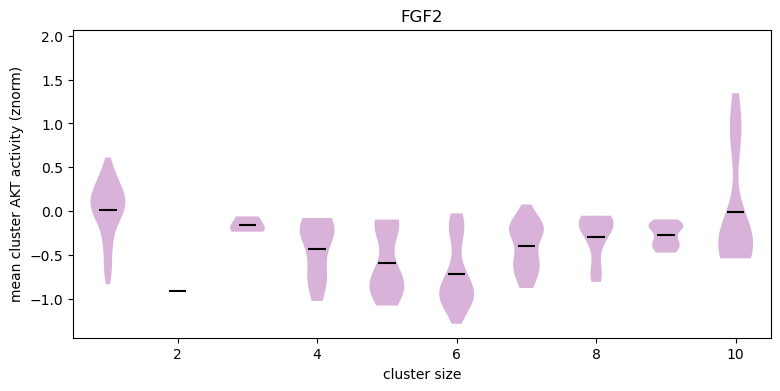

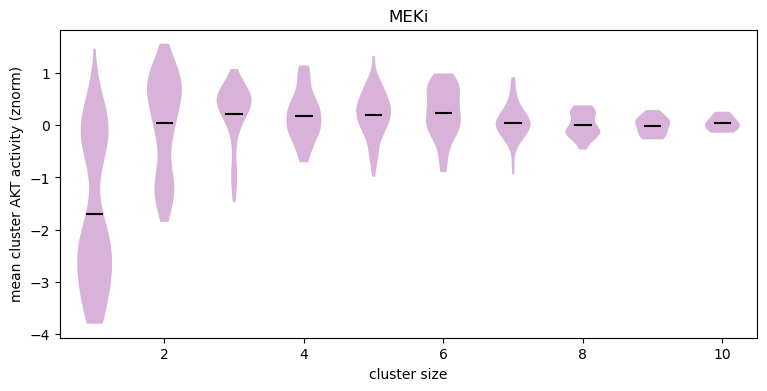

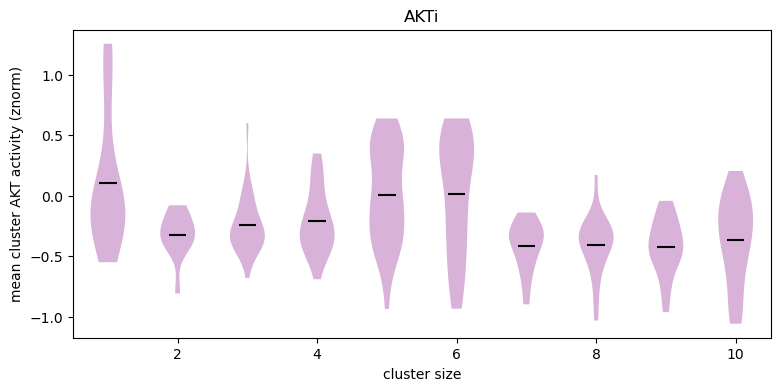

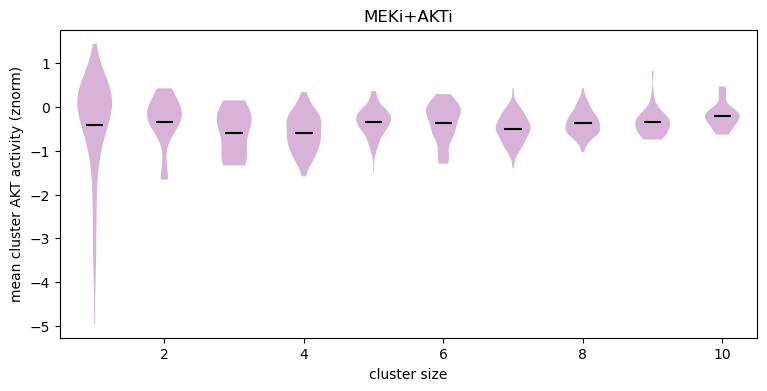

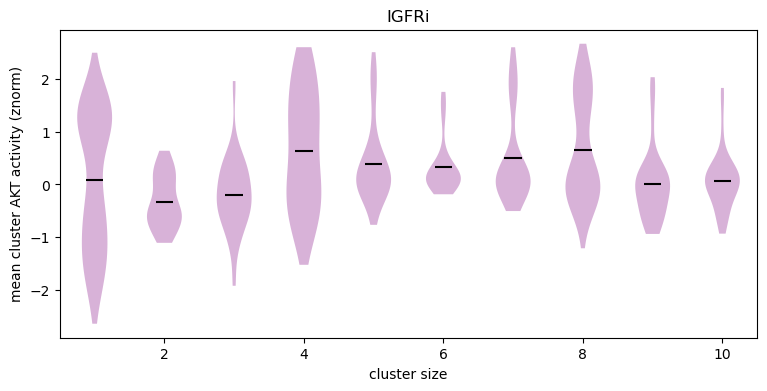

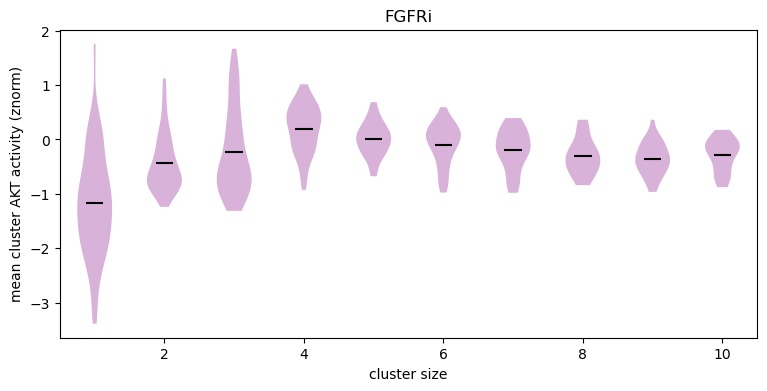

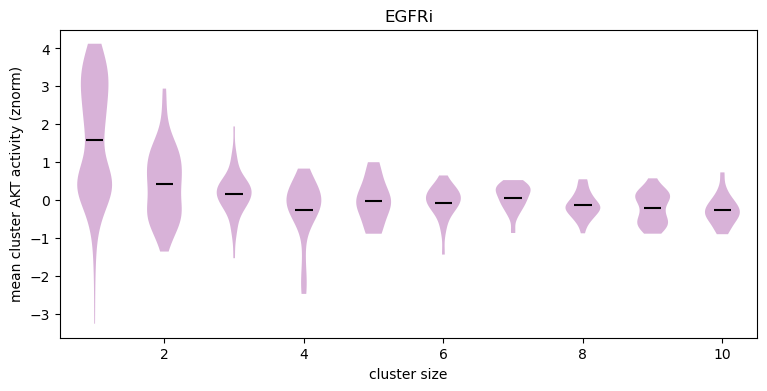

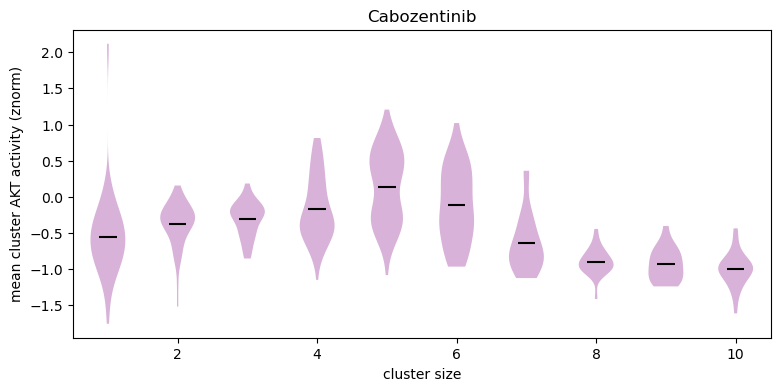

In [254]:
for i_tm in range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]
    nsamples=int(csize.size/2)
    plt.figure(figsize=(9,4))
    ax=plt.gca()
    for i_size in range(np.max(csize)):
        inds=csize==i_size
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('purple')    
    #plt.ylabel('mean cluster ERK activity (znorm)')
    plt.ylabel('mean cluster AKT activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    #plt.ylim(-2,2)
    plt.xlim(0.5,10.5)
    #plt.savefig(f'{date}/smeans_csize10_{data_id}_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/smeans_csize_akt10_{data_id}_{tmSet[i_tm]}.png')
    plt.pause(.1)

In [ ]:
for i_tm in range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]
    nsamples=int(csize.size/2)
    plt.figure(figsize=(9,4))
    ax=plt.gca()
    for i_size in range(np.max(csize)):
        inds=csize==i_size
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('purple')    
    plt.ylabel('mean cluster ERK activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    plt.ylim(-2,2)
    plt.xlim(0.5,10.5)
    plt.savefig(f'{date}/smeans_csize10_{data_id}_{tmSet[i_tm]}.png')
    plt.pause(.1)

In [116]:
hist

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

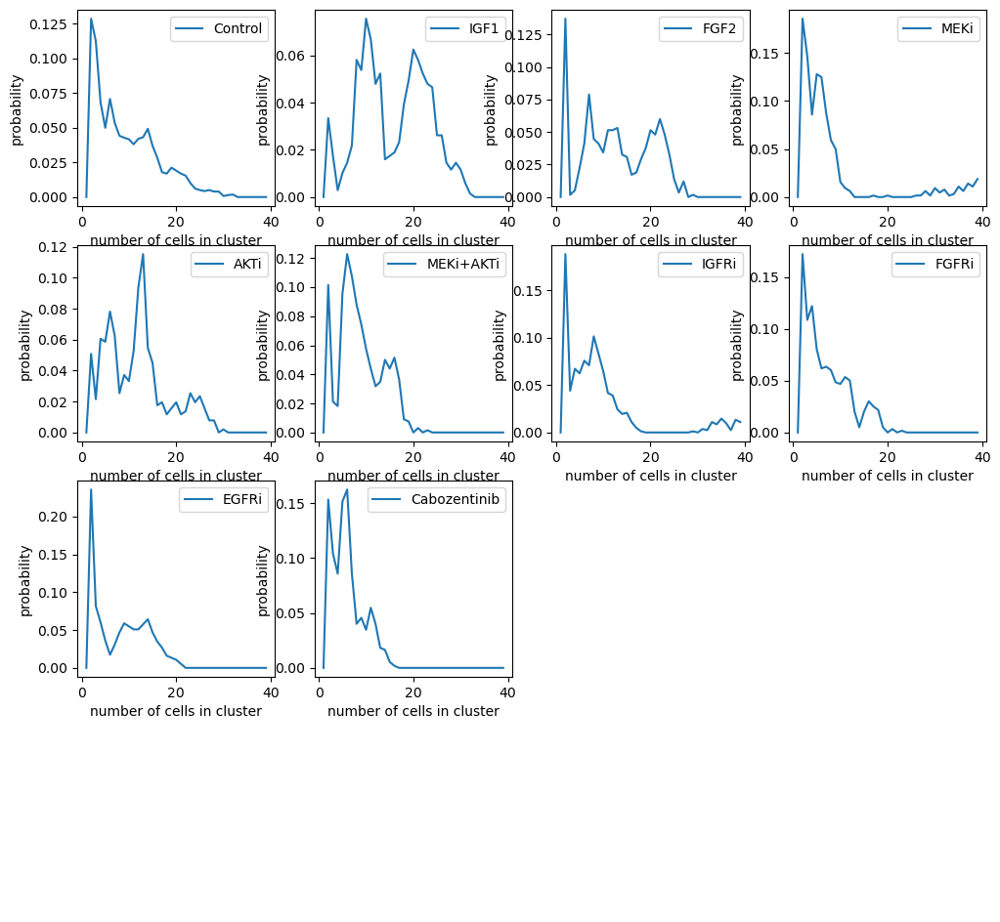

In [257]:
nplots=int(np.ceil(np.sqrt(nf)))
cbins=np.arange(40)
fig,ax=plt.subplots(nplots,nplots,figsize=(12,12))
ax=ax.flatten()
for i_tm in range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]
    hist,bin_edges=np.histogram(csize,bins=cbins)
    prob=hist/np.sum(hist)
    ax[i_tm].plot(bin_edges[1:],prob,label=tmSet[i_tm])
    ax[i_tm].legend(loc='upper right')
    ax[i_tm].set_xlabel('number of cells in cluster')
    ax[i_tm].set_ylabel('probability')

for i_tm in range(nf,nplots*nplots):
    ax[i_tm].axis('off')

plt.savefig(f'{date}/SIZE PROBABILITY_{data_id}.png')
    

Text(0, 0.5, 'mean ERK signal (z-norm)')

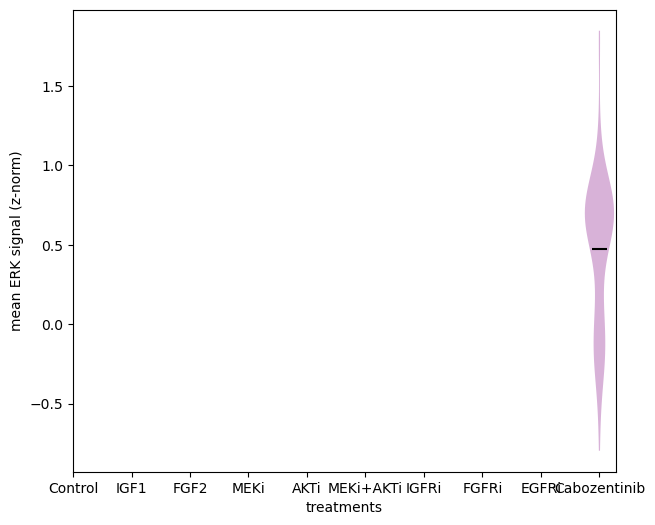

In [225]:
plt.figure(figsize=(7,6))
ax=plt.gca()
for i_tm in range(len(tmSet)):
    indm=np.where(inds_tmSet_models==i_tm)[0]
    inds_csize=np.where(csize==1)[0]
    inds_tm=np.where(np.isin(inds_csize_models,indm))[0]
    inds=np.intersect1d(inds_tm,inds_csize)
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.xlabel('treatments')
plt.ylabel('mean ERK signal (z-norm)')
#plt.ylim(0,1.1)
#plt.savefig(f'{date}/smeans_csize_{data_id}.png')

In [ ]:
inds_csize

In [258]:
iframe=0
print(f'extracting cluster data for model {i}, frame {iframe}')
msk=sctm.get_mask_data(iframe);
msk_cyto=msk[...,cyto_msk_channel];
msk_nuc=msk[...,nuc_msk_channel];
img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
fmsk=imprep.znorm(img_rep_smth)>zcut
indframe=np.where(sctm.cells_frameSet==iframe)[0]
sigS=sctm.sigState[indframe]
fmap=imprep.get_feature_map(sigS,msk_cyto)
msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
for icluster in np.unique(msk_clusters)[1:]:
    indc=np.unique(msk_cyto[msk_clusters==icluster])
    indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
    if indc.size>0:
        Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
        csize=np.append(csize,indc.size)
        if visual_csize and indc.size>0:
            plt.clf()
            print(np.unique(msk_clusters))         
            plt.contour(np.max(fmap,axis=0),levels=[0,1],colors='red')
            img_test=np.zeros_like(img_rep);img_test[msk_clusters==icluster]=np.mean(sigS[indc])
            plt.imshow(np.max(img_test,axis=0),clim=(0,1),cmap=plt.cm.Reds)
            plt.contour(np.max(msk_clusters,axis=0),levels=np.unique(msk_clusters),cmap=plt.cm.Greens)
            plt.pause(.1)

extracting cluster data for model 100, frame 0


NameError: name 'rsmooth' is not defined

In [259]:
def get_tcf(self, trajectories=None, x=None, minlength=2):
    if x is None:
        x=self.Xpca
    if trajectories is None:
        trajectories = self.trajectories
    ntraj = len(trajectories)
    traj_lengths = np.zeros(ntraj)
    for itraj in range(ntraj):
        traj_lengths[itraj] = trajectories[itraj].size
    nframes = np.max(traj_lengths)
    nt = np.floor(nframes / 2).astype(int)
    dxcorr = np.zeros(nt)
    tnorm = np.zeros(nt)
    for itraj in range(ntraj):
        cell_traj = trajectories[itraj]
        traj_len = cell_traj.size
        nmax = np.floor(traj_len / 2).astype(int)
        if traj_len > minlength:
            xtraj = x[cell_traj,:]
            for it1 in range(nmax):
                for it2 in range(it1, it1 + nmax):
                    it = it2 - it1
                    #dxcorr[it] = dxcorr[it] + np.sum(np.power(xtraj[it1, :]-xtraj[it2, :],2))
                    corr=np.dot(xtraj[it1,:],xtraj[it2,:])
                    if np.isfinite(corr):
                        dxcorr[it]=dxcorr[it]+corr
                        tnorm[it] = tnorm[it] + 1
    for it in range(nt):
        dxcorr[it] = dxcorr[it] / tnorm[it]
    return dxcorr

IndexError: index 16 is out of bounds for axis 0 with size 0

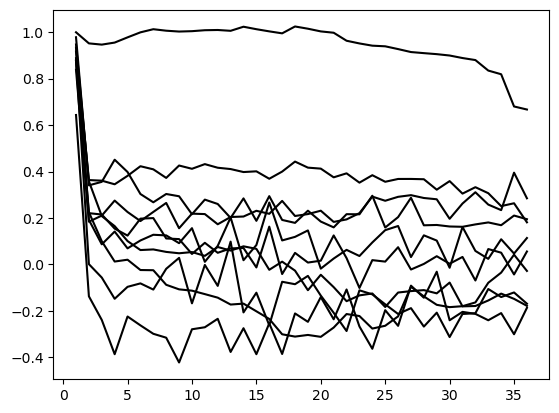

In [260]:
tcfSet=[None]*nmodels
for imodel in indgood_models:
    sctm=modelSet[imodel]
    tcf=get_tcf(sctm,x=sctm.Xpca,minlength=1)
    if tcf.size>0:
        av_sq=np.sum(np.power(np.nanmean(sctm.Xpca,axis=0),2))
        avsq=np.nanmean(np.power(np.linalg.norm(sctm.Xpca,axis=1),2))
        tcf=(tcf-av_sq)/tcf[0] #auto-correlation
        tcfSet[imodel]=tcf
        plt.plot(np.arange(1,tcf.size+1),tcf,color=colorSet[inds_tmSet_models[imodel]],label=tmSet[inds_tmSet_models[imodel]])


'NoneType' object has no attribute 'size'


/tmp/ipykernel_374996/2849959601.py:11: RuntimeWarning: Mean of empty slice
  tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)


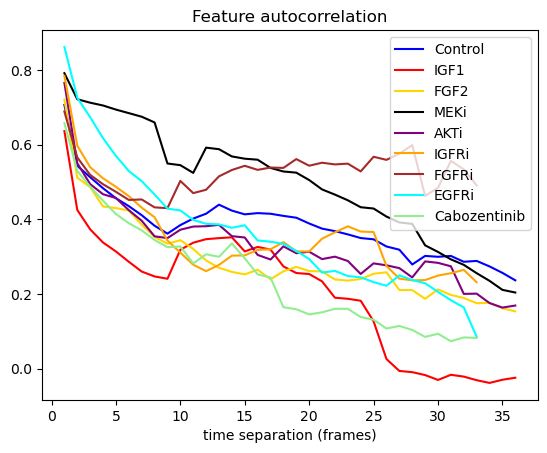

In [261]:
tcf_tm=[None]*nf
tmax=80
for i_tm in range(nf):
    try:
        ind_models=indgood_models[inds_tmSet_models[indgood_models]==i_tm]
        tcfs=np.ones((tmax,ind_models.size))*np.nan
        for ii in range(ind_models.size):
            tmax_model=tcfSet[ind_models[ii]].size
            tmax_model=np.min(np.array([tmax,tmax_model]))
            tcfs[0:tmax_model,ii]=tcfSet[ind_models[ii]][0:tmax_model]
        tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)
        plt.plot(np.arange(1,tmax+1),tcf_tm[i_tm],color=colorSet[i_tm],label=tmSet[i_tm])
    except Exception as e:
        print(e)

#plt.ylim(-.1,.3)
plt.title('Feature autocorrelation');plt.xlabel('time separation (frames)');plt.legend(loc='upper right')

In [261]:
sctm.Xf_feature_list

array([b'featZernike-0_msk0img4', b'featZernike-1_msk0img4',
       b'featZernike-2_msk0img4', b'featZernike-3_msk0img4',
       b'featZernike-4_msk0img4', b'featZernike-5_msk0img4',
       b'featZernike-6_msk0img4', b'featZernike-7_msk0img4',
       b'featZernike-8_msk0img4', b'featZernike-9_msk0img4',
       b'featZernike-10_msk0img4', b'featZernike-11_msk0img4',
       b'featZernike-12_msk0img4', b'featZernike-13_msk0img4',
       b'featZernike-14_msk0img4', b'featZernike-15_msk0img4',
       b'featZernike-16_msk0img4', b'featZernike-17_msk0img4',
       b'featZernike-18_msk0img4', b'featZernike-19_msk0img4',
       b'featZernike-20_msk0img4', b'featZernike-21_msk0img4',
       b'featZernike-22_msk0img4', b'featZernike-23_msk0img4',
       b'featZernike-24_msk0img4', b'featZernike-25_msk0img4',
       b'featZernike-26_msk0img4', b'featZernike-27_msk0img4',
       b'featZernike-28_msk0img4', b'featZernike-29_msk0img4',
       b'featZernike-30_msk0img4', b'featZernike-31_msk0img4',
  

In [263]:
sctm.Xf_feature_list

array([b'featZernike-0_msk0img4', b'featZernike-1_msk0img4',
       b'featZernike-2_msk0img4', b'featZernike-3_msk0img4',
       b'featZernike-4_msk0img4', b'featZernike-5_msk0img4',
       b'featZernike-6_msk0img4', b'featZernike-7_msk0img4',
       b'featZernike-8_msk0img4', b'featZernike-9_msk0img4',
       b'featZernike-10_msk0img4', b'featZernike-11_msk0img4',
       b'featZernike-12_msk0img4', b'featZernike-13_msk0img4',
       b'featZernike-14_msk0img4', b'featZernike-15_msk0img4',
       b'featZernike-16_msk0img4', b'featZernike-17_msk0img4',
       b'featZernike-18_msk0img4', b'featZernike-19_msk0img4',
       b'featZernike-20_msk0img4', b'featZernike-21_msk0img4',
       b'featZernike-22_msk0img4', b'featZernike-23_msk0img4',
       b'featZernike-24_msk0img4', b'featZernike-25_msk0img4',
       b'featZernike-26_msk0img4', b'featZernike-27_msk0img4',
       b'featZernike-28_msk0img4', b'featZernike-29_msk0img4',
       b'featZernike-30_msk0img4', b'featZernike-31_msk0img4',
  

In [287]:
modelSet[10].x_signal

array([-1.50915941,  0.99808271, -0.45958143, ...,  0.51424119,
        0.78065841,  0.07262126])

In [528]:
#trajectory embedding
trajl=17
ind_cb=np.where(sctm.Xf_feature_list==b'featBoundaryCB-0_msk0img0_fmsk')[0][0]
ind_cbc=np.where(sctm.Xf_feature_list==b'featBoundaryCB-0_msk0cmsk0')[0][0]
pca.ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,pca.ndim*trajl))
indtreatment_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
cbc_ratio_traj=np.array([])
cb_ratio_traj=np.array([])
corrc_erk_traj=np.array([]).astype(float)
z_traj=np.array([]).astype(float)
corrc_erk_full_traj=np.zeros((0,trajl))
corrc_akt_traj=np.array([]).astype(float)
corrc_akt_full_traj=np.zeros((0,trajl))
cbc_ratio_full_traj=np.zeros((0,trajl))
cb_ratio_full_traj=np.zeros((0,trajl))
dx_full_traj=np.zeros((0,trajl))
dx_traj=np.array([])
beta_full_traj=np.zeros((0,trajl))
beta_traj=np.array([])
alpha_full_traj=np.zeros((0,trajl))
alpha_traj=np.array([])
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    #datacom=modelSet[i].Xf_com[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    #datacom=datacom.reshape(modelSet[i].traj.shape[0],modelSet[i].Xf_com.shape[1]*trajl)
    #data=np.append(data,datacom,axis=1)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indtreatment_traj=np.append(indtreatment_traj,i*np.ones(data.shape[0]).astype(int))
    indstacks=modelSet[i].cells_imgfileSet[modelSet[i].traj[:,0]]
    indstack_traj=np.append(indstack_traj,indstacks)
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,0]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    #cc_ratio=modelSet[i].cc_ratio[cellinds1]
    #cc_ratio_traj=np.append(cc_ratio_traj,cc_ratio)
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)
    corrc_erk_traj=np.append(corrc_erk_traj,modelSet[i].x_signal[cellinds1])
    corrc_erk_full_traj=np.append(corrc_erk_full_traj,modelSet[i].x_signal[modelSet[i].traj],axis=0)
    corrc_akt_traj=np.append(corrc_akt_traj,modelSet[i].x_signal_akt[cellinds1])
    corrc_akt_full_traj=np.append(corrc_akt_full_traj,modelSet[i].x_signal_akt[modelSet[i].traj],axis=0)
    cb_ratio_traj=np.append(cb_ratio_traj,modelSet[i].Xf[cellinds1,ind_cb])
    cb_ratio_full_traj=np.append(cb_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cb],axis=0)
    cbc_ratio_traj=np.append(cbc_ratio_traj,modelSet[i].Xf[cellinds1,ind_cbc])
    cbc_ratio_full_traj=np.append(cbc_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cbc],axis=0)
    z_traj=np.append(z_traj,np.mean(modelSet[i].cellblocks[:,0],axis=1)[cellinds1])
    dx_traj=np.append(dx_traj,modelSet[i].m0_comdx_feat[cellinds1,0])
    dx_full_traj=np.append(dx_full_traj,modelSet[i].m0_comdx_feat[modelSet[i].traj,0],axis=0)
    beta_traj=np.append(beta_traj,modelSet[i].m0_comdx_feat[cellinds1,1])
    beta_full_traj=np.append(beta_full_traj,modelSet[i].m0_comdx_feat[modelSet[i].traj,1],axis=0)
    alpha_traj=np.append(alpha_traj,modelSet[i].m0_comdx_feat[cellinds1,2])
    alpha_full_traj=np.append(alpha_full_traj,modelSet[i].m0_comdx_feat[modelSet[i].traj,2],axis=0)
    

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indtreatment_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

building trajectory data for model 0...
building trajectory data for model 1...
building trajectory data for model 2...
building trajectory data for model 3...
building trajectory data for model 4...
building trajectory data for model 5...
building trajectory data for model 6...
building trajectory data for model 7...
building trajectory data for model 8...
building trajectory data for model 9...
building trajectory data for model 10...
building trajectory data for model 11...
building trajectory data for model 12...
building trajectory data for model 13...
building trajectory data for model 14...
building trajectory data for model 15...
building trajectory data for model 16...
building trajectory data for model 17...
building trajectory data for model 18...
building trajectory data for model 19...
building trajectory data for model 20...
building trajectory data for model 21...
building trajectory data for model 22...
building trajectory data for model 23...
building trajectory data f

#### Data-driven modeling

In [529]:
#Analysis identifiers
date='21june24'
figid=f'OS17_tl{trajl}_{date}'
os.system(f'mkdir -p {date}')

0

In [357]:
x.shape

(20609, 50)

In [531]:
#get microstate clusters
get_clusters=True
n_clusters=150
knn=10
if get_clusters:
    clusters=coor.cluster_kmeans([x],k=n_clusters,metric='euclidean',fixed_seed=2,max_iter=1000)
    np.save(f'{date}/clusters_nc{n_clusters}_{figid}.npy',clusters)
else:
    clusters=np.load(f'{date}/clusters_nc{n_clusters}_{figid}.npy',allow_pickle=True)
    clusters=clusters.item()

/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/decorator.py:232: PyEMMA_DeprecationWarning: Call to deprecated function "cluster_kmeans". Called from /home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/decorator.py line 232. Use deeptime.clustering.KMeans instead.
  return caller(func, *(extras + args), **kw)


initialize kmeans++ centers:   0%|                                                              | 0/150 [00:00…

kmeans iterations:   0%|                                                                       | 0/1000 [00:00…

In [417]:
#check out a umap of the embedding space
import sklearn
#reducer=umap.UMAP(n_components=2) #, metric='euclidean')
reducer=sklearn.manifold.TSNE(n_components=2)
trans = reducer.fit(x.astype(np.float32))
x_umap=trans.embedding_

ValueError: 'c' argument has 29558 elements, which is inconsistent with 'x' and 'y' with size 20609.

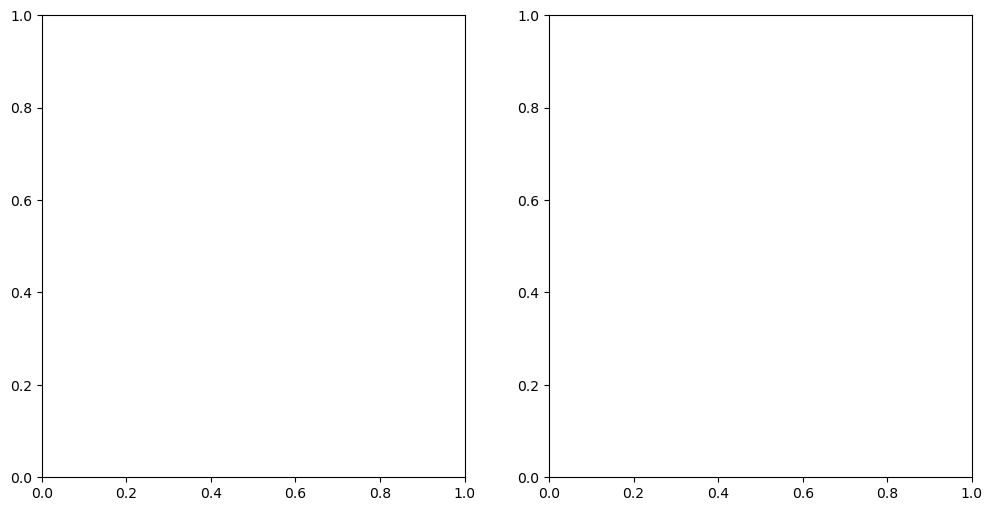

In [630]:
#plot umap of the embedding space
fig,ax=plt.subplots(1,2,figsize=(12,6))

ax[0].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_erk_traj,cmap=plt.cm.seismic)
ax[0].set_title('ERK')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    #ax[0].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[0].axis('off')

ax[1].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_akt_traj,cmap=plt.cm.seismic)
ax[1].set_title('AKT')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    #ax[1].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[1].axis('off')

plt.savefig(f'{date}/dMAP_{figid}.png')

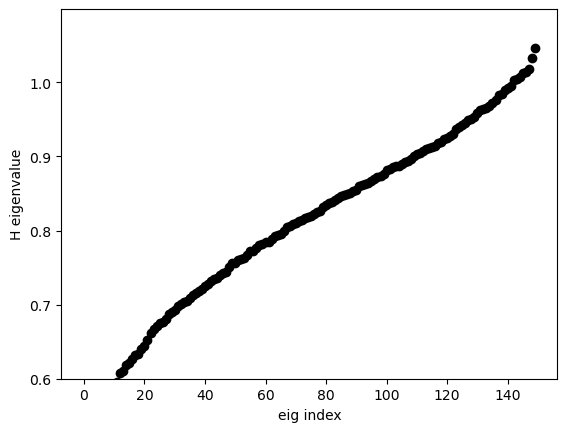

In [532]:
#Markov state model
centers_minima=clusters.clustercenters.copy()
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
graph = csr_matrix(P>0.)
n_components, labels = connected_components(csgraph=graph, directed=False, return_labels=True)
unique, counts = np.unique(labels, return_counts=True)
icc=unique[np.argmax(counts)]
indcc=np.where(labels==icc)[0]
centers_minima=centers_minima[indcc,:];stateCenters=centers_minima
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
n_clusters=indcc.size

H=.5*(P+np.transpose(P))+.5j*(P-np.transpose(P))
w,v=np.linalg.eig(H)
w=np.real(w)
indsort=np.argsort(w)
w=w[indsort]
v=v[:,indsort]

plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
plt.ylim(.6,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.pause(.1)

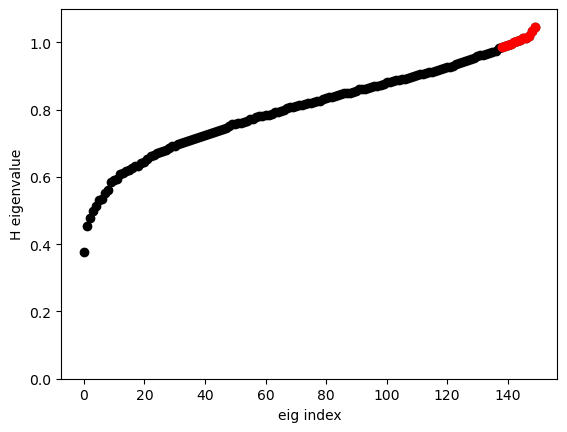

In [558]:
ncomp=12 #number of eigencomponents to keep edit (dynamical motifs) red vs black
vr=np.multiply(w[-ncomp:],np.real(v[:,-ncomp:]))
vi=np.multiply(w[-ncomp:],np.imag(v[:,-ncomp:]))
vkin=np.append(vr,vi,axis=1)
va=np.abs(v[:,-ncomp:])
vkin=np.append(vr,vi,axis=1)
vth=np.arctan2(vr,vi)
plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
#plt.plot(dense_range,wdense,'k-',label='spline')
plt.plot(np.arange(n_clusters)[-ncomp:],w[-ncomp:],'ro')
plt.ylim(0,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.savefig(f'{date}/eigenvalues_{figid}.png')
plt.pause(.1)

In [559]:
get_cluster_embedding=True
if get_cluster_embedding:
    reducer=umap.UMAP(n_neighbors=int(n_clusters),min_dist=0.1, n_components=2, metric='euclidean')
    #reducer=sklearn.manifold.TSNE(n_components=2)
    trans = reducer.fit(vkin)
    x_clusters=trans.embedding_
    np.save(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy',x_clusters)
else:
    x_clusters=np.load(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy')

ind_clusters=clusters_minima.assign(x)
x_clusters_all=x_clusters[ind_clusters,:]

/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/umap/umap_.py:2433: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


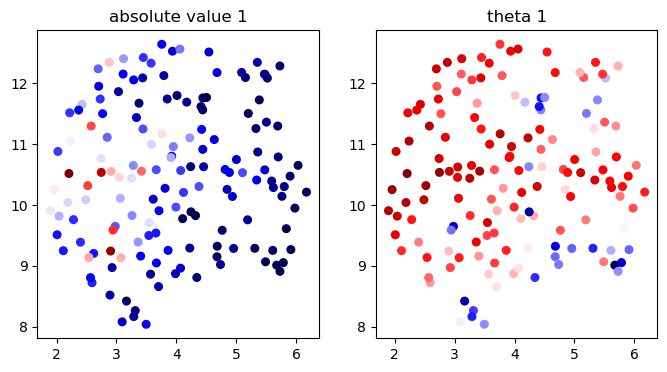

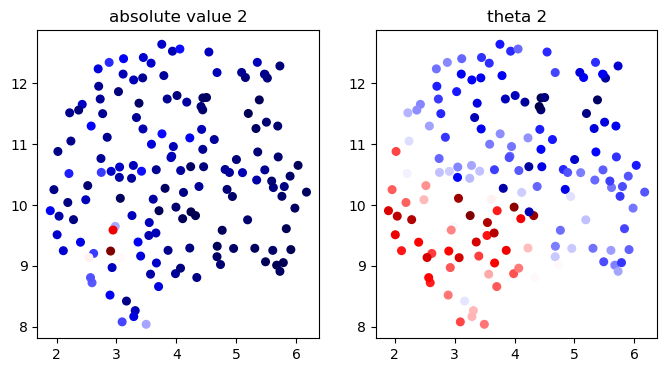

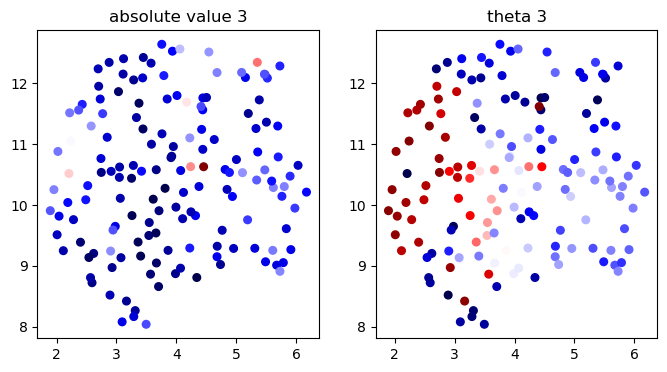

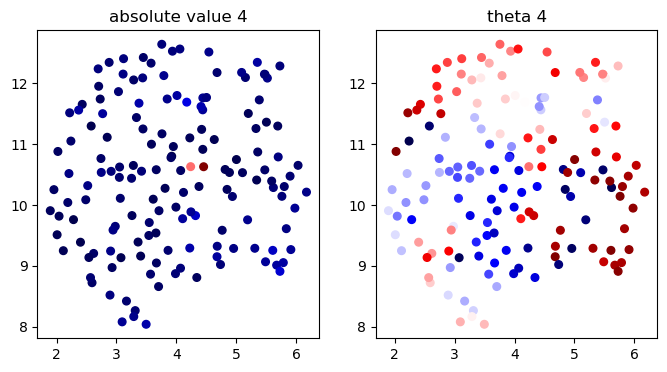

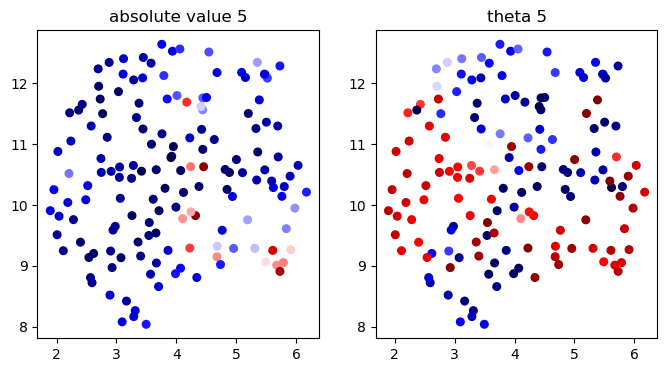

...

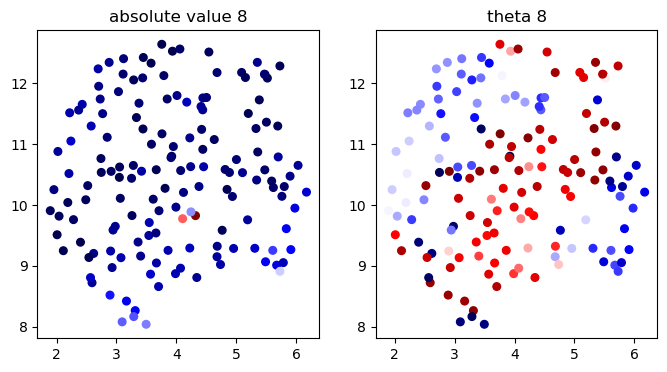

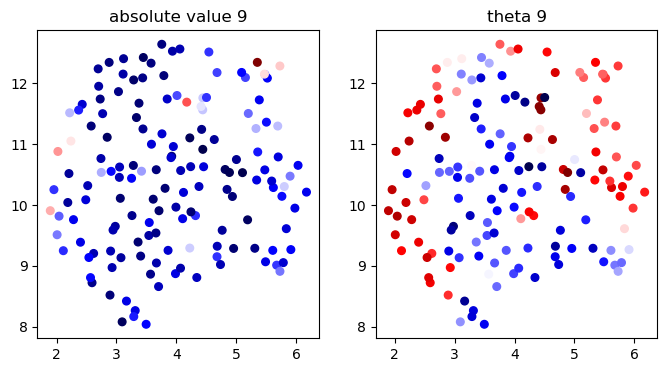

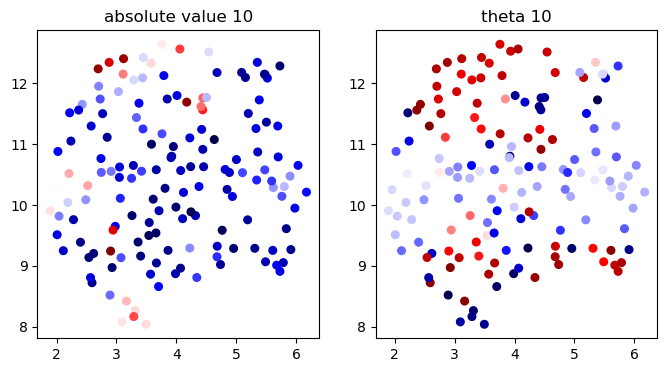

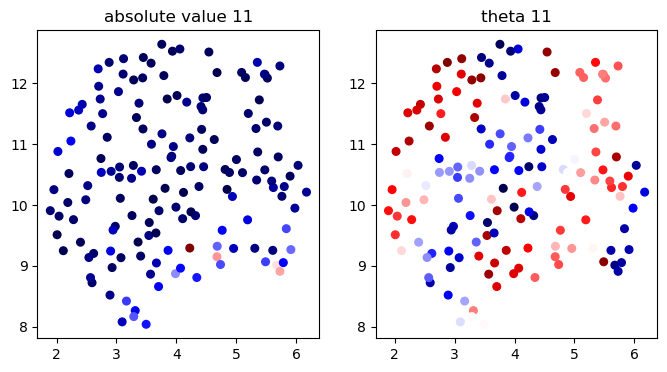

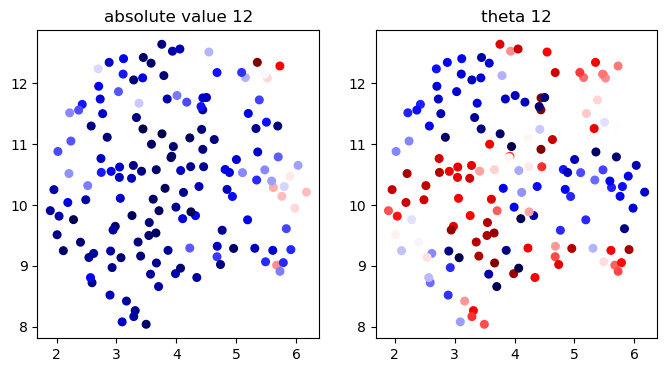

In [560]:
plt.close('all')
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=va[:,icomp],cmap=plt.cm.seismic)
    plt.title('absolute value '+str(ncomp-icomp))
    plt.subplot(1,2,2);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.title('theta '+str(ncomp-icomp))
    plt.savefig(date+'/componentrth_'+str(ncomp-icomp)+'_H_nc'+str(n_clusters)+'_ncomp'+str(ncomp)+'_'+figid+'.png')

In [561]:
dx_clusters=np.zeros((nf,n_clusters,2))
MtSet=[None]*nf
for i in range(nf):
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix(x0,x1,clusters_minima)
    MtSet[i]=Mt.copy()
    dxmatrix=np.zeros((n_clusters,n_clusters,2))
    for ii in range(n_clusters):
        for jj in range(n_clusters):
            dxmatrix[ii,jj]=(x_clusters[jj,:]-x_clusters[ii,:])*Mt[ii,jj]
    dx_clusters[i,:,:]=np.sum(dxmatrix,axis=1)

dx_clusters_smooth=np.zeros_like(dx_clusters)
knn=20
for i in range(nf):
    for iclust in range(n_clusters):
        xc=np.array([clusters_minima.clustercenters[iclust,:]])
        dmatr=utilities.get_dmat(clusters_minima.clustercenters,xc) #get closest cells to cluster center
        indr=np.argsort(dmatr[:,0])
        indr=indr[0:knn]
        dx_clusters_smooth[i,iclust,:]=np.mean(dx_clusters[i,indr,:],axis=0)

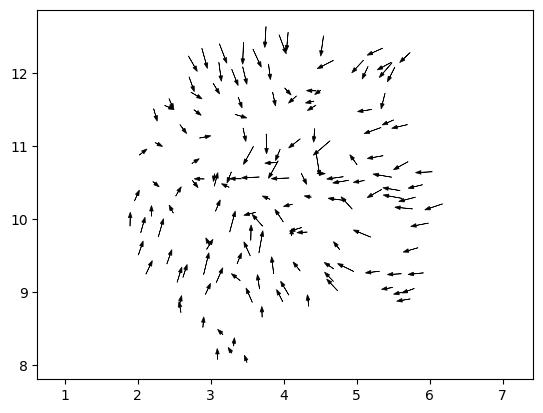

In [562]:
dxsav=np.mean(dx_clusters_smooth,axis=0)
ascale=4.0
ax=plt.gca()
for ic in range(n_clusters):
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.5,color='black',alpha=1.0)

plt.axis('equal')
plt.savefig(date+'/dx_clusters_'+figid+'.png')
plt.savefig(date+'/dx_clusters_'+figid+'.pdf')
plt.pause(.1)

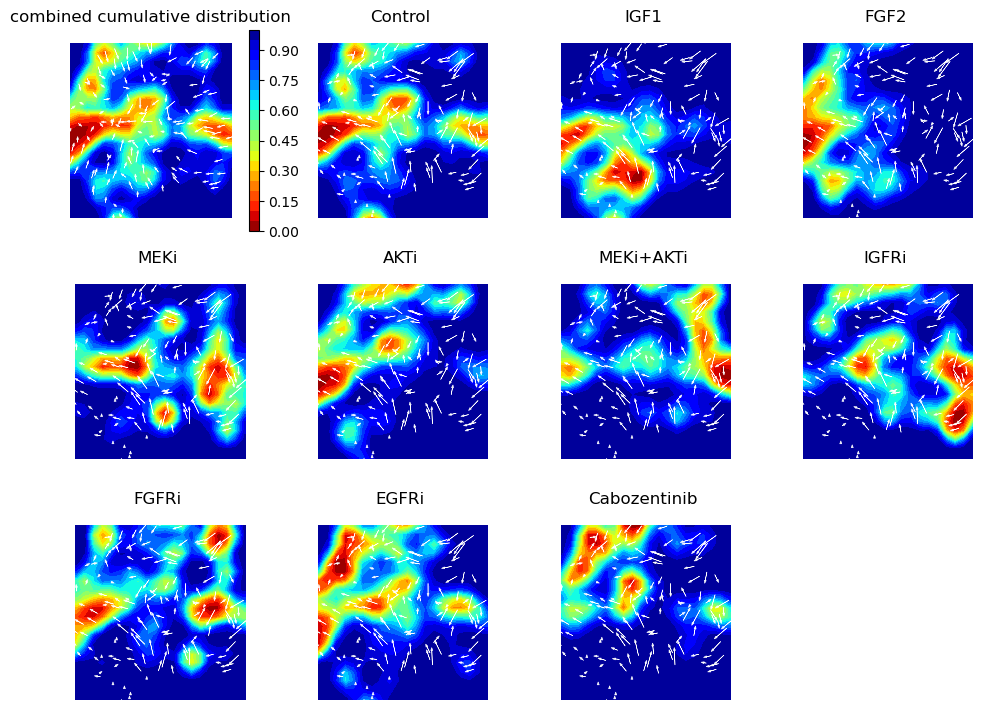

In [563]:
plt.close('all')
nbins=20
fl=0
fu=192 #frames for time window
sml=1
nplots=int(np.ceil(np.sqrt(nf+1)))
plt.figure(figsize=(12,12))
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
probSet=[None]*nf
plt.subplot(nplots,nplots,1)
prob1,xedges1,yedges1=np.histogram2d(x_clusters_all[indstw,0],x_clusters_all[indstw,1],bins=nbins,density=True)
prob1=scipy.ndimage.gaussian_filter(prob1,sigma=sml)
prob1c=utilities.get_cdist2d(prob1)
xx,yy=np.meshgrid(.5*xedges1[1:]+.5*xedges1[0:-1],.5*yedges1[1:]+.5*yedges1[0:-1])
levels=np.linspace(0,1,21)
cs=plt.contourf(xx,yy,prob1c.T,levels=levels,cmap=plt.cm.jet_r)
cbar=utilities.colorbar(cs)
#cbar.set_label('cumulative probability')
plt.title('combined cumulative distribution')
plt.axis('off')
for ic in range(n_clusters):
    ax=plt.gca()
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    
for imf in range(nf):
    tm=tmSet[imf]
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    prob,xedges2,yedges2=np.histogram2d(x_clusters_all[indstwm,0],x_clusters_all[indstwm,1],bins=[xedges1,yedges1],density=True)
    #prob=prob/np.sum(prob)
    prob=scipy.ndimage.gaussian_filter(prob,sigma=sml)
    probc=utilities.get_cdist2d(prob)
    probSet[imf]=prob.copy()
    plt.subplot(nplots,nplots,imf+2)
    #levels=np.linspace(0,np.max(prob),100)
    cs=plt.contourf(xx,yy,probc.T,levels=levels,cmap=plt.cm.jet_r,extend='both')
    dxf=dx_clusters_smooth[i,:,:]
    ax=plt.gca()
    for ic in range(n_clusters):
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxf[ic,0],ascale*dxf[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    plt.title(tmSet[imf])
    cs.cmap.set_over('darkred')
    plt.axis('off')

plt.savefig(date+'/probflows_'+figid+'.png')

In [564]:
ntraj=x.shape[0]
erk_akt_crosscorr=np.zeros(ntraj)
for i in range(ntraj):
    erk_akt_crosscorr[i]=np.corrcoef(corrc_erk_full_traj[i,:],corrc_akt_full_traj[i,:])[0,1]

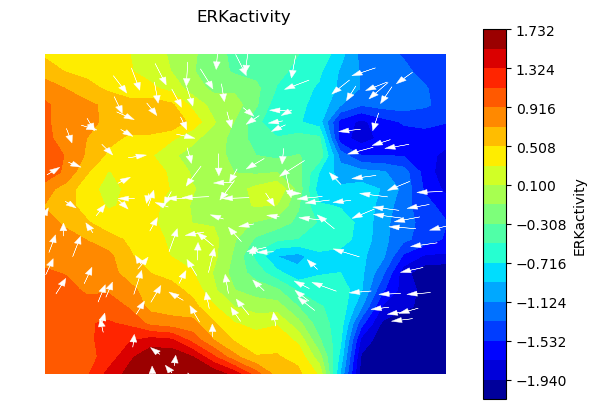

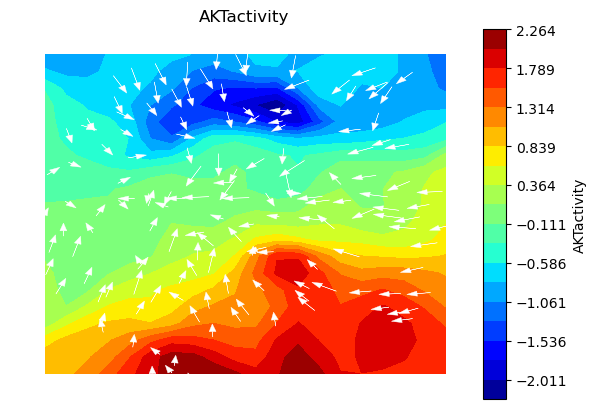

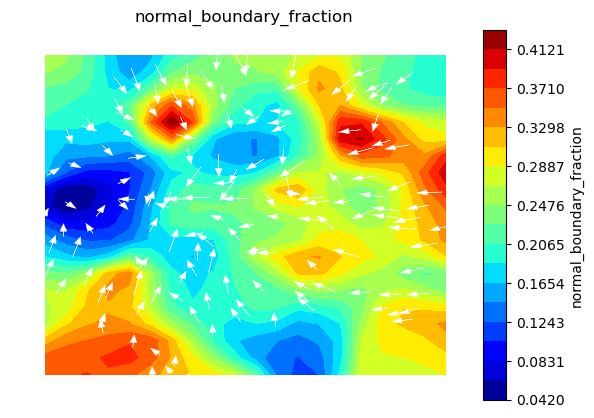

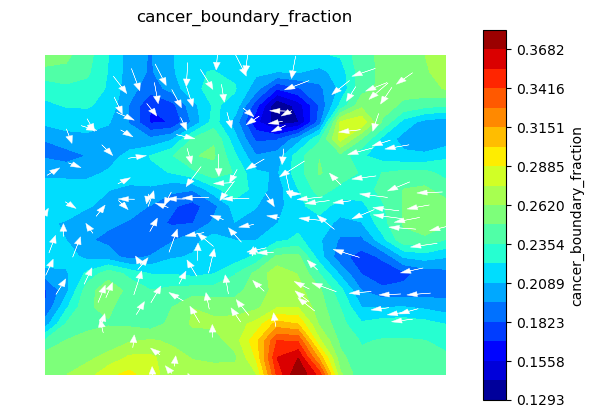

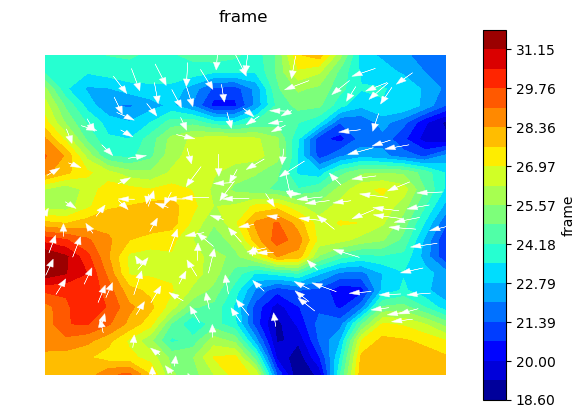

...

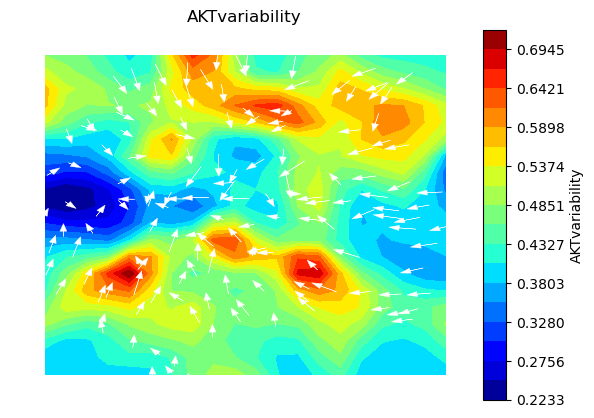

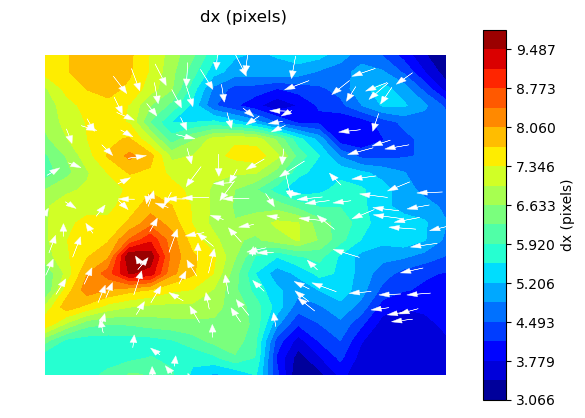

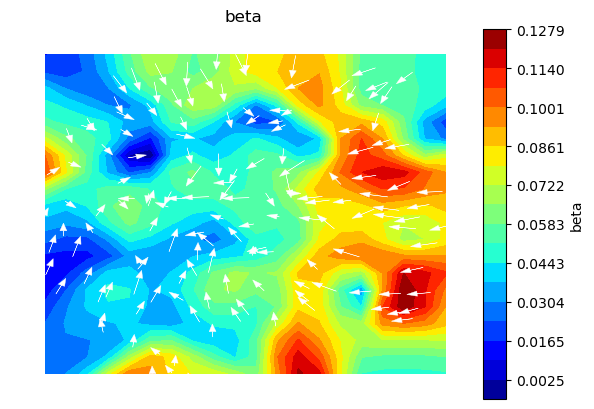

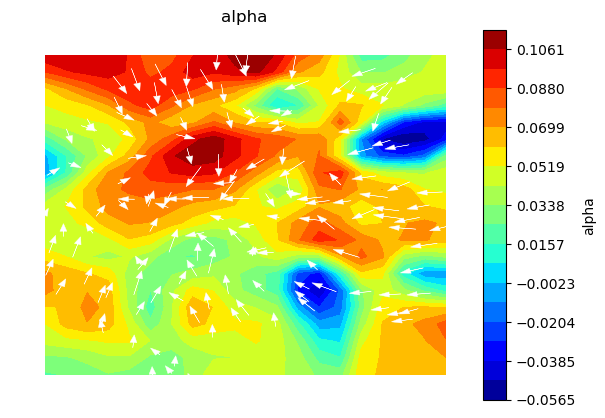

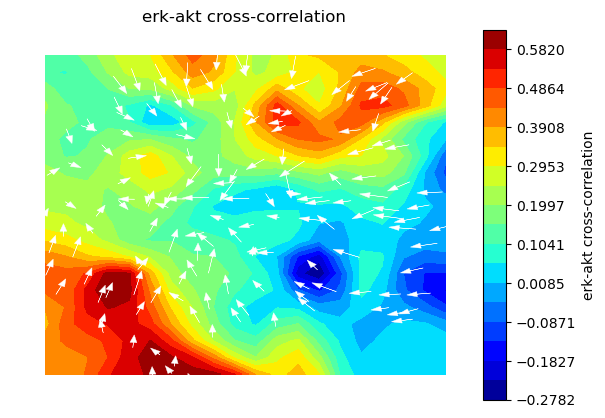

In [565]:
corrc_erk_var_traj=np.std(corrc_erk_full_traj,axis=1)
corrc_akt_var_traj=np.std(corrc_akt_full_traj,axis=1)
#vsetList=[corrc_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_var_traj,dx_traj]
#captionset=['ERKactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','dx (pixels)']
vsetList=[corrc_erk_traj,corrc_akt_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_akt_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx (pixels)','beta','alpha','erk-akt cross-correlation']
#vset=cb_ratio_traj
#vset=cc_ratio_traj
#vset=Xpcat[:,-3]
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
    plt.figure()
    #plt.subplot(4,4,1)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx,yy=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
    for ic in range(n_clusters):
        ax=plt.gca()
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.07,linewidth=.3,color='white',alpha=1.0)
    cs.cmap.set_over('darkred')
    cs.cmap.set_under('darkblue')
    cbar=utilities.colorbar(cs)
    cbar.set_label(captionset[iv])
    #cbar.set_label('cell-cell boundary fraction')
    #cbar.set_label('speed')
    #cbar.set_label('beta')
    plt.title(captionset[iv])
    plt.axis('off')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.pdf')
    plt.pause(.4)

[0.01333333 0.98666667]
2 states initial, 1 states final
[0.01333333 0.04666667 0.94      ]
3 states initial, 2 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
2 states
[19.26090748  5.97565923         nan 38.30769231         nan 18.64433498
 31.13744206 10.80914826 21.32117812         nan]


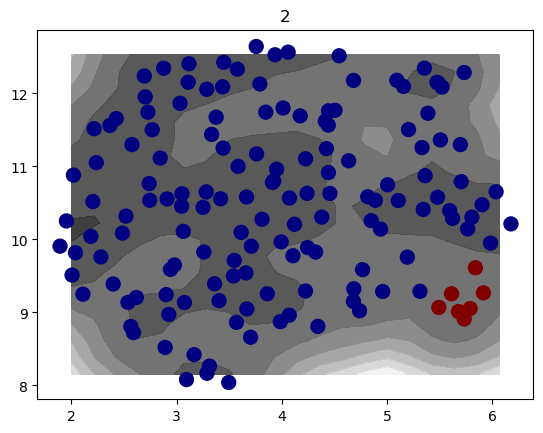

[0.01333333 0.04666667 0.42       0.52      ]
4 states initial, 3 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
3 states
[35.21487998 22.94831451 32.47457547 65.88856141 10.89443378 40.75157878
 48.21026686 32.9661343  41.81478742         nan]


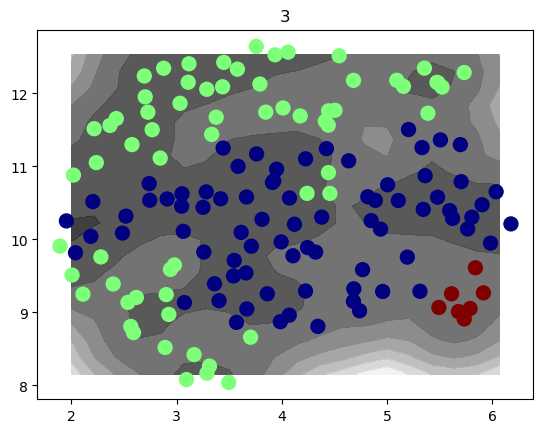

[0.01333333 0.04666667 0.06666667 0.18666667 0.68666667]
5 states initial, 4 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
4 states
[68.44782403 54.69878165 57.17351163 48.54623313 44.34835652 53.29374657
 55.10560252 35.37920168 58.10146135 69.86456401]


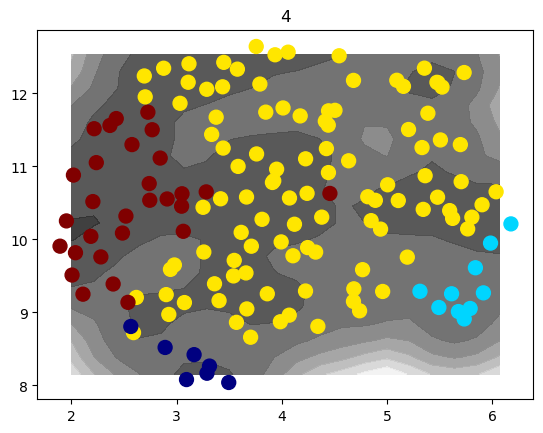

[0.01333333 0.02       0.04666667 0.04666667 0.26666667 0.60666667]
6 states initial, 4 states final
[0.01333333 0.02       0.04666667 0.04666667 0.12666667 0.22
 0.52666667]
7 states initial, 5 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
5 states
[ 79.05095749  58.36251349  53.88409048 102.34974074  55.46290118
  97.927195    60.60444352  47.81046854  63.94905047  41.33072098]


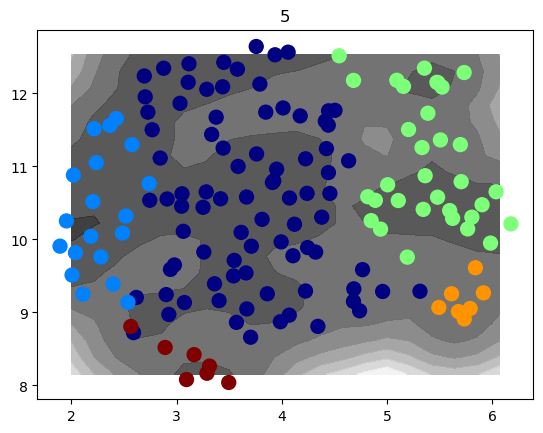

[0.01333333 0.02       0.04       0.04666667 0.09333333 0.14666667
 0.18       0.46      ]
8 states initial, 6 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
6 states
[ 89.78180821  71.51970699  55.8091094  154.8616474   64.07341767
  82.75866415  79.12383467  98.60826094  85.57921059  43.14155499]


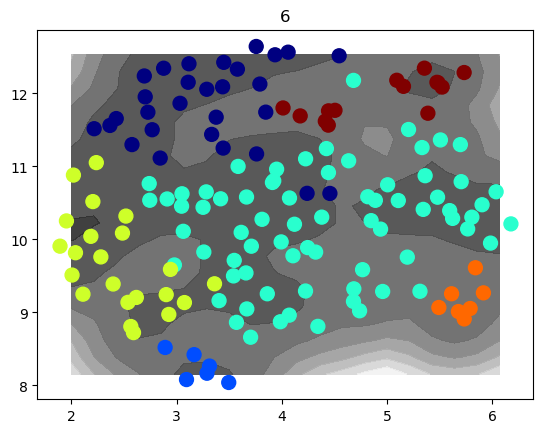

[0.01333333 0.02       0.04       0.04666667 0.05333333 0.09333333
 0.18       0.24       0.31333333]
9 states initial, 7 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
7 states
[112.3297862   87.806473    73.16719621  89.35912302  71.14023217
  77.74260871  93.53558858  75.23920547  97.58869681  41.57713415]


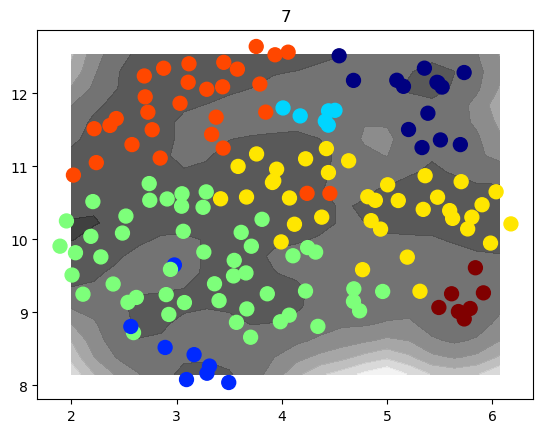

[0.01333333 0.02       0.04       0.04666667 0.04666667 0.09333333
 0.14666667 0.14666667 0.17333333 0.27333333]
10 states initial, 8 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
8 states
[123.78741963 108.8310899   80.63237146 109.17458851  88.98005868
 132.3693117  101.83602558  93.37703706 118.62745188          nan]


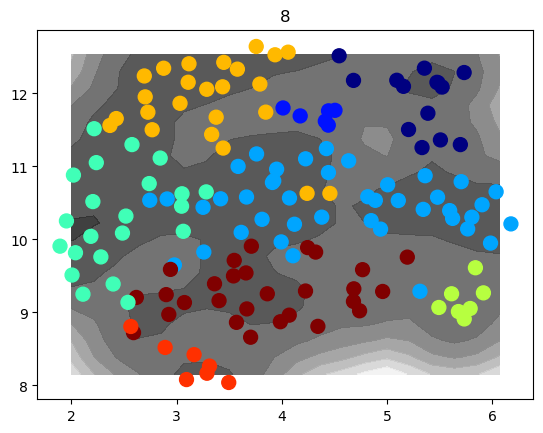

[0.01333333 0.01333333 0.02       0.04       0.04666667 0.05333333
 0.09333333 0.1        0.17333333 0.20666667 0.24      ]
11 states initial, 8 states final
[0.01333333 0.01333333 0.02       0.04       0.04       0.04666667
 0.08       0.09333333 0.12       0.13333333 0.16       0.24      ]
12 states initial, 9 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
9 states
[133.05194915 111.66673802  80.82541741 120.48817622  99.75213634
 172.35740861 139.28734289 133.90058605 142.42002882  76.88207308]


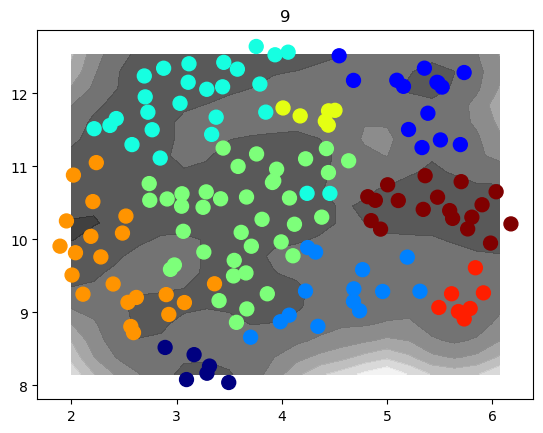

[0.01333333 0.01333333 0.02       0.04       0.04666667 0.05333333
 0.06       0.06666667 0.09333333 0.12       0.14       0.16
 0.17333333]
13 states initial, 10 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
10 states
[148.03143797 134.11374048  91.85141794          nan 127.91501903
 177.57863017 149.61383744 132.60258614 149.62870915  87.07268434]


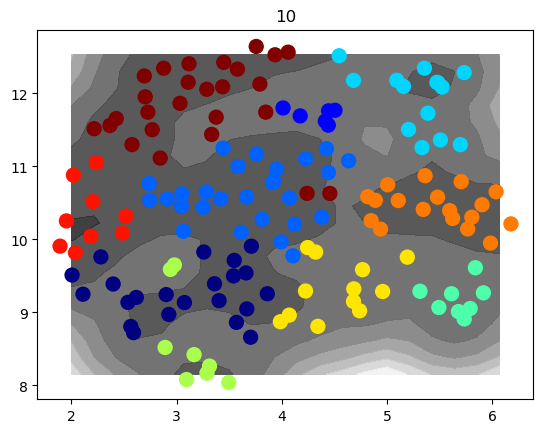

[0.01333333 0.01333333 0.02       0.03333333 0.04       0.04666667
 0.05333333 0.07333333 0.08       0.08666667 0.09333333 0.14
 0.14666667 0.16      ]
14 states initial, 11 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
11 states
[173.85315386 147.07281624 101.53480213 178.50985675 123.97893417
 232.03385608 176.19809675 150.61206661 152.10641125 140.33601003]


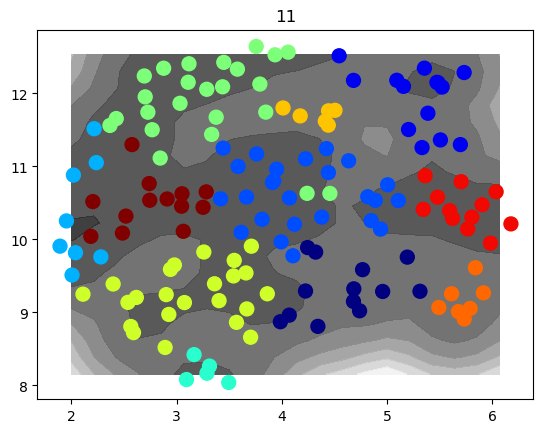

[0.00666667 0.00666667 0.01333333 0.02       0.04       0.04
 0.04       0.04666667 0.05333333 0.06666667 0.09333333 0.12666667
 0.13333333 0.14       0.17333333]
15 states initial, 11 states final
[0.00666667 0.00666667 0.01333333 0.01333333 0.02       0.04
 0.04       0.05333333 0.06       0.06       0.08666667 0.08666667
 0.09333333 0.11333333 0.11333333 0.19333333]
16 states initial, 11 states final
[0.00666667 0.00666667 0.00666667 0.01333333 0.02       0.04
 0.04666667 0.05333333 0.05333333 0.06       0.07333333 0.08666667
 0.08666667 0.08666667 0.09333333 0.12       0.14666667]
17 states initial, 12 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
12 s

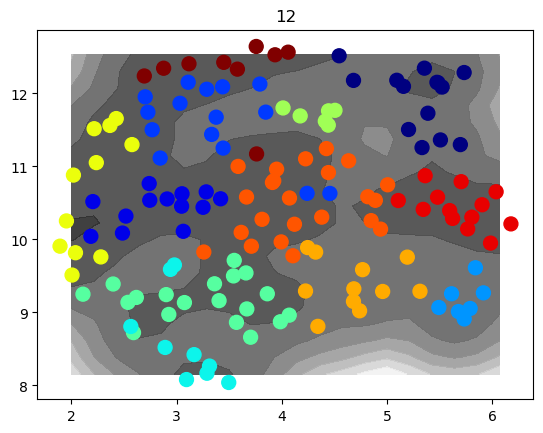

[0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333
 0.04       0.04       0.04666667 0.05333333 0.07333333 0.08
 0.08       0.09333333 0.09333333 0.11333333 0.11333333 0.12      ]
18 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.01333333 0.01333333 0.01333333
 0.02666667 0.04       0.04       0.04666667 0.04666667 0.07333333
 0.07333333 0.07333333 0.08       0.1        0.10666667 0.11333333
 0.12      ]
19 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333
 0.03333333 0.04       0.04       0.04666667 0.04666667 0.04666667
 0.05333333 0.06       0.07333333 0.08       0.08666667 0.09333333
 0.11333333 0.13333333]
20 states initial, 14 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
buildi

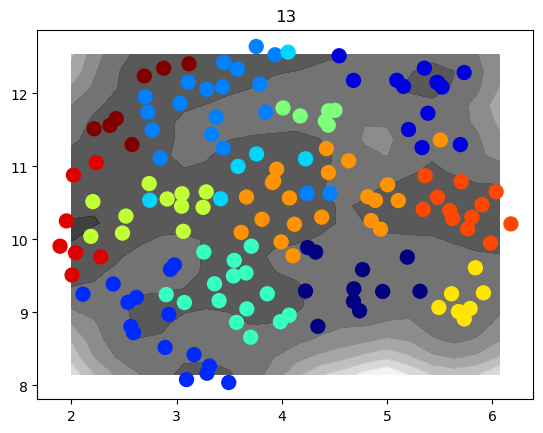

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333
 0.01333333 0.02       0.02666667 0.04       0.04       0.04
 0.04666667 0.05333333 0.06666667 0.06666667 0.07333333 0.07333333
 0.09333333 0.13333333 0.16666667]
21 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333
 0.02       0.02666667 0.03333333 0.04       0.04       0.04
 0.04666667 0.04666667 0.06       0.06       0.07333333 0.07333333
 0.07333333 0.08666667 0.1        0.12666667]
22 states initial, 14 states final
building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib
14 states
[215.5506181  184.9748831  133.73873055 183.34936946 137.42746015
 236.37403856 

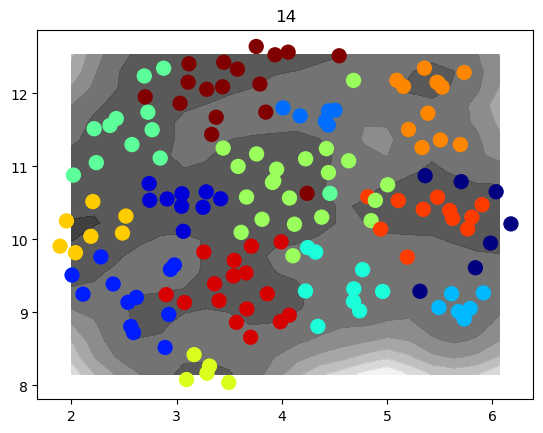

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.01333333 0.02       0.02       0.04
 0.04666667 0.04666667 0.06       0.06       0.06       0.07333333
 0.08       0.08       0.10666667 0.12       0.12      ]
23 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.02666667 0.03333333
 0.04       0.04666667 0.04666667 0.04666667 0.06       0.06666667
 0.07333333 0.07333333 0.08       0.08       0.10666667 0.15333333]
24 states initial, 13 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.01333333 0.01333333 0.02       0.02
 0.02       0.03333333 0.04666667 0.04666667 0.05333333 0.05333333
 0.06       0.07333333 0.08       0.08       0.08666667 0.11333333
 0.13333333]
25 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.0133333

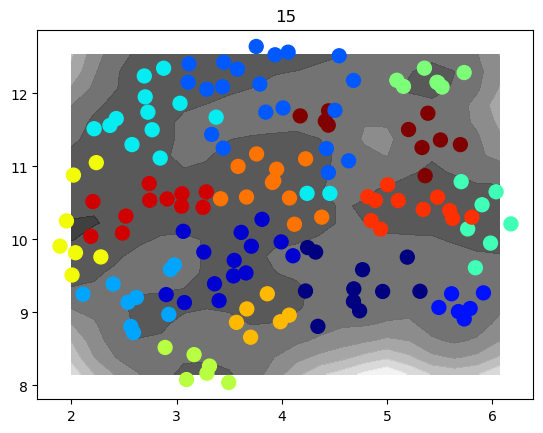

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.02
 0.03333333 0.03333333 0.03333333 0.03333333 0.04       0.04666667
 0.05333333 0.06       0.06       0.06666667 0.07333333 0.07333333
 0.08666667 0.09333333 0.11333333]
27 states initial, 15 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.01333333 0.01333333 0.01333333 0.02
 0.02       0.03333333 0.03333333 0.03333333 0.04       0.04666667
 0.04666667 0.05333333 0.06       0.06       0.06       0.07333333
 0.07333333 0.08       0.08       0.09333333]
28 states initial, 15 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.01333333 0.01333333 0.02       0.02
 0.02666667 0.03333333 0.03333333 0.03333333 0.03333333 0.03333333
 0.04       0.04666667 0.04666667 0.05333333 0.05333333 0.06
 0.06       0.07333333 0.07333333 0.08       0.1       ]
29 states in

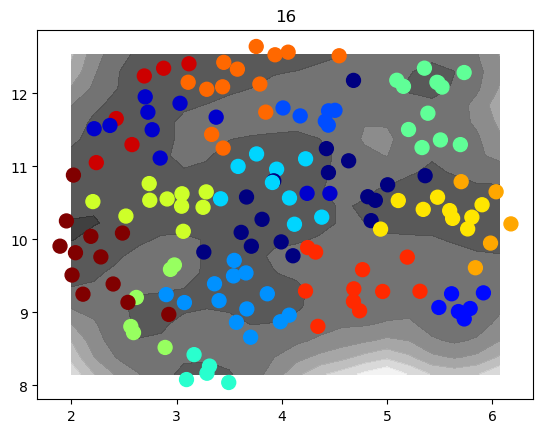

[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.01333333 0.01333333 0.01333333 0.01333333 0.02
 0.02       0.02       0.02666667 0.02666667 0.03333333 0.03333333
 0.03333333 0.04       0.04       0.04666667 0.04666667 0.04666667
 0.06       0.06       0.06666667 0.08       0.09333333 0.10666667]
30 states initial, 14 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.02
 0.02       0.02       0.02       0.02666667 0.03333333 0.03333333
 0.03333333 0.03333333 0.03333333 0.04       0.04666667 0.04666667
 0.05333333 0.06       0.07333333 0.07333333 0.07333333 0.08
 0.1       ]
31 states initial, 15 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.00666667 0.00666667
 0.00666667 0.00666667 0.00666667 0.00666667 0.02       0.02
 0.02       0.02       0.02       0.02       0.02666667 0.02666667
 0.03333333 0.03333333 0.04       0.04       0.04666667 0.04666667
 0

KeyboardInterrupt: 

In [566]:
plt.close('all')
plt.clf()
nstateSet=[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,20,22,24,28,30] #,30,40]
nS=len(nstateSet)
scoreSet_states=[None]*nS
nstates_initial=nstateSet[0]
pcut_final=.03 #try to ajust higher it is, limits states
indc_x0set=clusters_minima.assign(x0set);indc_x1set=clusters_minima.assign(x1set)
for istate in range(len(nstateSet)):
    MtSet_test=[None]*nf
    nstates=nstateSet[istate]
    scoreSet=np.zeros(nf)
    #clusters_v = KMeans(n_clusters=nstates,init='k-means++',n_init=1000,max_iter=1000)
    #clusters_v.fit(vkin)
    #states=clusters_v.labels_
    states,nstates_initial=model.get_kineticstates(vkin,nstates,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=True,cluster_ninit=100)
    for imf in range(nf):
        print('building likelihood model for '+tmSet[imf])
        indmodels=np.where(inds_tmSet_models==imf)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        indstm=np.array([]).astype(int)
        for i in indmodels: #[:-1]:
            indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
        MtSet_test[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=states)
        scoreSet[imf]=model.get_kscore(MtSet_test[imf])
        #scoreSet[imf]=model.get_path_entropy_2point(states[indc_x0set],states[indc_x1set],MtSet_test[imf])
    print(str(nstates)+' states')
    print(scoreSet)
    nstates_initial=nstates_initial+1
    #np.savetxt(f'{date}_scoreSet_{figid}_nS{nstates}.dat',scoreSet)
    scoreSet_states[istate]=scoreSet
    plt.clf()
    plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)
    plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=states,cmap=plt.cm.jet)
    plt.title(str(nstates))
    plt.pause(2)
    #plt.savefig(f'{date}/clustertest_{figid}_{nstates}.png')

/tmp/ipykernel_620705/298439866.py:15: RuntimeWarning: Mean of empty slice
  plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)


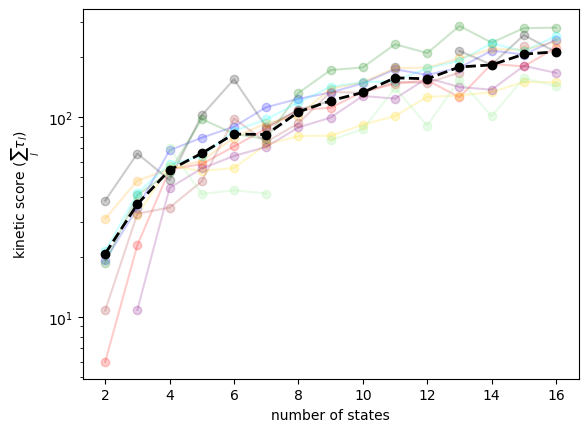

<Figure size 640x480 with 0 Axes>

In [568]:
scoreSet_statearray=np.zeros((nS,nf))
for istate in range(len(nstateSet)):
    try:
        scoreSet_statearray[istate,:]=scoreSet_states[istate]
    except:
        pass

plt.close('all')
#colorSet=['red','gold','green','blue','black','red','gold','green','blue','black','brown','orange','purple']
colorSet=['blue','red','gold','black','purple','green','orange','brown','cyan','lightgreen','magenta','darkblue','darkred','darkgray','darkgreen']
plt.clf()
for imf in range(nf):
    plt.plot(nstateSet,scoreSet_statearray[:,imf],'o-',color=colorSet[imf],label=tmSet[imf],alpha=.2)

plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)
plt.yscale('log')
#plt.ylabel(r'path entropy $-\langle log(p_{ij})\rangle$')
plt.ylabel(r'kinetic score ($\sum_l \tau_l$)')
plt.xlabel('number of states');plt.pause(.1)
plt.savefig(f'{date}/scoreset_{figid}.png')

In [ ]:
scoreSet

In [569]:
get_kstates=True
nstates_final=15
#nstates_final=13 #for production
pcut_final=.03 #for prediction
#pcut_final=.02 #for production
nstates_initial=nstates_final
stateCenters=x_clusters
if get_kstates:
    stateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=100)
    objFile='stateSet_'+figid+'_nS'+str(nstates)+'.obj'
    objFileHandler=open(objFile,'wb')
    states_object=[clusters_minima,stateSet]
    pickle.dump(states_object,objFileHandler,protocol=4)
    objFileHandler.close()
    #stateSet=get_kineticstates(wctm,nstates_final,P=MtSet[4],clusters_minima=clusters_minima,pcut_final=.01,ncomp=ncomp) #treatment specific
else:
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'rb')
    states_object=pickle.load(objFileHandler)
    clusters_minima=states_object[0]
    stateSet=states_object[1]
    objFileHandler.close()

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)



[0.00666667 0.00666667 0.01333333 0.02       0.04       0.04
 0.04       0.04666667 0.05333333 0.06666667 0.09333333 0.12666667
 0.13333333 0.14       0.17333333]
15 states initial, 11 states final
[0.00666667 0.00666667 0.01333333 0.01333333 0.02       0.04
 0.04       0.05333333 0.06       0.06       0.08666667 0.08666667
 0.09333333 0.11333333 0.11333333 0.19333333]
16 states initial, 11 states final
[0.00666667 0.00666667 0.00666667 0.01333333 0.02       0.04
 0.04666667 0.05333333 0.05333333 0.06       0.07333333 0.08666667
 0.08666667 0.08666667 0.09333333 0.12       0.14666667]
17 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.00666667 0.01333333 0.01333333
 0.04       0.04       0.04666667 0.05333333 0.07333333 0.08
 0.08       0.09333333 0.09333333 0.11333333 0.11333333 0.12      ]
18 states initial, 12 states final
[0.00666667 0.00666667 0.00666667 0.01333333 0.01333333 0.01333333
 0.02666667 0.04       0.04       0.04666667 0.04666667 0.07333333
 0.07333

In [605]:
#state_order=np.argsort(state_centers_minima[:,0])
#state_order=np.array([9,16,15,13,10,4,6,7,3,14,12,11,1,0,2,5,8]).astype(int)
state_order=np.array([11,10,9,8,7,6,4,5,2,1,3,0,14,13,12])
#state_order=np.array([0,2,1,7,18,17,15,8,11,4,3,16,14,5,12,13,6,9,10])
#state_order=np.array([5,9,13,7,6,14,10,11,12,8,4,0,2,1,3]) #19jun24
stateSet_ordered=np.ones_like(stateSet)*-1
for istate in range(nstates):
    stateSet_ordered[stateSet==state_order[istate]]=istate

stateSet=stateSet_ordered

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)

inds_states=[None]*n_states
for i in range(n_states):
    indstate=np.where(stateSet[ind_clusters]==i)[0]
    inds_states[i]=indstate

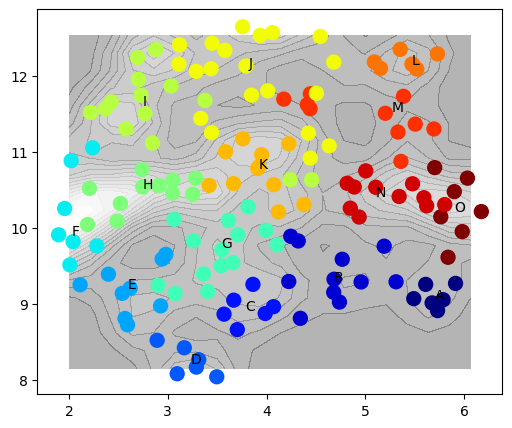

In [606]:
import string
nbins=prob1.shape[0]
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
plt.close('all');plt.figure(figsize=(6,5))
plt.clf()
pts=np.array([xx.flatten(),yy.flatten()]).T
#indpts=clusters_minima.assign(pts)
#states=stateSet[indpts]
#states=states[prob1.flatten()>np.min(prob1[prob1>0])]
#pts=pts[prob1.flatten()>np.min(prob1[prob1>0]),:]
plt.contourf(xx,yy,prob1.T,cmap=plt.cm.gray,levels=20,alpha=.3)
#plt.scatter(tateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=500)ts[:,0],pts[:,1],s=10,c=states,cmap=plt.cm.jet,marker='.',alpha=0.5)
plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=stateSet,cmap=plt.cm.jet)
#for ic in range(n_clusters):
#    ax=plt.gca()
#    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],dxsav[ic,0],dxsav[ic,1],head_width=.1,linewidth=.2,color='white',alpha=1.0)

for istate in range(nstates):
    plt.text(state_centers_minima[istate,0],state_centers_minima[istate,1],str(state_labels[istate]))


plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.png')
plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.pdf')
plt.pause(.1)

In [607]:
def show_cell_activation(self,icell,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0,1],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            #img_bf=imprep.znorm(np.max(img_bf,axis=0))
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,5);nuchigh=np.percentile(img_nuc,95)
        #img_nuc[msk_nuc==0]=-1000.
        #img_rep[msk_cyto==0]=-1000.1
        img_bf=np.abs(img_bf)
        #img_bf[np.logical_not(msk_f)]=0
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        #img_bf=scipy.ndimage.gaussian_filter(img_bf,sigma)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        plt.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        #csr=plt.contour(img_rep,levels=np.linspace(rep_min,rep_max,201),cmap=plt.cm.binary,extend='both')
        #csr.cmap.set_over('black')
        #csr.cmap.set_under('white')
        if show_neighbor_signals:
            plt.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        else:
            plt.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        #####plt.imshow(img_rep,cmap=plt.cm.YlOrBr,clim=(replow,3*rephigh),alpha=.3)
        #plt.contour(img_rep,levels=np.linspace(0,10,11),cmap=plt.cm.inferno,alpha=.3)
        csn=plt.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=plt.cm.Reds,alpha=0.6,linewidths=1)
        #####csn=plt.contour(msk2_cyto>0,levels=np.unique(msk_cyto>0),colors='orange',linewidths=1.2,alpha=.4)
        csn=plt.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        #cs.cmap.set_under('white')
        #plt.imshow(np.ma.masked_where(msk_f==0,np.ones_like(msk_f)),cmap=plt.cm.binary_r,clim=(0,1),alpha=0.15)
        #plt.xlim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1*viewsize*zoom)
        #plt.ylim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1.3*viewsize*zoom)
        #plt.text(zoom*npix/2,zoom*npix/4,r'central slice \textbf{YFP} \textcolor{red}{\textbf{Cy5}}')
        #plt.text(zoom*npix/2,zoom*npix/4,'central slice, YFP black, Cy5 red')
        plt.axis('off')
        return 0
    except Exception as e:
        print(e)
        return 1

In [593]:
sctm.nuc

AttributeError: 'Trajectory' object has no attribute 'nuc'

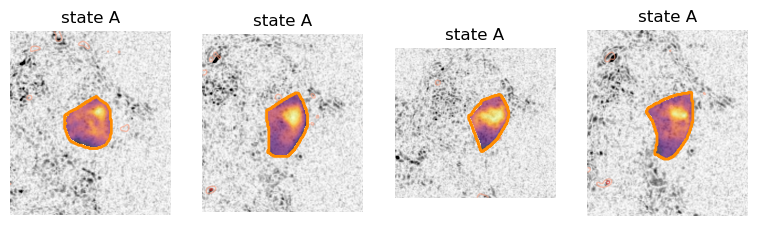

attempt to get argmax of an empty sequence


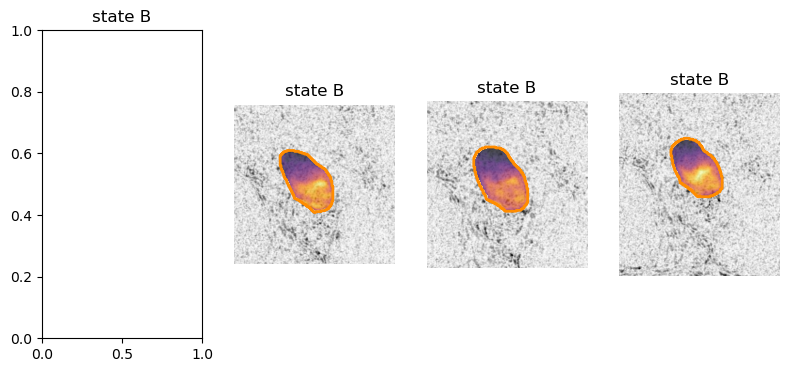

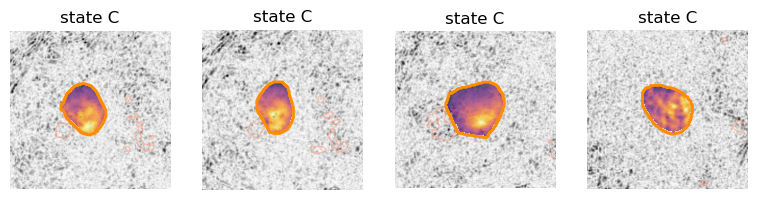

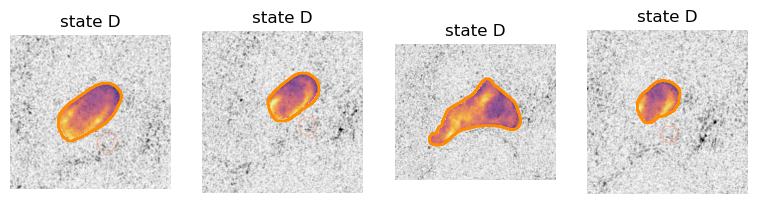

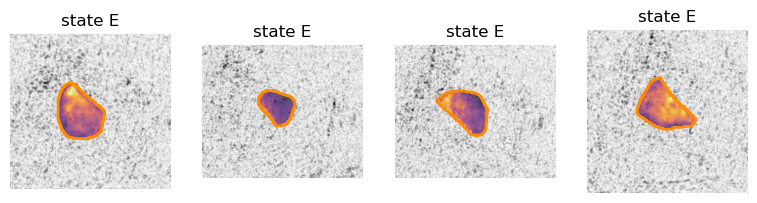

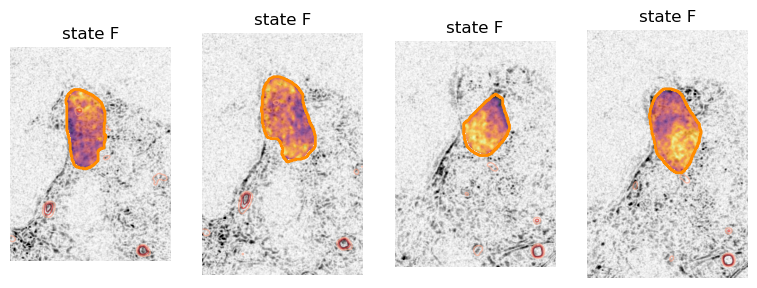

...

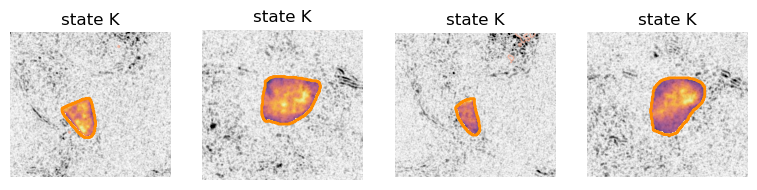

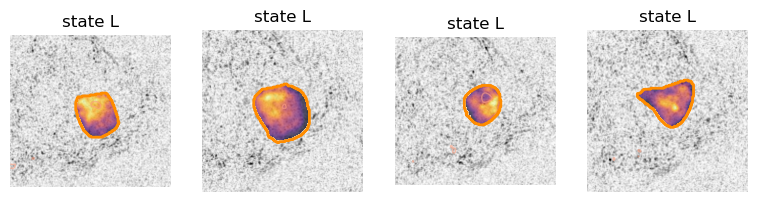

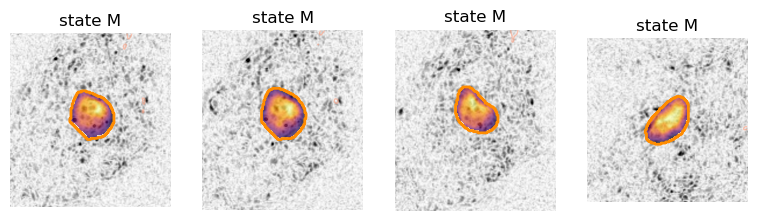

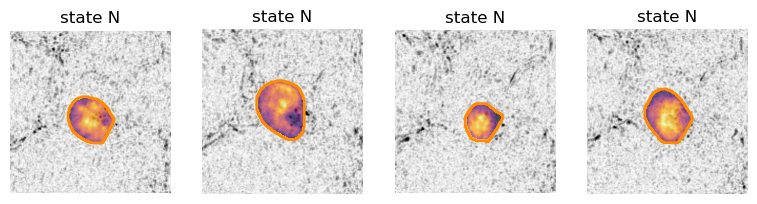

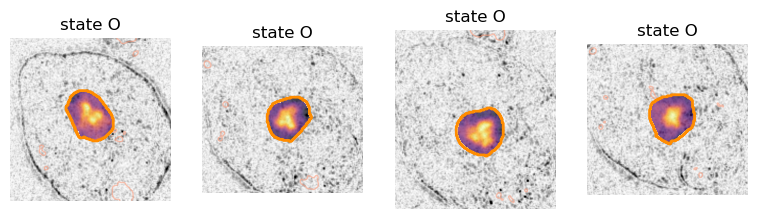

In [608]:
nrounds=1
nr=1
maxl=trajl
stordir='cellstatepics'
os.system(f'mkdir -p {date}/{stordir}')
nuclow=-1.;nuchigh=9.;replow=0.;rephigh=5.;bflow=0.;bfhigh=5.
npics=4
for iround in range(nrounds):
    plt.close('all')
    for istate in range(nstates):
        indcells_traj=inds_states[istate]
        indmodels=indtreatment_traj[indcells_traj]
        indcells_model=cellinds1_traj[indcells_traj]
        indr=np.random.choice(indcells_model.size,nr,replace=False)
        for ic in indr: #range(indcells_traj.size):
            plt.figure(figsize=(12,4))
            model_sctm=modelSet[indmodels[ic]]
            celltraj=model_sctm.get_cell_trajectory(indcells_model[ic])
            if celltraj.size>maxl:
                celltraj=celltraj[-maxl:]
            iplot=0
            for icell in np.linspace(0,celltraj.size-1,npics).astype(int):
                indcell=celltraj[icell]
                plt.subplot(1,npics+1,iplot+1)
                show_cell_activation(model_sctm,indcell,bf_img_channel=bf_img_channel,nuc_img_channel=nuc_img_channel,rep_img_channel=erk_img_channel,nuclow=nuclow,nuchigh=nuchigh,replow=replow,rephigh=rephigh,bflow=bflow,bfhigh=bfhigh)
                iplot=iplot+1
                plt.title(f'state {state_labels[istate]}')
            plt.savefig(f'{date}/{stordir}/state{state_labels[istate]}_cell{ic}_model{indmodels[ic]}_{figid}.png')
            plt.pause(.1)

In [609]:
MtSet=[None]*nf
MtSetCG=[None]*nf
for imf in range(nf):
    print('building likelihood model for '+tmSet[imf])
    indmodels=np.where(inds_tmSet_models==imf)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    indstm=np.array([]).astype(int)
    for i in indmodels: #[:-1]:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
    MtSet[imf]=model.get_transition_matrix(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima);
    MtSetCG[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=stateSet);

building likelihood model for Control
building likelihood model for IGF1
building likelihood model for FGF2
building likelihood model for MEKi
building likelihood model for AKTi
building likelihood model for MEKi+AKTi
building likelihood model for IGFRi
building likelihood model for FGFRi
building likelihood model for EGFRi
building likelihood model for Cabozentinib


In [610]:
nf=len(tmSet)
state_probs=np.zeros((nf,n_states))
nwindow=24
itimes=0
time_inds=np.arange(nwindow,modelSet[0].nt,nwindow).astype(int)
state_probs_times=np.zeros((nf,n_states,time_inds.size))
ntimes=time_inds.size
for itt in time_inds:
    fl=itt-nwindow
    fu=itt+nwindow
    indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
    for i in range(nf):
        indstm=inds_conditions[i]
        indstwm=np.intersect1d(indstm,indstw)
        x0=x[indstwm,:]
        indc0=stateSet[clusters_minima.assign(x0)]
        statesc,counts=np.unique(indc0,return_counts=True)
        state_probs[i,statesc]=counts/np.sum(counts)
    state_probs_times[:,:,itimes]=state_probs
    itimes=itimes+1

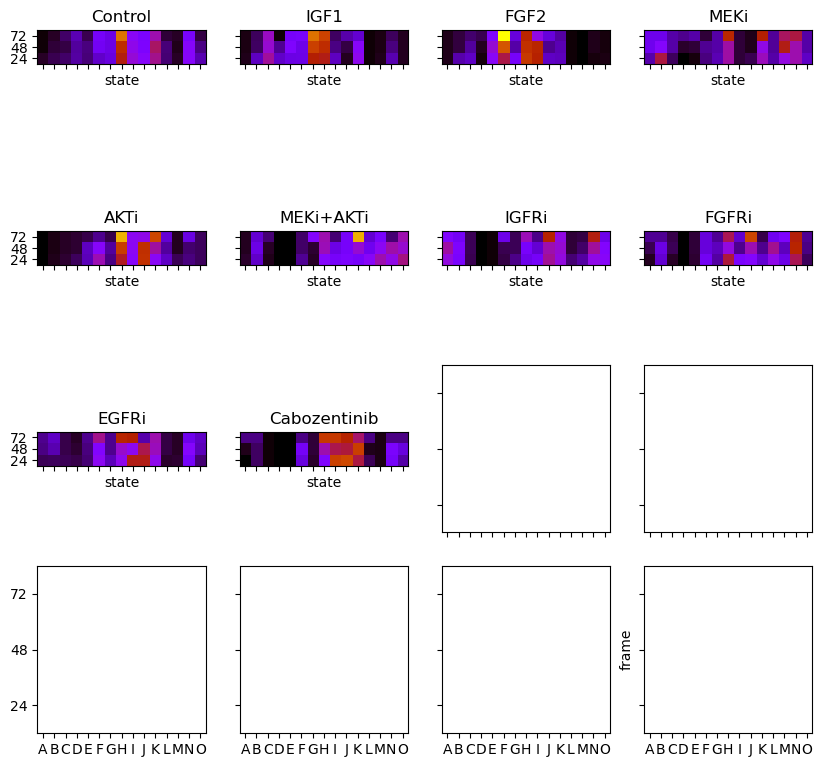

In [611]:
nplots=int(np.ceil(np.sqrt(nf)))
fig,axs=plt.subplots(nplots,nplots,sharex=True,sharey=True,figsize=(10,10))
axs=axs.flatten()
for i_tm in range(nf):
    ax=axs[i_tm]
    ax.imshow(state_probs_times[i_tm,:,:].T,origin='lower',cmap=plt.cm.gnuplot,clim=(np.min(state_probs_times),np.max(state_probs_times)))
    #ax=plt.gca()
    ax.set_yticks(np.arange(time_inds.size))
    ax.set_xticks(np.arange(nstates))
    ax.set_xticklabels(np.array(state_labels))
    ax.set_yticklabels(time_inds)
    ax.set_xlabel('state');plt.ylabel('frame')
    #cbar=plt.colorbar()
    #cbar.set_label('state probabilities')
    ax.set_title(tmSet[i_tm])

plt.savefig(date+f'/stateprobs_times_{figid}_nS{n_states}.png')

In [ ]:
nstates

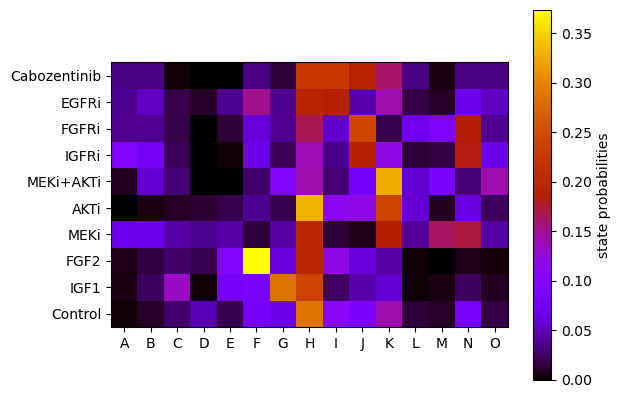

In [612]:
plt.clf()
plt.imshow(state_probs_times[:,:,-1],origin='lower',cmap=plt.cm.gnuplot)
ax=plt.gca()
ax.set_yticks(np.arange(nf))
ax.set_xticks(np.arange(nstates))
ax.set_xticklabels(np.array(state_labels))
ax.set_yticklabels(tmSet)
cbar=plt.colorbar()
cbar.set_label('state probabilities')
plt.savefig(date+f'/stateprobs_overall_{figid}_nS{n_states}.png')

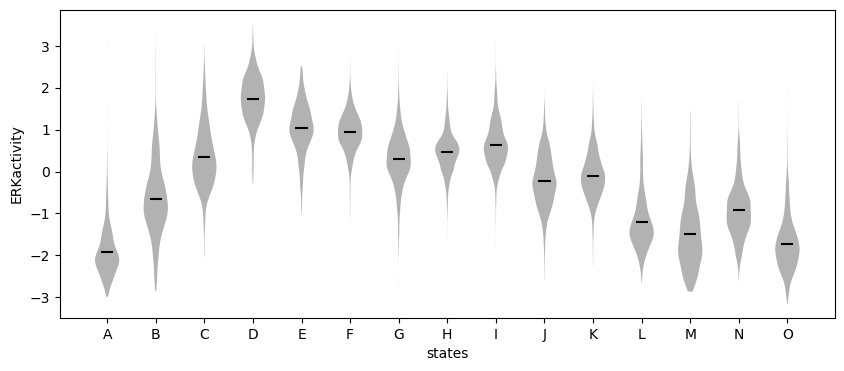

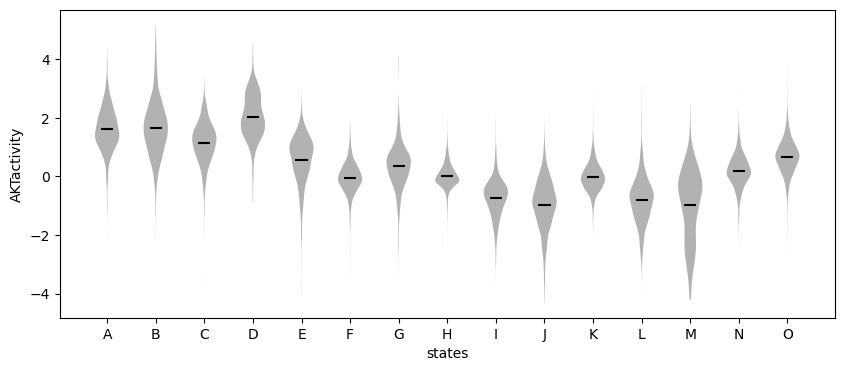

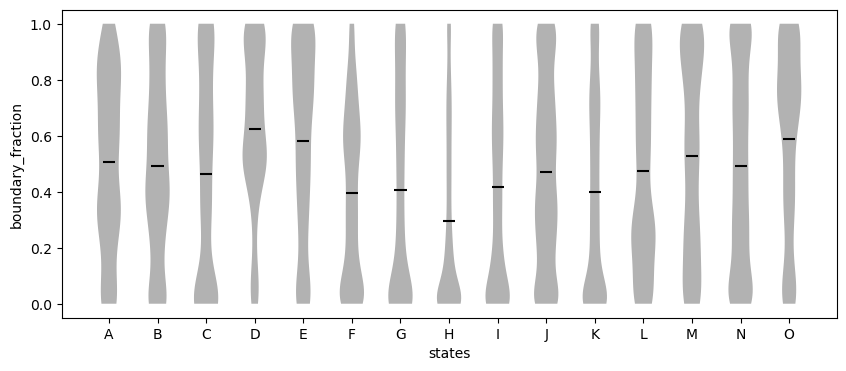

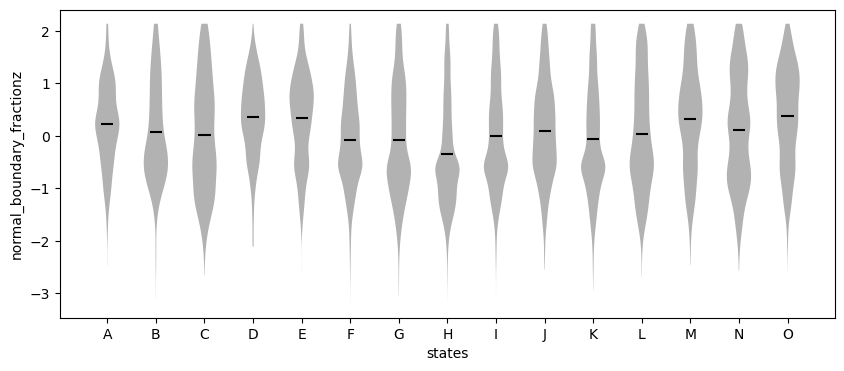

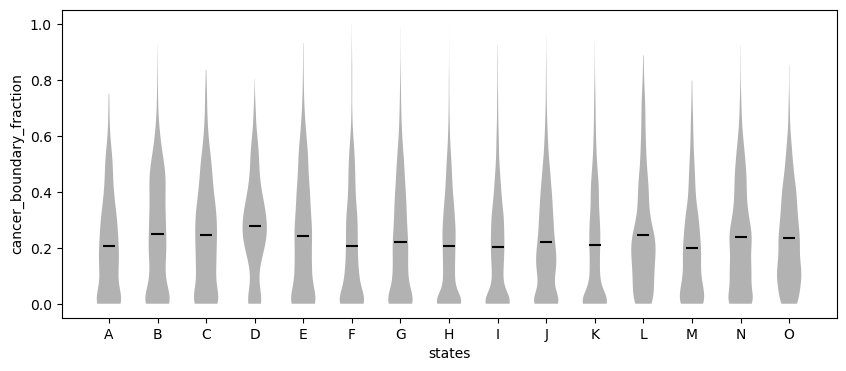

...

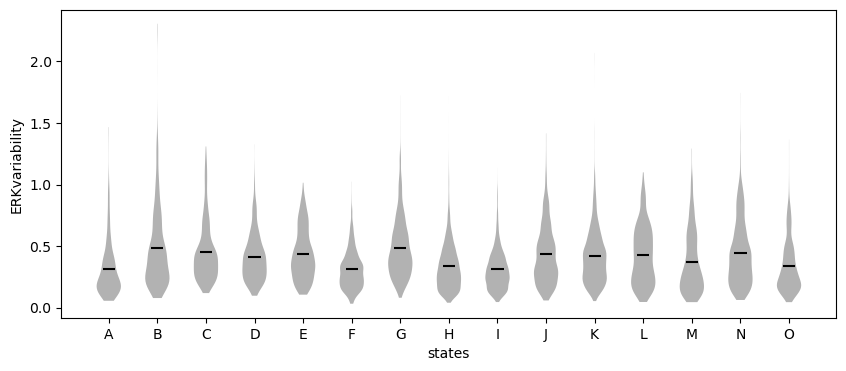

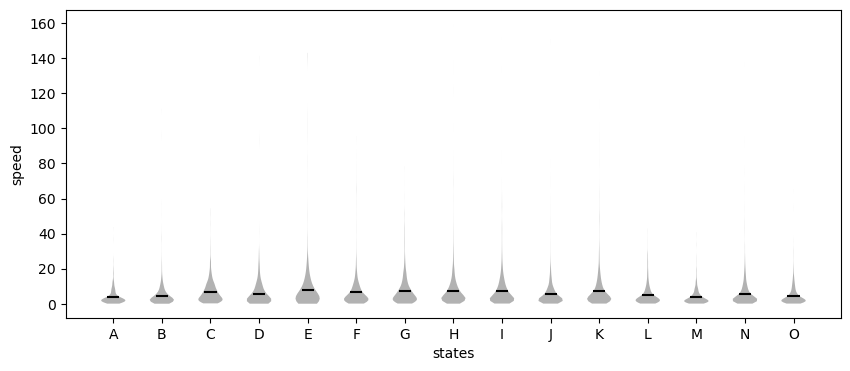

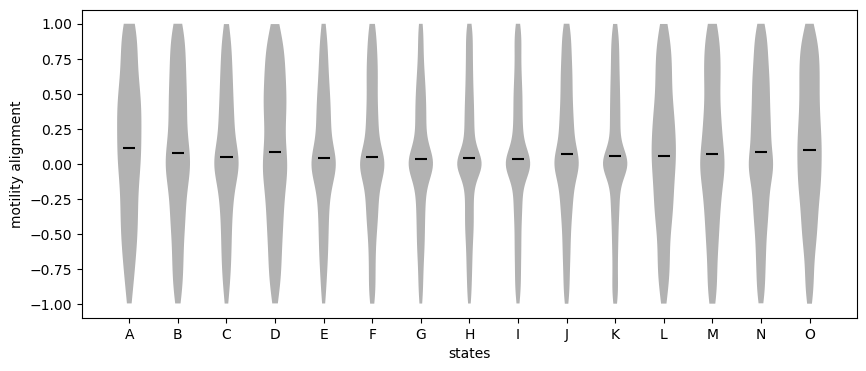

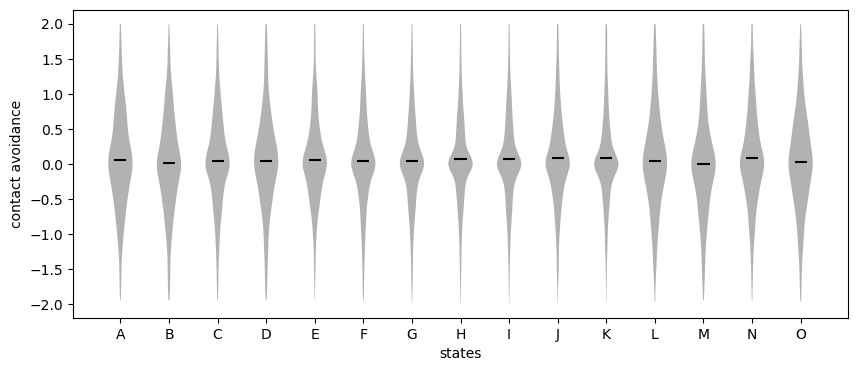

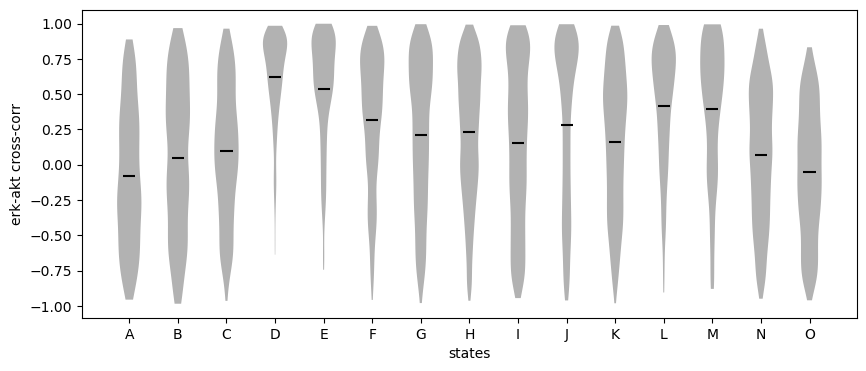

In [613]:
plt.clf()
plt.close('all')
vsetList=[corrc_erk_traj,corrc_akt_traj,cb_ratio_traj,imprep.znorm(cb_ratio_traj-cbc_ratio_traj),cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','boundary_fraction','normal_boundary_fractionz','cancer_boundary_fraction','frame','z','ERKvariability','speed','motility alignment','contact avoidance','erk-akt cross-corr']
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    plt.figure(figsize=(10,4))
    ax=plt.gca()
    for i in range(n_states):
        setv=vset[inds_states[i]]
        setv=setv[np.isfinite(setv)]
        vplot=ax.violinplot(setv,positions=[i+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('black')
            #pc.set_edgecolor('black')
            #pc.set_alpha(1)
    ax.set_xticks(range(1,n_states+1))
    ax.set_xticklabels(state_labels)
    #plt.ylabel('log2(nuc/cyto cc-ratio)')
    #plt.ylabel(r'cell-cell local alignment $\langle \hat{v}_1 \cdot \hat{v}_2 \rangle$')
    #plt.ylabel('speed (z-score)')
    #plt.ylabel('nuc/cyt cc-ratio')
    plt.ylabel(captionset[iv])
    plt.xlabel('states')
    plt.savefig(date+'/'+captionset[iv]+'_tearplot_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_tearplot_'+figid+'.pdf')
    plt.pause(.5)


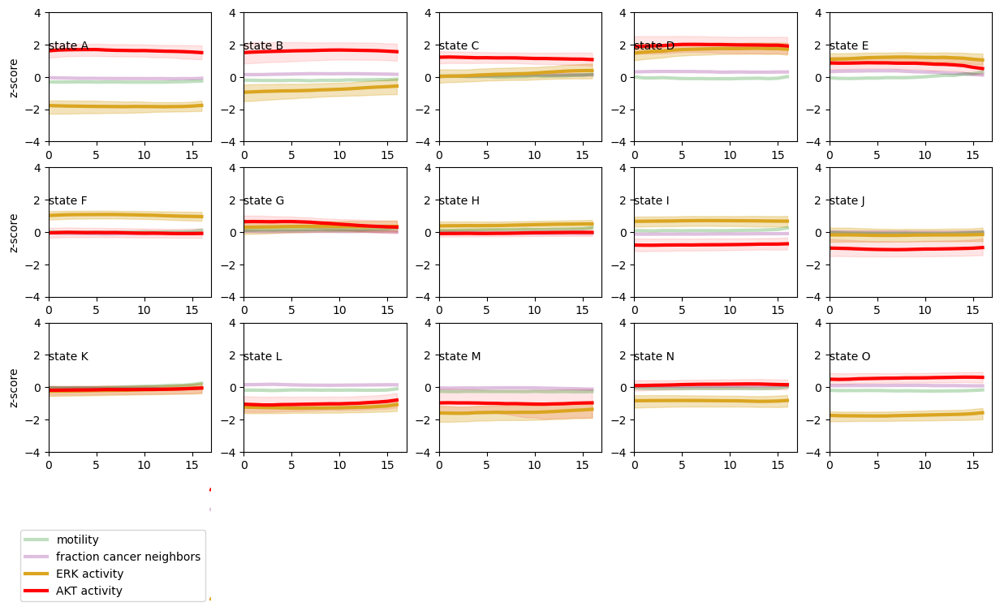

In [614]:
plt.figure(figsize=(15,12))
frames=np.arange(trajl)
#cb_ratio_full_traj=imprep.znorm(cb_ratio_full_traj-cbc_ratio_full_traj)
cbc_ratio_full_traj=imprep.znorm(cbc_ratio_full_traj)
erk_traj=imprep.znorm(corrc_erk_full_traj)
akt_traj=imprep.znorm(corrc_akt_full_traj)
dx_full_traj=imprep.znorm(dx_full_traj)
hplots=5;vplots=5;
for istate in range(nstates):
    plt.subplot(vplots,hplots,istate+1)
    ax=plt.gca()
    #plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
    #ulim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],75,axis=0)
    #llim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],25,axis=0)
    #ax.fill_between(frames,llim,ulim,color='blue',alpha=.3)
    plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
    ulim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],25,axis=0)
    plt.plot(frames,np.nanmean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
    plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
    ulim=np.percentile(erk_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(erk_traj[inds_states[istate],:],25,axis=0)
    ax.fill_between(frames,llim,ulim,color='goldenrod',alpha=.3)
    plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
    ulim=np.percentile(akt_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(akt_traj[inds_states[istate],:],25,axis=0)
    ax.fill_between(frames,llim,ulim,color='red',alpha=.1)
    plt.ylim(-4,4);
    plt.xlim(0,trajl)
    plt.text(0,1.7,f'state {state_labels[istate]}')
    if (istate+1)%hplots==1:
        plt.ylabel('z-score')
    if istate+1>(hplots*(hplots-1)):
        plt.xlabel('frame')
    if istate+1==nstates:
        plt.subplot(vplots,hplots,istate+2)
        plt.plot(frames,np.mean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
        #plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
        plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
        plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
        plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
        plt.xlim(-100,0)
        plt.legend(loc='lower right')
        plt.axis('off')

plt.savefig(date+'/signaling_neighbors_'+figid+'.png')
plt.savefig(date+'/signaling_neighbors_'+figid+'.pdf')
plt.pause(.1)

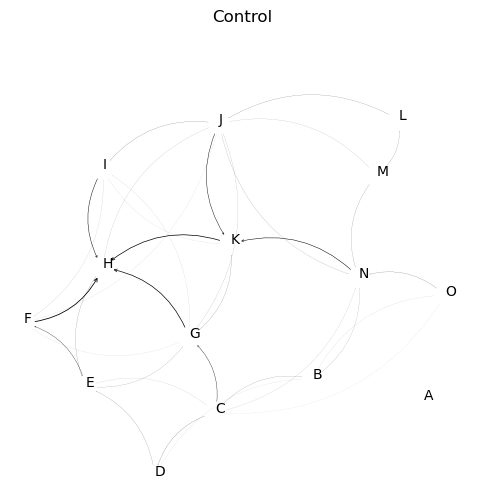

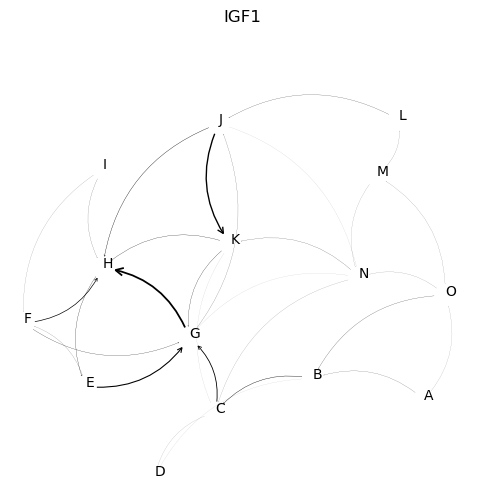

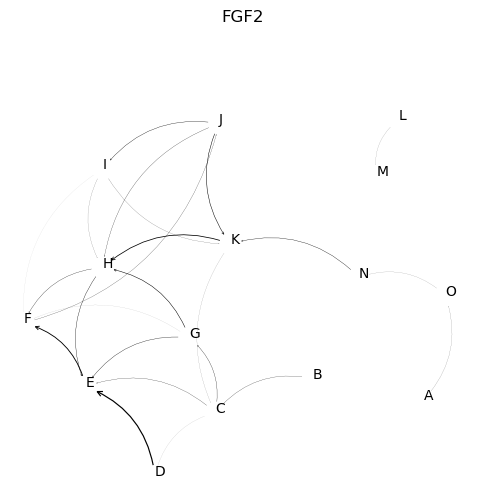

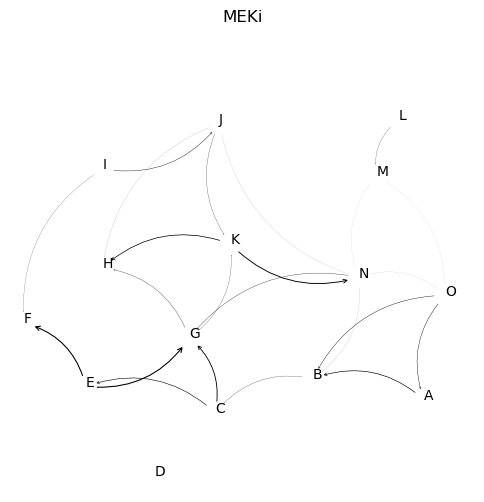

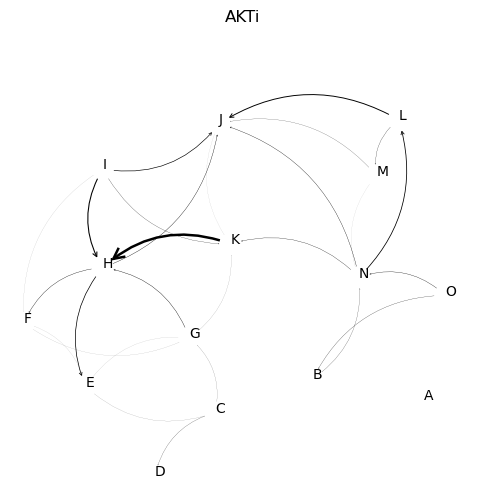

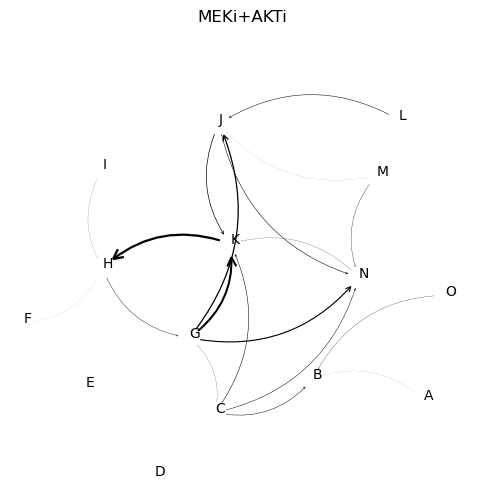

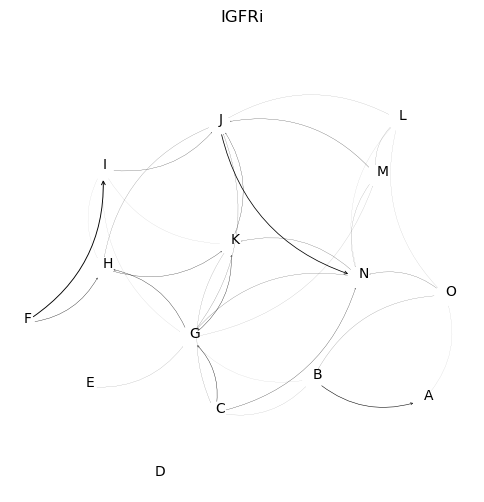

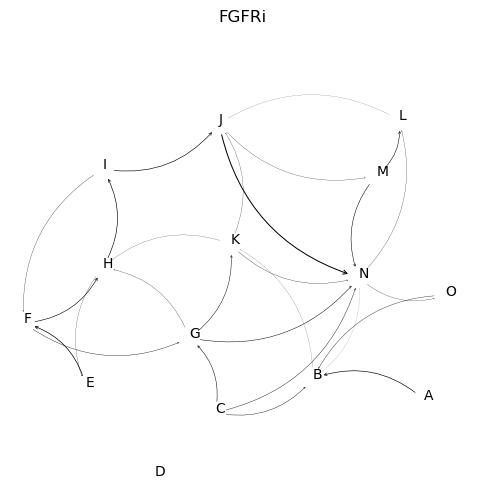

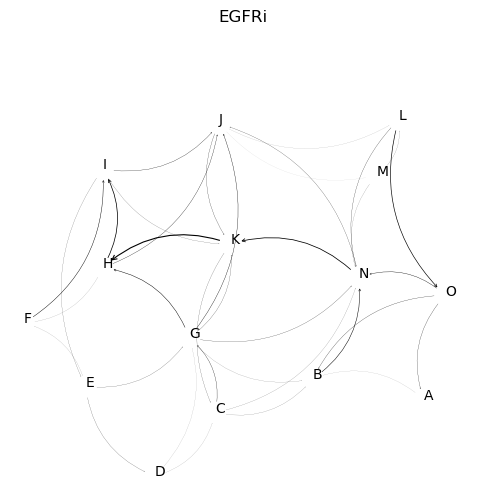

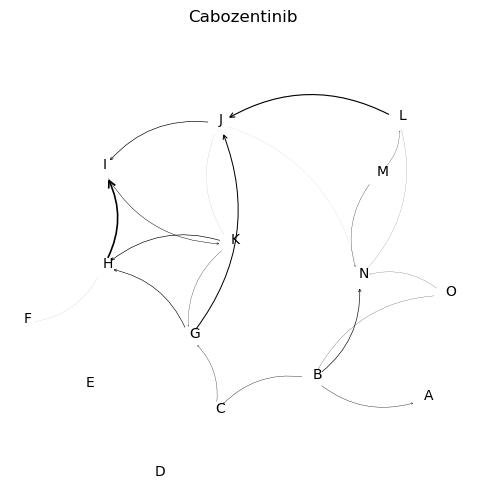

In [615]:
pcut=.001
fcut=.0001
rad=.3
mscale=2200
arrowstyle='->'
lws=200.
sh=8
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
#MtSet=[None]*nf
for i in range(nf):
    plt.figure(figsize=(6,6))
    #plt.subplot(4,4,i+2)
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    #MtSet[i]=Mt.copy()
    #Mt=MtSet[i]
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            fluxjk=state_probs[i,j]*Mt[j,k]
            fluxkj=state_probs[i,j]*Mt[k,j]
            flux=fluxjk-fluxkj
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])

plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'.png')
plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'.pdf')
plt.pause(.1)

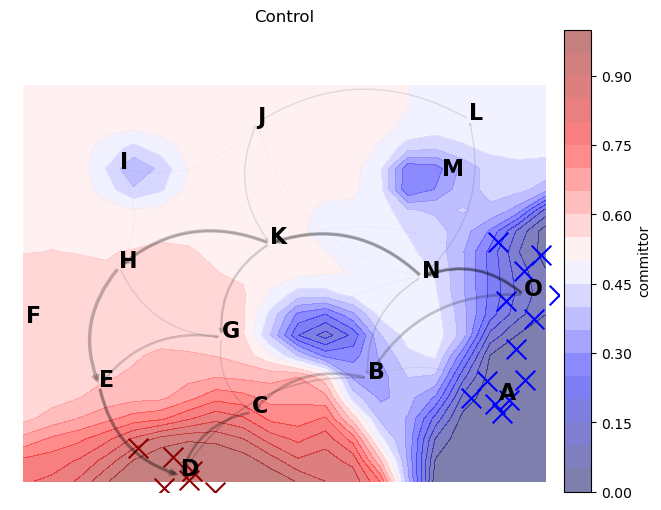

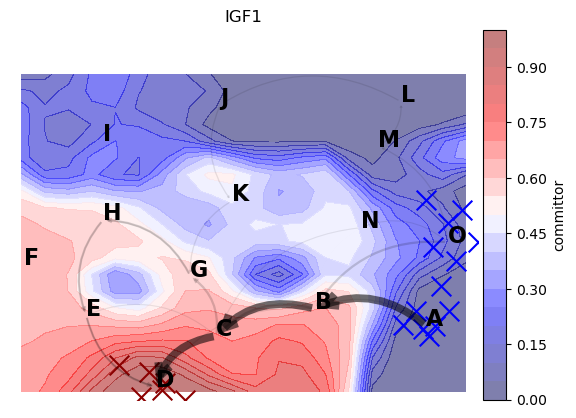

Matrix is singular.
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately


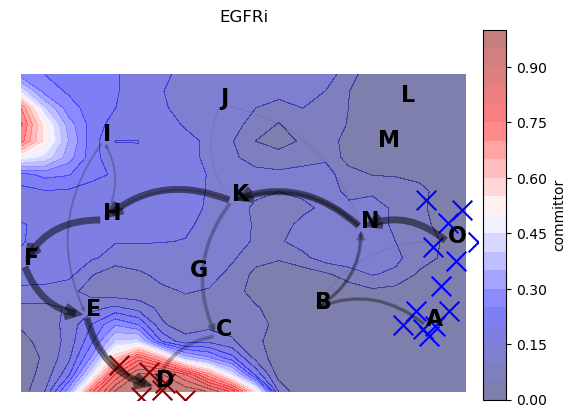

Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately


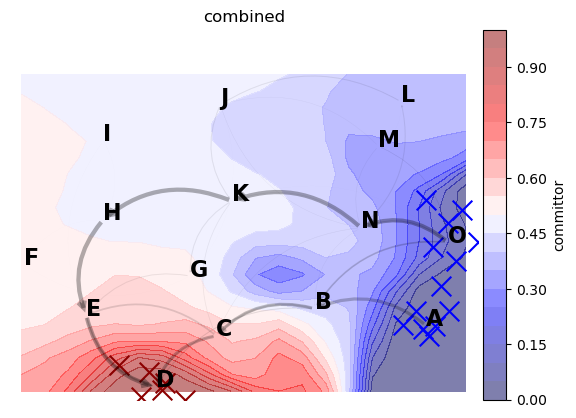

In [618]:
MtCG=model.get_transition_matrix_CG(x0set,x1set,clusters=clusters_minima,states=stateSet);
pcut=.05
fcut=0.
rad=.3
mscale=40.
arrowstyle='->'
lws=10.
sh=2
state_centers=state_centers_minima
commsize=100
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
plt.figure(figsize=(7.5,6))
stateA=[0,14]#,2,3]; 
stateB=[3]
indSource=np.array([]).astype(int)
for isource in stateA:
    inds=np.where(stateSet==isource)[0]
    indSource=np.append(indSource,inds)

indTargets=np.array([]).astype(int)
for itargets in stateB:
    inds=np.where(stateSet==itargets)[0]
    indTargets=np.append(indTargets,inds)

for i in range(nf+1):
    #plt.subplot(4,4,i+2)
    plt.clf()
    if i<nf:
        Tmatrix=MtSet[i]
    else:
        Tmatrix=P
    indNotTargets=np.setdiff1d(range(Tmatrix.shape[0]),indTargets)
    indNotSource=np.setdiff1d(range(Tmatrix.shape[0]),indSource)
    prob=prob1
    levels=np.linspace(np.min(prob[prob>0]),np.max(prob),20)
    #plt.contourf(xx,yy,prob.T,levels=levels,cmap=plt.cm.gray_r,alpha=0.8)
    q=model.get_committor(Tmatrix,indTargets,indSource,conv=1.e-5)
    #plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=q,cmap=plt.cm.gist_heat,marker='o',vmin=0.,vmax=1.)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=nbins,weights=q.flatten())
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx1,yy1=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(0,1,21) #np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.seismic,levels=levels,alpha=0.5)
    cbar=utilities.colorbar(cs)
    cbar.set_label('committor')
    plt.scatter(x_clusters[indTargets,0],x_clusters[indTargets,1],s=200,c='darkred',marker='x')
    plt.scatter(x_clusters[indSource,0],x_clusters[indSource,1],s=200,c='blue',marker='x')
    #pts=np.array([xx1.flatten(),yy1.flatten()]).T
    #indpts=clusters_2d.assign(pts)
    #states=stateSet[indpts]
    #plt.contour(xx,yy,states.reshape(nbins,nbins),levels=np.arange(nstates),colors='black')
    try:
        if i<nf:
            TmatrixCG=MtSetCG[i]
        else:
            TmatrixCG=MtCG
        tpt=msmtools.flux.tpt(TmatrixCG,stateA,stateB)
        pathways=tpt.pathways()
        paths=pathways[0]
        capacities=pathways[1]
        ax=plt.gca()
        for ipath in range(-1,-len(paths)-1,-1):
            statepath=paths[ipath]
            colorpath=capacities[ipath]/np.sum(capacities)
            for ipath in range(statepath.size-1):
                j=statepath[ipath]
                k=statepath[ipath+1]
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*colorpath,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*colorpath,joinstyle='miter',capstyle='butt',alpha=colorpath) #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
        for j in range(n_states):
            scolor=tpt.committor[j]+.01
            #plt.scatter(state_centers[j,0],state_centers[j,1],s=commsize,c=plt.cm.gist_heat(scolor),alpha=0.3)
            plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',weight='bold',fontsize=16,ma='center')
        plt.xlim(xmin,xmax)
        plt.ylim(ymin,ymax+.5)
        plt.axis('off')
        if i<nf:
            plt.title(tmSet[i])
            tstr=tmSet[i]
        else:
            plt.title('combined')
            tstr='combined'
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tstr}_nS{nstates}.png')
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tstr}_nS{nstates}.pdf')
        plt.pause(5)
    except Exception as e:
        print(e)

q_states=np.zeros(nstates)
for istate in range(nstates):
    indstate=np.where(stateSet==istate)[0]
    q_states[istate]=np.mean(q[indstate,0])

state_order=np.argsort(q_states)

#### KMD

In [ ]:
test_start_frame=142
#testing_models=np.random.choice(indgood_models.size,ntest,replace=False)
testing_models=np.arange(indgood_models.size).astype(int)
#testing_models=np.arange(8).astype(int)
training_models=np.setdiff1d(np.arange(indgood_models.size).astype(int),testing_models)
testing_models=indgood_models[testing_models]
training_models=indgood_models[training_models]
inds_trajset_training=np.array([]).astype(int)
for imodel in training_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    inds_trajset_training=np.append(inds_trajset_training,indmodel)

inds_trajset_testing=np.array([]).astype(int)
inds_trajset_testing_cellinds=np.array([]).astype(int)
for imodel in testing_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    cellinds_model=modelSet[imodel].traj[inds_trajsteps[indmodel,1],-1]
    frames_model=modelSet[imodel].cells_frameSet[cellinds_model]
    inds_trajset_training=np.append(inds_trajset_training,indmodel[frames_model<=test_start_frame])
    inds_trajset_testing=np.append(inds_trajset_testing,indmodel[frames_model==test_start_frame])
    inds_trajset_testing_cellinds=np.append(inds_trajset_testing_cellinds,cellinds_model[frames_model==test_start_frame])

ntest_traj=inds_trajset_testing_cellinds.size
test_trajectories=[None]*ntest_traj
for itest in range(ntest_traj):
    indcell=inds_trajset_testing_cellinds[itest]
    imodel=inds_trajsteps_models[inds_trajset_testing[itest]]
    for itraj in range(len(modelSet[imodel].trajectories)):
        if np.sum(np.where(modelSet[imodel].trajectories[itraj]==indcell)[0])>0:
            cell_traj=modelSet[imodel].trajectories[itraj]
            start=np.where(cell_traj==indcell)[0]
            test_trajectories[itest]=cell_traj[start[0]:]

nplots=int(np.ceil(np.sqrt(ntest_traj)))
test_stds=np.zeros(ntest_traj)
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
#plt.clf()
for itraj in range(ntest_traj):
    imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
    #plt.subplot(nplots,nplots,itraj+1)
    obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
    test_stds[itraj]=np.std(obs_test)

In [ ]:
feature_list

In [ ]:
def get_primary_frequency(series):
    rtha=np.abs(np.fft.fft(series))
    freq=np.fft.fftfreq(series.size)
    indf=freq>=0
    freq=freq[indf]
    rtha=rtha[indf]
    indsort=np.argsort(freq)
    freq=freq[indsort]
    rtha=rtha[indsort]
    rtha=rtha/np.sum(rtha)
    #mean_freq=np.sum(np.multiply(rtha,freq))
    mfreq=freq[np.argmax(rtha)]
    return mfreq

def average_delays_test(X_pred,trajl):
    test_steps=X_pred.shape[0]
    ncopies=int(X_pred.shape[1]/trajl)
    obs_pred_all=np.ones((ncopies,test_steps+trajl-1,trajl))*np.nan
    for icopy in range(ncopies):
        for itt in range(trajl):
            inds=np.arange(itt,itt+test_steps).astype(int)
            obs_pred_all[icopy,inds,itt]=X_pred[:,itt+icopy*trajl]
    obs_pred=np.nanmean(obs_pred_all,axis=(0,2))[(trajl-1):]
    return obs_pred

def organize_modes(wam):
    nmodes=wam.size
    mode_index=[]
    mode_absj=np.array([]).astype('complex128')
    wam_orig=wam.copy()
    while wam.size>0:
        w=wam[0]
        imode=np.where(wam_orig==w)[0][0]
        modeset=np.array([imode]).astype(int)
        imode_conj=np.where(wam_orig==np.conj(w))[0]
        if imode_conj.size>0 and imode_conj!=imode:
            modeset=np.append(modeset,imode_conj)
        mode_index.append(modeset)
        mode_absj=np.append(mode_absj,complex(np.real(w),np.abs(np.imag(w))))
        inds_leftover=np.setdiff1d(np.arange(wam.size).astype(int),np.arange(modeset.size))
        wam=wam[inds_leftover]
    return mode_index,mode_absj

def load_koopman_fromdict(koopman_dict): #koopman_dict = {"K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V}
    K=koopman_dict["K"]; M=koopman_dict["M"]; Xi=koopman_dict["Xi"]; Lam=koopman_dict["Lam"];
    W=koopman_dict["W"]; phi_X=koopman_dict["phi_X"]; V=koopman_dict["V"]
    return K,M,Xi,Lam,W,phi_X,V

In [ ]:
nplot_traj=inds_trajset_testing.size
#inds_plot=np.array([0,1,3,5,6,8,10,11,23,25,26,29,38,41,45,52]).astype(int);nplots=4
inds_plot=np.argsort(test_stds)[-nplot_traj:];nplots=int(np.ceil(np.sqrt(nplot_traj)));
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
ntraining_transitions=inds_trajset_training.size
inds_train=inds_trajset_training
#ntraining_transitions=1500
#inds_train=np.random.choice(inds_trajset_training,ntraining_transitions,replace=False)
inds_train=np.append(inds_train,inds_trajset_testing)
inds_test_starts=np.arange(ntraining_transitions,ntraining_transitions+ntest_traj).astype(int)
X=x0set[inds_train,:]
Y=x1set[inds_train,:]
#apply boundary conditions
#Acut=-2.;Bcut=2.
#indsA_X=np.where(X[:,-1]<Acut)[0]
#indsA_Y=np.where(Y[:,-1]<Acut)[0]
#indsB_X=np.where(X[:,-1]>Bcut)[0]
#indsB_Y=np.where(Y[:,-1]>Bcut)[0]
#Y[indsA_X,:]=1.e6 #anything in A goes to cemetery after one step
#Y[indsB_X,:]=-1.e6 #X[indsB_X,:] #anything in B stays in B
kname=f'koopman_trajl{trajl}_ERKonly1D_ntrain{ntraining_transitions}'
#1D-ification X=X[:,-1][:,np.newaxis]; Y=Y[:,-1][:,np.newaxis]
n_iterations=10
koopman_models=[None]*n_iterations
s=.1
#lamcut=0. #ntraining_transitions+inds_trajset_test.size
#lamcut_M=.9
M=np.eye(X.shape[1])
test_steps=48 #modelSet[0].nt-test_start_frame
test_frames=np.arange(test_start_frame,test_start_frame+test_steps).astype(int)
#nplots=int(np.ceil(np.sqrt(nplot_traj))); inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
rmse_iters=np.zeros(n_iterations)
corr_iters=np.zeros(n_iterations)
plt.close('all')
fig4=plt.figure(4,figsize=(14,12))
fig1=plt.figure(1,figsize=(14,12))
fig2=plt.figure(2,figsize=(8,6))
fig3=plt.figure(3,figsize=(9.4,4.5))
realcut=-0.05;imagcut=np.pi/16. #np.inf
X_orig=X.copy();Y_orig=Y.copy()
betaM=.001
for i_iter in range(n_iterations):
    M=(1.-betaM)*M+betaM*np.eye(X.shape[1])
    #dmat=scipy.spatial.distance.cdist(np.matmul(X,M),np.matmul(Y,M));plt.figure(3);plt.clf();sigma=get_scaled_sigma(dmat,visual=True);plt.pause(.1);h=np.ones(X.shape[0])*sigma
    XX=np.matlib.repmat(X,1,int(M.shape[1]/X.shape[1]));YY=np.matlib.repmat(Y,1,int(M.shape[1]/Y.shape[1]))
    h=model.get_kernel_sigmas(XX,M,s=s)
    psi_X=model.get_gaussianKernelM(XX,XX,M,h)
    psi_Y=model.get_gaussianKernelM(XX,YY,M,h)
    #K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M.astype('float64'),h=h.astype('float64'),psi_X=psi_X.astype('float64'),psi_Y=psi_Y.astype('float64'))
    K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M,h=h,psi_X=psi_X,psi_Y=psi_Y)
    wam=np.log(np.diag(Lam))
    lam=np.diag(Lam)
    indmodes=np.where(np.logical_and(np.real(wam)<0.15,np.abs(np.imag(wam))<np.pi/3.))[0]
    #indmodes=np.where(np.logical_and(np.real(wam)<np.inf,np.abs(np.imag(wam))<np.inf))[0]
    if indmodes.size==0:
        indmodes=np.array([0]).astype(int)
    phi_X,V=model.get_koopman_modes(psi_X,Xi[:,indmodes],W[:,indmodes],XX)
    spatial_frequencies=np.zeros(indmodes.size)
    for imode in range(indmodes.size):
        spatial_frequencies[imode]=get_primary_frequency(V[:,imode])
    indspatial=np.where(spatial_frequencies<.1)[0]
    wam_reconstr=wam[indmodes]
    lam_reconstr=lam[indmodes]
    indmodes_M1=np.where(np.logical_and(np.real(wam_reconstr)>realcut,np.abs(np.imag(wam_reconstr))<imagcut))[0];indmodes_M1=np.intersect1d(indmodes_M1,indspatial)
    indmodes_noimaginary=np.where(np.sum(np.abs(np.imag(phi_X)),axis=0)==0.)[0]; indmodes_M2=indmodes_noimaginary[np.logical_and(np.real(wam[indmodes_noimaginary])>realcut,np.abs(np.imag(wam_reconstr[indmodes_noimaginary]))<imagcut)];
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    indmodes_M1=np.setdiff1d(indmodes_M1,indmodes_M2) #indmodes_M=np.array([indmodes_M1[0],indmodes_M2[0]])
    if indmodes_M1.size==0:
        indmodes_M1=np.array([np.setdiff1d(indmodes,indmodes_M2)[0]])
    plt.figure(4);plt.clf()
    for i in range(81):
        imode=indmodes[i];vim=np.zeros((test_steps,XX.shape[1])).astype('complex128');vim[0,:]=V[:,i];nm=48
        for inm in range(1,test_steps):
            vim[inm,:]=vim[inm-1,:]*lam[imode]
        plt.subplot(9,9,i+1);plt.imshow(np.real(vim),cmap=plt.cm.seismic,origin='lower');plt.axis('off')
        if np.isin(imode,indmodes[indmodes_M1]):
            plt.title(f'{wam[imode]:.2f}',color='red',fontweight='bold')
        elif np.isin(imode,indmodes[indmodes_M2]):
            plt.title(f'{wam[imode]:.2f}',color='green',fontweight='bold')
        else:
            plt.title(f'{wam[imode]:.2f}',color='gray')
    plt.savefig(f'{date}/{kname}_modeselectionlines_iter{i_iter}_{figid}.png');plt.pause(.1)
    print(f'iteration {i_iter} using {indmodes.size} koopman modes...')
    X_preds=model.get_koopman_inference_multiple(inds_test_starts,test_steps,phi_X,V,Lam,nmodes=indmodes)
    test_obs_trajectories=[None]*ntest_traj; pred_obs_trajectories=[None]*ntest_traj
    rmses=[];corrs=[];traj_lengths=np.zeros(ntest_traj).astype(int);
    for itraj in range(ntest_traj):
        X_pred=X_preds[itraj,...]
        obs_pred=obs_pred=X_pred[:,ind_obs_pred-pca.ndim]
        #obs_pred=average_delays_test(X_pred,trajl) #obs_pred=X_pred[:,-1]
        imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
        obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
        nobs=np.min([obs_test.size,obs_pred.size])
        test_obs_trajectories[itraj]=obs_test;pred_obs_trajectories[itraj]=obs_pred
        rmse=np.linalg.norm(obs_test[0:nobs]-obs_pred[0:nobs])/np.linalg.norm(obs_test[0:nobs])
        corr=np.corrcoef(obs_test[0:nobs],obs_pred[0:nobs])[0,1]
        rmses.append(rmse);corrs.append(corr);traj_lengths[itraj]=nobs
    plt.figure(1);plt.clf();#inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
    for iplot in range(nplot_traj):
        itraj=inds_plot[iplot]
        if test_trajectories[itraj] is not None:
            obs_pred=pred_obs_trajectories[itraj];obs_test=test_obs_trajectories[itraj];nobs=np.min([obs_test.size,obs_pred.size])
            plt.subplot(nplots,nplots,iplot+1)
            plt.plot(test_frames[0:nobs],obs_pred[0:nobs],'k--');plt.plot(test_frames[0:nobs],obs_test[0:nobs],'k-');plt.ylim(-3.5,2.6);
            plt.title(f'e: {rmses[itraj]:.2f} c: {corrs[itraj]:.2f}');ax=plt.gca();#ax.set_yticklabels([None]*len(ax.get_yticklabels()))
            ax.spines['bottom'].set_position('zero');ax.spines['right'].set_color('none');ax.spines['top'].set_color('none');ax.xaxis.set_ticks_position('bottom');ax.yaxis.set_ticks_position('left')
            ax.spines['left'].set_color('none');ax.set_xticklabels([None]*len(ax.get_xticklabels()));plt.pause(.05)
    plt.savefig(f'{date}/{kname}_test_iter{i_iter}_{figid}.png');plt.pause(.1);
    plt.figure(3);plt.clf()
    rmse_tests=np.zeros(test_steps);corr_tests=np.zeros(test_steps);xset_test=np.ones((ntest_traj,test_steps));xset_pred=np.ones((ntest_traj,test_steps))
    for istep in range(test_steps):
        indtraj=np.where(traj_lengths>istep)[0]
        for itraj in range(ntest_traj):
            if traj_lengths[itraj]>istep:
                xset_test[itraj,istep]=test_obs_trajectories[itraj][istep]
                xset_pred[itraj,istep]=pred_obs_trajectories[itraj][istep]
        rmse_tests[istep]=np.linalg.norm(xset_test[indtraj,istep]-xset_pred[indtraj,istep])/np.linalg.norm(xset_test[indtraj,istep])
        corr_tests[istep]=np.corrcoef(xset_test[indtraj,istep],xset_pred[indtraj,istep])[0,1]
    plt.subplot(1,2,1);plt.plot(rmse_tests,'ko-');plt.xlabel('test frame');plt.ylabel('RMSE');plt.yscale('log');plt.ylim(.3,5.)
    plt.subplot(1,2,2);plt.plot(corr_tests,'ko-');plt.xlabel('test frame');plt.ylabel('correlation');plt.ylim(-.2,1);
    plt.savefig(f'{date}/{kname}_errortime_iter{i_iter}_{figid}.png');plt.pause(.1);
    koopman_dict = {"inds_train":inds_train, "K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V, "pred_obs_trajectories":pred_obs_trajectories, "rmse_tests":rmse_tests, "corr_tests":corr_tests}
    koopman_models[i_iter]=koopman_dict
    corr_iters[i_iter]=np.mean(corrs);rmse_iters[i_iter]=np.mean(rmses);
    Mprev=M.copy()
    print(f'iteration {i_iter} updating M with {indmodes_M1.size} flux modes and {indmodes_M2.size} stationary modes...')
    #M=model.update_mahalanobis_matrix_grad(Mprev,X,phi_X[:,indmodes_M2],h=h,s=s)
    #M=model.update_mahalanobis_matrix_flux(Mprev,X,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s)
    #M=model.update_mahalanobis_matrix_J(Mprev,X,phi_X[:,indmodes_M],V[:,indmodes_M],Lam[indmodes[indmodes_M],:][:,indmodes[indmodes_M]],h=h,s=s)
    #plt.figure(2);plt.clf();plt.imshow(M,origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2))
    #plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.pause(.5);plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png')
    #mode_index,mode_absj=organize_modes(wam_reconstr);Mset=[]
    #for imode in range(mode_absj.size):
    #    if np.isin(mode_index[imode],indmodes_M1).any():
    #        indM=np.append(indM,mode_index[imode])
    #        M_one=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indM],h=h,s=s);Mset.append(M_one)
            #M_one=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
            #M_one=M=model.update_mahalanobis_matrix_flux(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
    Mset=[];#indmodes_M2=np.append(indmodes_M1,indmodes_M2)
    #M2=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indmodes_M2],h=h,s=s);Mset.append(M2)
    indmodes_M2=np.append(indmodes_M2,indmodes_M1)
    M2=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M2]],V[:,indmodes_M2],lam_reconstr[indmodes_M2],h=h,s=s);Mset.append(M2)
    plt.figure(2);plt.clf();plt.imshow(np.abs(M2),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    #indmodes_M1=np.arange(10).astype(int)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s);Mset.append(M1)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M1]],V[:,indmodes_M1],lam_reconstr[indmodes_M1],h=h,s=s);Mset.append(M1)
    #plt.figure(2);plt.clf();plt.imshow(np.abs(M1),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    M=scipy.linalg.block_diag(*Mset)
    plt.figure(2);plt.clf();plt.imshow(np.real(M),origin='lower',cmap=plt.cm.Blues,clim=(-0.02,.2));
    if np.sum(np.imag(M))/np.sum(np.real(M))>1.e-10:
        plt.imshow(np.ma.masked_where(np.abs(np.imag(M))<np.mean(np.imag(M))+2*np.std(np.imag(M)),np.imag(M)),origin='lower',cmap=plt.cm.Reds,clim=(-.02,.02),alpha=.4);
    plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png');plt.pause(.5);

In [ ]:
inds_trajset_testing.shape

In [ ]:
np.histogram(corrc,bins=100)

In [ ]:
chist,cbins=np.histogram(corrc,bins=100)

In [ ]:
plt.plot(cbins[1:],chist)

In [ ]:
plt.scatter(np.mean(corrc_full_traj,axis=1),np.mean(d_f,axis=1),s=5,c='black',marker='.')

In [ ]:
np.corrcoef(np.mean(cs_full_traj.astype(float),axis=1),np.nanmean(cb_ratio_full_traj,axis=1))

In [ ]:
cs_full_traj=corrc_full_traj>np.mean(corrc_full_traj)

In [ ]:
x.shape

In [ ]:
cs_full_traj